In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import polars as pl
import matplotlib.pyplot as plt
from matplotlib import pyplot

In [3]:
df_everything_stats_sa199m2e = pd.read_csv('sa199m2e_new_newest_everything_stats.csv')
df_everything_stats_sa196m2e = pd.read_csv('sa196m2e_new_newest_everything_stats.csv')
df_everything_stats_sa196m1e = pd.read_csv('sa196m1e_new_newest_everything_stats.csv')
df_everything_stats_sa198m2e = pd.read_csv('sa198m2e_new_newest_everything_stats.csv')
df_everything_stats_sa196m3e = pd.read_csv('sa196m3e_new_newest_everything_stats.csv')
df_everything_stats_sa199m3e = pd.read_csv('sa199m3e_new_newest_everything_stats.csv')
df_everything_stats_sa199m1e = pd.read_csv('sa199m1e_new_newest_everything_stats.csv')
df_everything_stats_sa78m1 = pd.read_csv('sa78m1_new_newest_everything_stats.csv')
df_everything_stats_sa78m3 = pd.read_csv('sa78m3_new_newest_everything_stats.csv')
df_everything_stats_sa78m5 = pd.read_csv('sa78m5_new_newest_everything_stats.csv')

In [4]:
'''
function to chance nomenclature of choice output (2, 3, 4, or 5) to (0 - decrease, 1 - maintained, or 2 - improved)
'''
def set_new_class_individual(df_everything):
    df_new_class = df_everything.copy()
    new_class=[1];
    
    for ind in range(1, len(df_new_class)):
        c = (df_new_class['Choice Output'][ind]-df_new_class['Choice Output'][ind-1])
        if (c > 0):
            new_class.append(2)
        elif (c == 0):
            new_class.append(1)
        elif (c < 0):
            new_class.append(0)
    df_new_class['New Class'] = new_class;
    return df_new_class;

In [5]:
df_new_class_sa199m2e = set_new_class_individual(df_everything_stats_sa199m2e)
df_new_class_sa196m2e = set_new_class_individual(df_everything_stats_sa196m2e)
df_new_class_sa196m1e = set_new_class_individual(df_everything_stats_sa196m1e)
df_new_class_sa198m2e = set_new_class_individual(df_everything_stats_sa198m2e)
df_new_class_sa196m3e = set_new_class_individual(df_everything_stats_sa196m3e)
df_new_class_sa199m3e = set_new_class_individual(df_everything_stats_sa199m3e)
df_new_class_sa199m1e = set_new_class_individual(df_everything_stats_sa199m1e)
df_new_class_sa78m1 = set_new_class_individual(df_everything_stats_sa78m1)
df_new_class_sa78m3 = set_new_class_individual(df_everything_stats_sa78m3)
df_new_class_sa78m5 = set_new_class_individual(df_everything_stats_sa78m5)

In [6]:
'''
function to create the lagging for all previous 4 choices
'''
def lagging_four_prev_choices(df_pls, mouse_id):
    lagged_df_everything_stats = df_pls.select(
    
    "Middle Duration", 
    *[pl.col("Middle Duration").shift(i).alias(f"lagged_{i}_mid_duration") for i in [1,2,3,4]],
    "Middle Nose Movement", 
    *[pl.col("Middle Nose Movement").shift(i).alias(f"lagged_{i}_mid_nose_mov") for i in [1,2,3,4]],
    "Middle Nose Velocity", 
    *[pl.col("Middle Nose Velocity").shift(i).alias(f"lagged_{i}_mid_nose_vel") for i in [1,2,3,4]],
    "Middle Tail Movement", 
    *[pl.col("Middle Tail Movement").shift(i).alias(f"lagged_{i}_mid_tail_mov") for i in [1,2,3,4]],
    "Middle Tail Velocity", 
    *[pl.col("Middle Tail Velocity").shift(i).alias(f"lagged_{i}_mid_tail_vel") for i in [1,2,3,4]],       
        
    "Middle Tortuosity", 
    *[pl.col("Middle Tortuosity").shift(i).alias(f"lagged_{i}_mid_tortuosity") for i in [1,2,3,4]],          
    
    "Current Coeff", 
    *[pl.col("Current Coeff").shift(i).alias(f"lagged_{i}_current_coeff") for i in [1,2,3,4]],   
    "Lagged 1 Cur Coeff", 
    *[pl.col("Lagged 1 Cur Coeff").shift(i).alias(f"lagged_{i}_lagged_1_cur_coeff") for i in [1,2,3,4]],
    "Lagged 2 Cur Coeff", 
    *[pl.col("Lagged 2 Cur Coeff").shift(i).alias(f"lagged_{i}_lagged_2_cur_coeff") for i in [1,2,3,4]],
    "Lagged 3 Cur Coeff", 
    *[pl.col("Lagged 3 Cur Coeff").shift(i).alias(f"lagged_{i}_lagged_3_cur_coeff") for i in [1,2,3,4]],
    "Lagged 4 Cur Coeff", 
    *[pl.col("Lagged 4 Cur Coeff").shift(i).alias(f"lagged_{i}_lagged_4_cur_coeff") for i in [1,2,3,4]],

    "New Current Coeff", 
    *[pl.col("New Current Coeff").shift(i).alias(f"lagged_{i}_new_current_coeff") for i in [1,2,3,4]],   
    "New Lagged 1 Cur Coeff", 
    *[pl.col("New Lagged 1 Cur Coeff").shift(i).alias(f"lagged_{i}_new_lagged_1_cur_coeff") for i in [1,2,3,4]],
    "New Lagged 2 Cur Coeff", 
    *[pl.col("New Lagged 2 Cur Coeff").shift(i).alias(f"lagged_{i}_new_lagged_2_cur_coeff") for i in [1,2,3,4]],
    "New Lagged 3 Cur Coeff", 
    *[pl.col("New Lagged 3 Cur Coeff").shift(i).alias(f"lagged_{i}_new_lagged_3_cur_coeff") for i in [1,2,3,4]],
    "New Lagged 4 Cur Coeff", 
    *[pl.col("New Lagged 4 Cur Coeff").shift(i).alias(f"lagged_{i}_new_lagged_4_cur_coeff") for i in [1,2,3,4]],
    
    "Current Coeff Time Proportional", 
    *[pl.col("Current Coeff Time Proportional").shift(i).alias(f"lagged_{i}_current_coeff_time_prop") for i in [1,2,3,4]],
    "Lagged 1 Cur Coeff Time Proportional", 
    *[pl.col("Lagged 1 Cur Coeff Time Proportional").shift(i).alias(f"lagged_{i}_lagged_1_cur_coeff_time_prop") for i in [1,2,3,4]],
    "Lagged 2 Cur Coeff Time Proportional", 
    *[pl.col("Lagged 2 Cur Coeff Time Proportional").shift(i).alias(f"lagged_{i}_lagged_2_cur_coeff_time_prop") for i in [1,2,3,4]],
    "Lagged 3 Cur Coeff Time Proportional", 
    *[pl.col("Lagged 3 Cur Coeff Time Proportional").shift(i).alias(f"lagged_{i}_lagged_3_cur_coeff_time_prop") for i in [1,2,3,4]],
    "Lagged 4 Cur Coeff Time Proportional", 
    *[pl.col("Lagged 4 Cur Coeff Time Proportional").shift(i).alias(f"lagged_{i}_lagged_4_cur_coeff_time_prop") for i in [1,2,3,4]],

    "New Current Coeff Time Proportional", 
    *[pl.col("New Current Coeff Time Proportional").shift(i).alias(f"lagged_{i}_new_current_coeff_time_prop") for i in [1,2,3,4]],
    "New Lagged 1 Cur Coeff Time Proportional", 
    *[pl.col("New Lagged 1 Cur Coeff Time Proportional").shift(i).alias(f"lagged_{i}_new_lagged_1_cur_coeff_time_prop") for i in [1,2,3,4]],
    "New Lagged 2 Cur Coeff Time Proportional", 
    *[pl.col("New Lagged 2 Cur Coeff Time Proportional").shift(i).alias(f"lagged_{i}_new_lagged_2_cur_coeff_time_prop") for i in [1,2,3,4]],
    "New Lagged 3 Cur Coeff Time Proportional", 
    *[pl.col("New Lagged 3 Cur Coeff Time Proportional").shift(i).alias(f"lagged_{i}_new_lagged_3_cur_coeff_time_prop") for i in [1,2,3,4]],
    "New Lagged 4 Cur Coeff Time Proportional", 
    *[pl.col("New Lagged 4 Cur Coeff Time Proportional").shift(i).alias(f"lagged_{i}_new_lagged_4_cur_coeff_time_prop") for i in [1,2,3,4]],    
    
    "Entry Latency", 
    *[pl.col("Entry Latency").shift(i).alias(f"lagged_{i}_entry_lat") for i in [1,2,3,4]],
    "Entry Latency Nose Movement", 
    *[pl.col("Entry Latency Nose Movement").shift(i).alias(f"lagged_{i}_entry_lat_nose_mov") for i in [1,2,3,4]],
    "Entry Latency Nose Velocity", 
    *[pl.col("Entry Latency Nose Velocity").shift(i).alias(f"lagged_{i}_entry_lat_nose_vel") for i in [1,2,3,4]],
    "Entry Latency Tail Movement", 
    *[pl.col("Entry Latency Tail Movement").shift(i).alias(f"lagged_{i}_entry_lat_tail_mov") for i in [1,2,3,4]],
    "Entry Latency Tail Velocity", 
    *[pl.col("Entry Latency Tail Velocity").shift(i).alias(f"lagged_{i}_entry_lat_tail_vel") for i in [1,2,3,4]],   
 
    "Duration", 
    *[pl.col("Duration").shift(i).alias(f"lagged_{i}_duration") for i in [1,2,3,4]],
    "Nose Max Distance",
    *[pl.col("Nose Max Distance").shift(i).alias(f"lagged_{i}_nose_max_distance") for i in [1,2,3,4]],    
    "Nose Time to Max Dist",
    *[pl.col("Nose Time to Max Dist").shift(i).alias(f"lagged_{i}_nose_time_to_max_dist") for i in [1,2,3,4]],        
    "Tail Base Max Distance",
    *[pl.col("Tail Base Max Distance").shift(i).alias(f"lagged_{i}_tail_max_distance") for i in [1,2,3,4]],    
    "Tail Base Time to Max Dist",
    *[pl.col("Tail Base Time to Max Dist").shift(i).alias(f"lagged_{i}_tail_time_to_max_dist") for i in [1,2,3,4]],       
    "Arm Nose Movement", 
    *[pl.col("Arm Nose Movement").shift(i).alias(f"lagged_{i}_arm_nose_mov") for i in [1,2,3,4]],
    "Arm Nose Velocity", 
    *[pl.col("Arm Nose Velocity").shift(i).alias(f"lagged_{i}_arm_nose_vel") for i in [1,2,3,4]],
    "Arm Tail Movement", 
    *[pl.col("Arm Tail Movement").shift(i).alias(f"lagged_{i}_arm_tail_mov") for i in [1,2,3,4]],
    "Arm Tail Velocity", 
    *[pl.col("Arm Tail Velocity").shift(i).alias(f"lagged_{i}_arm_tail_vel") for i in [1,2,3,4]],
    "Entry Tortuosity",
    *[pl.col("Entry Tortuosity").shift(i).alias(f"lagged_{i}_entry_tortuosity") for i in [1,2,3,4]],       
    "Exit Tortuosity",
    *[pl.col("Exit Tortuosity").shift(i).alias(f"lagged_{i}_exit_tortuosity") for i in [1,2,3,4]],    
    "Other Tortuosity",
    *[pl.col("Other Tortuosity").shift(i).alias(f"lagged_{i}_other_tortuosity") for i in [1,2,3,4]],    

    "Exit Latency", 
    *[pl.col("Exit Latency").shift(i).alias(f"lagged_{i}_exit_lat") for i in [1,2,3,4]], 
    "Exit Latency Nose Movement", 
    *[pl.col("Exit Latency Nose Movement").shift(i).alias(f"lagged_{i}_exit_lat_nose_mov") for i in [1,2,3,4]],
    "Exit Latency Nose Velocity", 
    *[pl.col("Exit Latency Nose Velocity").shift(i).alias(f"lagged_{i}_exit_lat_nose_vel") for i in [1,2,3,4]],
    "Exit Latency Tail Movement", 
    *[pl.col("Exit Latency Tail Movement").shift(i).alias(f"lagged_{i}_exit_lat_tail_mov") for i in [1,2,3,4]],
    "Exit Latency Tail Velocity", 
    *[pl.col("Exit Latency Tail Velocity").shift(i).alias(f"lagged_{i}_exit_lat_tail_vel") for i in [1,2,3,4]],   

    "ExitMid Duration",
    *[pl.col("ExitMid Duration").shift(i).alias(f"lagged_{i}_exitmid_duration") for i in [1,2,3,4]],
    "MidEntry Duration", 
    *[pl.col("MidEntry Duration").shift(i).alias(f"lagged_{i}_midentry_duration") for i in [1,2,3,4]],
    "ExitMidEntry Duration",
    *[pl.col("ExitMidEntry Duration").shift(i).alias(f"lagged_{i}_exitmidentry_duration") for i in [1,2,3,4]],
    
    "Turn",
    *[pl.col("Turn").shift(i).alias(f"lagged_{i}_turn_ago") for i in [1,2,3,4]],
     "New Class",
    *[pl.col("New Class").shift(i).alias(f"lagged_{i}_new_class") for i in [1,2,3,4]],
    
    "Choice Output", 
    *[pl.col("Choice Output").shift(i).alias(f"lagged_{i}_choice_ago") for i in [1,2,3,4]]
    )
    lagged_df_everything_stats = lagged_df_everything_stats.drop_nulls()
    
    lagged_df_everything_stats.write_csv(mouse_id+'_newest_lagged_mm_everything_stats.csv')
    return lagged_df_everything_stats;

In [7]:
list = [1,2,3,4,5]

In [8]:
list = list+([np.nan]*2)

In [9]:
list

[1, 2, 3, 4, 5, nan, nan]

In [10]:
'''
function that returns df with required means
'''
def get_performance(df_lagged_new_mice, column, number):
    #correct = str(number)+'s_Correct_'+column;
    #incorrect = str(number)+'s_Incorrect_'+column
    val = str(number)+'s_'+column
    #df_means = pd.DataFrame(columns=['mouse', correct, incorrect, 'Choice Output', 'New Class'])
    df_performance = pd.DataFrame(columns=['mouse', val, 'Outcome', 'Choice Output', 'New Class'])
    mouse = []
    choice_output = []
    new_class = []
    #cor = []
    #inc = []
    corinc = []
    values = []
    outcomepercentage = []
    for i in range(0,len(df_lagged_new_mice)):
        m = []
        idx = df_lagged_new_mice.columns.get_loc(column)
        for icol in range(idx, idx+number-1):
            t = df_lagged_new_mice.iloc[i, icol]
            m.append(t)
        tm = np.mean(m)
        values.append(tm)
        if df_lagged_new_mice['Choice Output'][i]<number:
            #inc.append(tm)
            corinc.append('incorrect')
        else:
            #cor.append(tm)
            corinc.append('correct') 
        mouse.append(df_lagged_new_mice['mouse'][i])
        choice_output.append(df_lagged_new_mice['Choice Output'][i])
        new_class.append(df_lagged_new_mice['New Class'][i])
    #l = len(mouse)    
    #print(l)
    #nc = l-len(cor)
    #print(nc)
    #cor = cor + ([np.nan]*nc)
    #ni = l-len(inc)
    #inc = inc + ([np.nan]*ni) 
    
    df_performance['mouse'] = mouse
    #df_means[correct] = cor
    #df_means[incorrect] = inc 
    df_performance[val] = values
    df_performance['Outcome'] = corinc
    df_performance['Choice Output'] = choice_output
    df_performance['New Class'] = new_class
            
    return df_performance;

In [11]:
def get_mean_performances(df_performance):
    mouse = []
    meanval = []
    percent = []
    outcome = []
    mice = set(df_performance['mouse'])
    for m in mice:
        cor =[]
        inc =[]
        for i in range(0, len(df_performance)):
            if df_performance['mouse'][i]==m:
                if df_performance['Outcome'][i]=='correct':
                    cor.append(df_performance.iloc[i,1])
                else:
                    inc.append(df_performance.iloc[i,1])
        tot = len(cor)+len(inc)
        mouse.append(m)
        meanval.append(np.mean(cor))
        percent.append(len(cor)/tot*100)
        outcome.append('correct')
        mouse.append(m)
        meanval.append(np.mean(inc))
        percent.append(len(cor)/tot*100)
        outcome.append('incorrect')        

    df_means = pd.DataFrame({'mouse':mouse, df_performance.columns[1]:meanval, '%':percent, 'Outcome':outcome})

    return df_means;

    

In [12]:
def added_time_means_edited(lagged_df_everything_stats, mouse_id):

    
    f = lagged_df_everything_stats.drop(columns = ['Choice Output', 'lagged_1_choice_ago', 'lagged_2_choice_ago','lagged_3_choice_ago', 
                                                   'lagged_4_choice_ago']);
    r_arm_mean2s = []
    r_arm_mean3s = []
    r_arm_mean4s = []
    r_arm_mean5s = []

    p_arm_mean2s = []
    p_arm_mean3s = []
    p_arm_mean4s = []

    p_mid_mean2s = []
    p_mid_mean3s = []
    p_mid_mean4s = []
    p_mid_mean5s = []

    r_arm_2s = []
    r_arm_3s = []
    r_arm_4s = []
    r_arm_5s = []

    p_arm_2s = []
    p_arm_3s = []
    p_arm_4s = []

    p_mid_2s = []
    p_mid_3s = []
    p_mid_4s = []
    p_mid_5s = []
    
    p_exitmid_2s = []
    p_exitmid_3s = []
    p_exitmid_4s = []
    p_exitmid_5s = []

    p_exitmid_mean2s = []
    p_exitmid_mean3s = []
    p_exitmid_mean4s = []
    p_exitmid_mean5s = []

    p_midentry_2s = []
    p_midentry_3s = []
    p_midentry_4s = []
    p_midentry_5s = []

    p_midentry_mean2s = []
    p_midentry_mean3s = []
    p_midentry_mean4s = []
    p_midentry_mean5s = []
    
    p_exitmidentry_2s = []
    p_exitmidentry_3s = []
    p_exitmidentry_4s = []
    p_exitmidentry_5s = []

    p_exitmidentry_mean2s = []
    p_exitmidentry_mean3s = []
    p_exitmidentry_mean4s = []
    p_exitmidentry_mean5s = []

    
    for i in range(0, len(lagged_df_everything_stats)):
        r_arm_2s.append(np.sum([f['Duration'][i], f['lagged_1_duration'][i]]));
        r_arm_3s.append(np.sum([f['Duration'][i], f['lagged_1_duration'][i], f['lagged_2_duration'][i]]));
        r_arm_4s.append(np.sum([f['Duration'][i], f['lagged_1_duration'][i], f['lagged_2_duration'][i], f['lagged_3_duration'][i]]));
        r_arm_5s.append(np.sum([f['Duration'][i], f['lagged_1_duration'][i], f['lagged_2_duration'][i], f['lagged_3_duration'][i], f['lagged_4_duration'][i]]));        
        
        r_arm_mean2s.append(np.average([f['Duration'][i], f['lagged_1_duration'][i]]));
        r_arm_mean3s.append(np.average([f['Duration'][i], f['lagged_1_duration'][i], f['lagged_2_duration'][i]]));
        r_arm_mean4s.append(np.average([f['Duration'][i], f['lagged_1_duration'][i], f['lagged_2_duration'][i], f['lagged_3_duration'][i]]));
        r_arm_mean5s.append(np.average([f['Duration'][i], f['lagged_1_duration'][i], f['lagged_2_duration'][i], f['lagged_3_duration'][i], f['lagged_4_duration'][i]]));

        p_arm_2s.append(np.sum([f['lagged_1_duration'][i], f['lagged_2_duration'][i]]));
        p_arm_3s.append(np.sum([f['lagged_1_duration'][i], f['lagged_2_duration'][i], f['lagged_3_duration'][i]]));
        p_arm_4s.append(np.sum([f['lagged_1_duration'][i], f['lagged_2_duration'][i], f['lagged_3_duration'][i], f['lagged_4_duration'][i]]));
        
        p_arm_mean2s.append(np.average([f['lagged_1_duration'][i], f['lagged_2_duration'][i]]));
        p_arm_mean3s.append(np.average([f['lagged_1_duration'][i], f['lagged_2_duration'][i], f['lagged_3_duration'][i]]));
        p_arm_mean4s.append(np.average([f['lagged_1_duration'][i], f['lagged_2_duration'][i], f['lagged_3_duration'][i], f['lagged_4_duration'][i]]));
       
        p_mid_2s.append(np.sum([f['Middle Duration'][i], f['lagged_1_mid_duration'][i]]));
        p_mid_3s.append(np.sum([f['Middle Duration'][i], f['lagged_1_mid_duration'][i], f['lagged_2_mid_duration'][i]]));
        p_mid_4s.append(np.sum([f['Middle Duration'][i], f['lagged_1_mid_duration'][i], f['lagged_2_mid_duration'][i], f['lagged_3_mid_duration'][i]]));
        p_mid_5s.append(np.sum([f['Middle Duration'][i], f['lagged_1_mid_duration'][i], f['lagged_2_mid_duration'][i], f['lagged_3_mid_duration'][i], f['lagged_4_mid_duration'][i]]));
        
        p_mid_mean2s.append(np.average([f['Middle Duration'][i], f['lagged_1_mid_duration'][i]]));
        p_mid_mean3s.append(np.average([f['Middle Duration'][i], f['lagged_1_mid_duration'][i], f['lagged_2_mid_duration'][i]]));
        p_mid_mean4s.append(np.average([f['Middle Duration'][i], f['lagged_1_mid_duration'][i], f['lagged_2_mid_duration'][i], f['lagged_3_mid_duration'][i]]));
        p_mid_mean5s.append(np.average([f['Middle Duration'][i], f['lagged_1_mid_duration'][i], f['lagged_2_mid_duration'][i], f['lagged_3_mid_duration'][i], f['lagged_4_mid_duration'][i]]));

        p_exitmid_2s.append(np.sum([f['ExitMid Duration'][i], f['lagged_1_exitmid_duration'][i]]));
        p_exitmid_3s.append(np.sum([f['ExitMid Duration'][i], f['lagged_1_exitmid_duration'][i], f['lagged_2_exitmid_duration'][i]]));
        p_exitmid_4s.append(np.sum([f['ExitMid Duration'][i], f['lagged_1_exitmid_duration'][i], f['lagged_2_exitmid_duration'][i], f['lagged_3_exitmid_duration'][i]]));
        p_exitmid_5s.append(np.sum([f['ExitMid Duration'][i], f['lagged_1_exitmid_duration'][i], f['lagged_2_exitmid_duration'][i], f['lagged_3_exitmid_duration'][i], f['lagged_4_exitmid_duration'][i]]));
        
        p_exitmid_mean2s.append(np.average([f['ExitMid Duration'][i], f['lagged_1_exitmid_duration'][i]]));
        p_exitmid_mean3s.append(np.average([f['ExitMid Duration'][i], f['lagged_1_exitmid_duration'][i], f['lagged_2_exitmid_duration'][i]]));
        p_exitmid_mean4s.append(np.average([f['ExitMid Duration'][i], f['lagged_1_exitmid_duration'][i], f['lagged_2_exitmid_duration'][i], f['lagged_3_exitmid_duration'][i]]));
        p_exitmid_mean5s.append(np.average([f['ExitMid Duration'][i], f['lagged_1_exitmid_duration'][i], f['lagged_2_exitmid_duration'][i], f['lagged_3_exitmid_duration'][i], f['lagged_4_exitmid_duration'][i]]));

        p_midentry_2s.append(np.sum([f['MidEntry Duration'][i], f['lagged_1_midentry_duration'][i]]));
        p_midentry_3s.append(np.sum([f['MidEntry Duration'][i], f['lagged_1_midentry_duration'][i], f['lagged_2_midentry_duration'][i]]));
        p_midentry_4s.append(np.sum([f['MidEntry Duration'][i], f['lagged_1_midentry_duration'][i], f['lagged_2_midentry_duration'][i], f['lagged_3_midentry_duration'][i]]));
        p_midentry_5s.append(np.sum([f['MidEntry Duration'][i], f['lagged_1_midentry_duration'][i], f['lagged_2_midentry_duration'][i], f['lagged_3_midentry_duration'][i], f['lagged_4_midentry_duration'][i]]));

        p_midentry_mean2s.append(np.average([f['MidEntry Duration'][i], f['lagged_1_midentry_duration'][i]]));
        p_midentry_mean3s.append(np.average([f['MidEntry Duration'][i], f['lagged_1_midentry_duration'][i], f['lagged_2_midentry_duration'][i]]));
        p_midentry_mean4s.append(np.average([f['MidEntry Duration'][i], f['lagged_1_midentry_duration'][i], f['lagged_2_midentry_duration'][i], f['lagged_3_midentry_duration'][i]]));
        p_midentry_mean5s.append(np.average([f['MidEntry Duration'][i], f['lagged_1_midentry_duration'][i], f['lagged_2_midentry_duration'][i], f['lagged_3_midentry_duration'][i], f['lagged_4_midentry_duration'][i]]));
        
        p_exitmidentry_2s.append(np.sum([f['ExitMidEntry Duration'][i], f['lagged_1_exitmidentry_duration'][i]]));
        p_exitmidentry_3s.append(np.sum([f['ExitMidEntry Duration'][i], f['lagged_1_exitmidentry_duration'][i], f['lagged_2_exitmidentry_duration'][i]]));
        p_exitmidentry_4s.append(np.sum([f['ExitMidEntry Duration'][i], f['lagged_1_exitmidentry_duration'][i], f['lagged_2_exitmidentry_duration'][i], f['lagged_3_exitmidentry_duration'][i]]));
        p_exitmidentry_5s.append(np.sum([f['ExitMidEntry Duration'][i], f['lagged_1_exitmidentry_duration'][i], f['lagged_2_exitmidentry_duration'][i], f['lagged_3_exitmidentry_duration'][i], f['lagged_4_exitmidentry_duration'][i]]));
        
        p_exitmidentry_mean2s.append(np.average([f['ExitMidEntry Duration'][i], f['lagged_1_exitmidentry_duration'][i]]));
        p_exitmidentry_mean3s.append(np.average([f['ExitMidEntry Duration'][i], f['lagged_1_exitmidentry_duration'][i], f['lagged_2_exitmidentry_duration'][i]]));
        p_exitmidentry_mean4s.append(np.average([f['ExitMidEntry Duration'][i], f['lagged_1_exitmidentry_duration'][i], f['lagged_2_exitmidentry_duration'][i], f['lagged_3_exitmidentry_duration'][i]]));
        p_exitmidentry_mean5s.append(np.average([f['ExitMidEntry Duration'][i], f['lagged_1_exitmidentry_duration'][i], f['lagged_2_exitmidentry_duration'][i], f['lagged_3_exitmidentry_duration'][i], f['lagged_4_exitmidentry_duration'][i]]));
               

    
    f['2_cur_arm_duration'] = r_arm_2s;
    f['3_cur_arm_duration'] = r_arm_3s;
    f['4_cur_arm_duration'] = r_arm_4s;
    f['5_cur_arm_duration'] = r_arm_5s;        

    f['mean_2_cur_arm_duration'] = r_arm_mean2s;
    f['mean_3_cur_arm_duration'] = r_arm_mean3s;
    f['mean_4_cur_arm_duration'] = r_arm_mean4s;
    f['mean_5_cur_arm_duration'] = r_arm_mean5s;

    f['2_past_arm_duration'] = p_arm_2s;
    f['3_past_arm_duration'] = p_arm_3s;
    f['4_past_arm_duration'] = p_arm_4s;
    
    f['mean_2_past_arm_duration'] = p_arm_mean2s;
    f['mean_3_past_arm_duration'] = p_arm_mean3s;
    f['mean_4_past_arm_duration'] = p_arm_mean4s;

    f['2_past_mid_duration'] = p_mid_2s;
    f['3_past_mid_duration'] = p_mid_3s;
    f['4_past_mid_duration'] = p_mid_4s;
    f['5_past_mid_duration'] = p_mid_5s;
    
    f['mean_2_past_mid_duration'] = p_mid_mean2s;
    f['mean_3_past_mid_duration'] = p_mid_mean3s;
    f['mean_4_past_mid_duration'] = p_mid_mean4s;
    f['mean_5_past_mid_duration'] = p_mid_mean5s;


    f['2_past_exitmid_duration'] = p_exitmid_2s;
    f['3_past_exitmid_duration'] = p_exitmid_3s;
    f['4_past_exitmid_duration'] = p_exitmid_4s;
    f['5_past_exitmid_duration'] = p_exitmid_5s;
    
    f['mean_2_past_exitmid_duration'] = p_exitmid_mean2s;
    f['mean_3_past_exitmid_duration'] = p_exitmid_mean3s;
    f['mean_4_past_exitmid_duration'] = p_exitmid_mean4s;
    f['mean_5_past_exitmid_duration'] = p_exitmid_mean5s;

    f['2_past_midentry_duration'] = p_midentry_2s;
    f['3_past_midentry_duration'] = p_midentry_3s;
    f['4_past_midentry_duration'] = p_midentry_4s;
    f['5_past_midentry_duration'] = p_midentry_5s;
    
    f['mean_2_past_midentry_duration'] = p_midentry_mean2s;
    f['mean_3_past_midentry_duration'] = p_midentry_mean3s;
    f['mean_4_past_midentry_duration'] = p_midentry_mean4s;
    f['mean_5_past_midentry_duration'] = p_midentry_mean5s;

    f['2_past_exitmidentry_duration'] = p_exitmidentry_2s;
    f['3_past_exitmidentry_duration'] = p_exitmidentry_3s;
    f['4_past_exitmidentry_duration'] = p_exitmidentry_4s;
    f['5_past_exitmidentry_duration'] = p_exitmidentry_5s;
    
    f['mean_2_past_exitmidentry_duration'] = p_exitmidentry_mean2s;
    f['mean_3_past_exitmidentry_duration'] = p_exitmidentry_mean3s;
    f['mean_4_past_exitmidentry_duration'] = p_exitmidentry_mean4s;
    f['mean_5_past_exitmidentry_duration'] = p_exitmidentry_mean5s;

    f['Choice Output'] = lagged_df_everything_stats['Choice Output']
    f['lagged_1_choice_ago'] = lagged_df_everything_stats['lagged_1_choice_ago']
    f['lagged_2_choice_ago'] = lagged_df_everything_stats['lagged_2_choice_ago']
    f['lagged_3_choice_ago'] = lagged_df_everything_stats['lagged_3_choice_ago']
    f['lagged_4_choice_ago'] = lagged_df_everything_stats['lagged_4_choice_ago']

    
    df_lagged_added_stats = pd.DataFrame(f);
    df_lagged_added_stats = df_lagged_added_stats.reset_index(drop=True);
    df_lagged_added_stats.to_csv(mouse_id+'_newest_lagged_added_stats.csv');
    return df_lagged_added_stats;

In [13]:
pl_new_class_sa199m2e = pl.from_pandas(df_new_class_sa199m2e)
pl_new_class_sa196m2e = pl.from_pandas(df_new_class_sa196m2e)
pl_new_class_sa196m1e = pl.from_pandas(df_new_class_sa196m1e)
pl_new_class_sa198m2e = pl.from_pandas(df_new_class_sa198m2e)
pl_new_class_sa196m3e = pl.from_pandas(df_new_class_sa196m3e)
pl_new_class_sa199m3e = pl.from_pandas(df_new_class_sa199m3e)
pl_new_class_sa199m1e = pl.from_pandas(df_new_class_sa199m1e)
pl_new_class_sa78m1 = pl.from_pandas(df_new_class_sa78m1)
pl_new_class_sa78m3 = pl.from_pandas(df_new_class_sa78m3)
pl_new_class_sa78m5 = pl.from_pandas(df_new_class_sa78m5)

In [14]:
lagged_new_sa199m2e = lagging_four_prev_choices(pl_new_class_sa199m2e, 'sa199m2e_newclass')
lagged_new_sa196m2e = lagging_four_prev_choices(pl_new_class_sa196m2e, 'sa196m2e_newclass')
lagged_new_sa196m1e = lagging_four_prev_choices(pl_new_class_sa196m1e, 'sa196m1e_newclass')
lagged_new_sa198m2e = lagging_four_prev_choices(pl_new_class_sa198m2e, 'sa198m2e_newclass')
lagged_new_sa196m3e = lagging_four_prev_choices(pl_new_class_sa196m3e, 'sa196m3e_newclass')
lagged_new_sa199m3e = lagging_four_prev_choices(pl_new_class_sa199m3e, 'sa199m3e_newclass')
lagged_new_sa199m1e = lagging_four_prev_choices(pl_new_class_sa199m1e, 'sa199m1e_newclass')
lagged_new_sa78m1 = lagging_four_prev_choices(pl_new_class_sa78m1, 'sa78m1_newclass')
lagged_new_sa78m3  = lagging_four_prev_choices(pl_new_class_sa78m3, 'sa78m3_newclass')
lagged_new_sa78m5 = lagging_four_prev_choices(pl_new_class_sa78m5, 'sa78m5_newclass')

In [15]:
df_lagged_new_sa199m2e = pd.read_csv('sa199m2e_newclass_newest_lagged_mm_everything_stats.csv')
df_lagged_new_sa196m2e = pd.read_csv('sa196m2e_newclass_newest_lagged_mm_everything_stats.csv')
df_lagged_new_sa196m1e = pd.read_csv('sa196m1e_newclass_newest_lagged_mm_everything_stats.csv')
df_lagged_new_sa198m2e = pd.read_csv('sa198m2e_newclass_newest_lagged_mm_everything_stats.csv')
df_lagged_new_sa196m3e = pd.read_csv('sa196m3e_newclass_newest_lagged_mm_everything_stats.csv')
df_lagged_new_sa199m3e = pd.read_csv('sa199m3e_newclass_newest_lagged_mm_everything_stats.csv')
df_lagged_new_sa199m1e = pd.read_csv('sa199m1e_newclass_newest_lagged_mm_everything_stats.csv')
df_lagged_new_sa78m1 = pd.read_csv('sa78m1_newclass_newest_lagged_mm_everything_stats.csv')
df_lagged_new_sa78m3 = pd.read_csv('sa78m3_newclass_newest_lagged_mm_everything_stats.csv')
df_lagged_new_sa78m5 = pd.read_csv('sa78m5_newclass_newest_lagged_mm_everything_stats.csv')

In [16]:
df_lagged_new_sa199m2e['mouse'] = 'sa199m2e'
df_lagged_new_sa196m2e['mouse'] = 'sa196m2e'
df_lagged_new_sa196m1e['mouse'] = 'sa196m1e'
df_lagged_new_sa198m2e['mouse'] = 'sa198m2e'
df_lagged_new_sa196m3e['mouse'] = 'sa196m3e'
df_lagged_new_sa199m3e['mouse'] = 'sa199m3e'
df_lagged_new_sa199m1e['mouse'] = 'sa199m1e'
df_lagged_new_sa78m1['mouse'] = 'sa78m1'
df_lagged_new_sa78m3['mouse'] = 'sa78m3'
df_lagged_new_sa78m5['mouse'] = 'sa78m5'

In [17]:
df_grouped_unscaled = pd.concat([df_lagged_new_sa199m2e, df_lagged_new_sa196m2e, df_lagged_new_sa196m1e, df_lagged_new_sa198m2e, df_lagged_new_sa196m3e,
                                df_lagged_new_sa199m3e, df_lagged_new_sa199m1e, df_lagged_new_sa78m1, df_lagged_new_sa78m3, df_lagged_new_sa78m5])

In [18]:
df_grouped_unscaled_ri = df_grouped_unscaled.reset_index(drop=True)

In [19]:
exitmidentry_duration_3s = get_performance(df_grouped_unscaled_ri, 'ExitMidEntry Duration', 3)

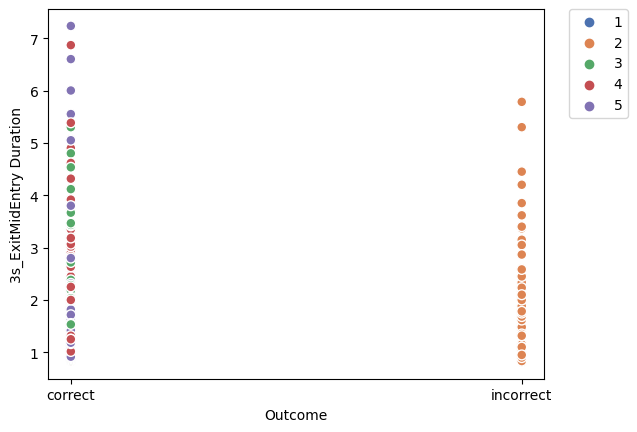

In [20]:
sns.scatterplot(data=exitmidentry_duration_3s, x = 'Outcome', y = '3s_ExitMidEntry Duration', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [21]:
mean_exitmidentry_duration_3s = get_mean_performances(exitmidentry_duration_3s)

In [22]:
mean_exitmidentry_duration_3s

,mouse,3s_ExitMidEntry Duration,%,Outcome
0,sa78m3,2.997436,83.870968,correct
1,sa78m3,4.016667,83.870968,incorrect
2,sa196m3e,1.923958,78.048780,correct
3,sa196m3e,1.950000,78.048780,incorrect
4,sa78m1,2.385417,88.888889,correct
5,sa78m1,2.975000,88.888889,incorrect
6,sa198m2e,1.634568,87.096774,correct
7,sa198m2e,1.583333,87.096774,incorrect
8,sa199m3e,1.549359,61.904762,correct
9,sa199m3e,1.958333,61.904762,incorrect


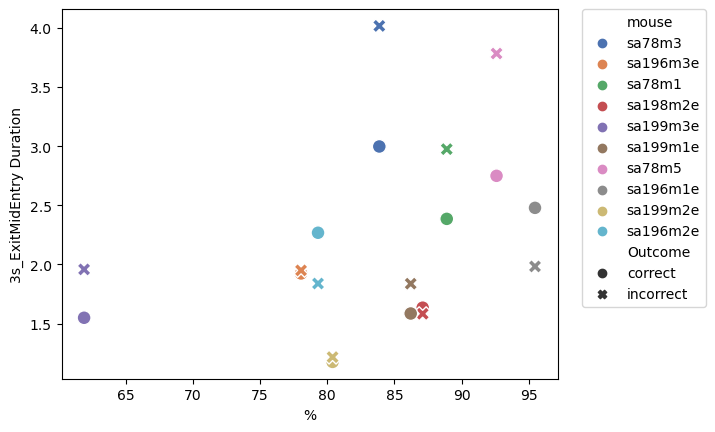

In [23]:
sns.scatterplot(data=mean_exitmidentry_duration_3s, x = '%', y = '3s_ExitMidEntry Duration', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [24]:
middle_tortuosity_3s = get_performance(df_grouped_unscaled_ri, 'Middle Tortuosity', 3)

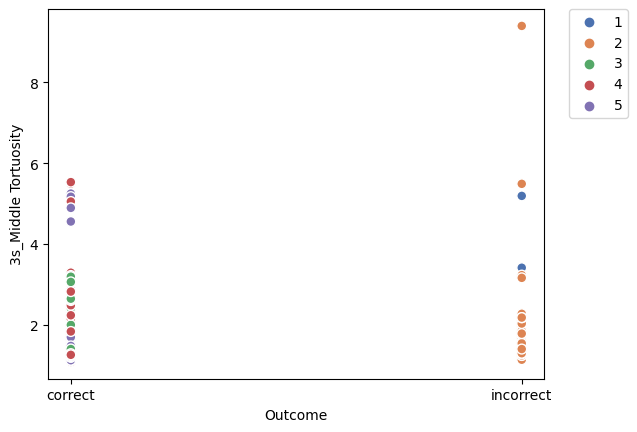

In [25]:
sns.scatterplot(data=middle_tortuosity_3s, x = 'Outcome', y = '3s_Middle Tortuosity', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [26]:
mean_middle_tortuosity_3s = get_mean_performances(middle_tortuosity_3s)

In [27]:
mean_middle_tortuosity_3s

,mouse,3s_Middle Tortuosity,%,Outcome
0,sa78m3,2.253972,83.870968,correct
1,sa78m3,2.164621,83.870968,incorrect
2,sa196m3e,1.595560,78.048780,correct
3,sa196m3e,2.751496,78.048780,incorrect
4,sa78m1,1.518452,88.888889,correct
5,sa78m1,1.519137,88.888889,incorrect
6,sa198m2e,1.370251,87.096774,correct
7,sa198m2e,1.312905,87.096774,incorrect
8,sa199m3e,1.620796,61.904762,correct
9,sa199m3e,1.597897,61.904762,incorrect


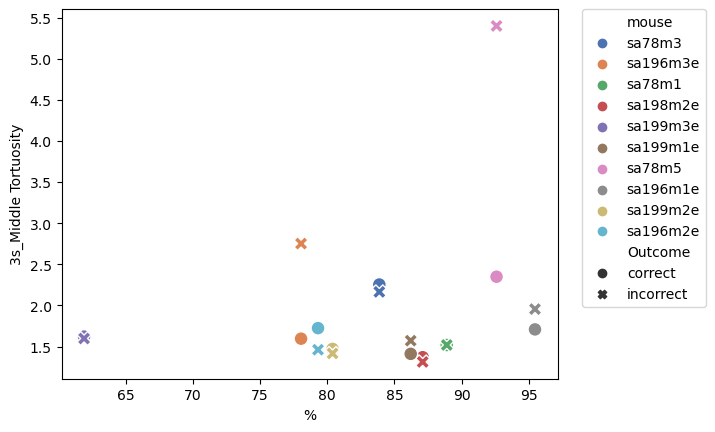

In [28]:
sns.scatterplot(data=mean_middle_tortuosity_3s, x = '%', y = '3s_Middle Tortuosity', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [29]:
new_cur_coeff_time_prop_3s = get_performance(df_grouped_unscaled_ri, 'New Current Coeff Time Proportional', 3)

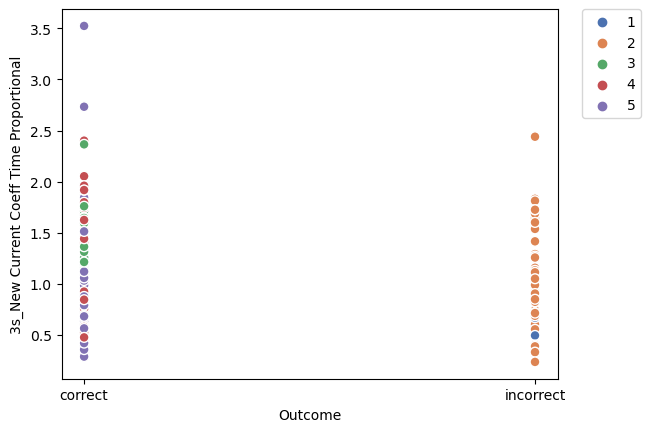

In [30]:
sns.scatterplot(data=new_cur_coeff_time_prop_3s, x = 'Outcome', y = '3s_New Current Coeff Time Proportional', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [31]:
mean_new_cur_coeff_time_prop_3s = get_mean_performances(new_cur_coeff_time_prop_3s)

In [32]:
mean_new_cur_coeff_time_prop_3s

,mouse,3s_New Current Coeff Time Proportional,%,Outcome
0,sa78m3,1.230068,83.870968,correct
1,sa78m3,1.860379,83.870968,incorrect
2,sa196m3e,0.867837,78.048780,correct
3,sa196m3e,0.806214,78.048780,incorrect
4,sa78m1,1.049863,88.888889,correct
5,sa78m1,1.399230,88.888889,incorrect
6,sa198m2e,0.900769,87.096774,correct
7,sa198m2e,0.972502,87.096774,incorrect
8,sa199m3e,0.710908,61.904762,correct
9,sa199m3e,0.962876,61.904762,incorrect


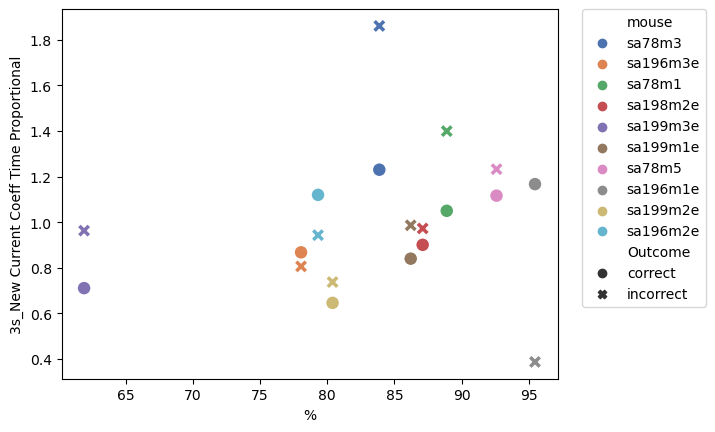

In [33]:
sns.scatterplot(data=mean_new_cur_coeff_time_prop_3s, x = '%', y = '3s_New Current Coeff Time Proportional', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [34]:
new_current_coeff_3s = get_performance(df_grouped_unscaled_ri, 'New Current Coeff', 3)

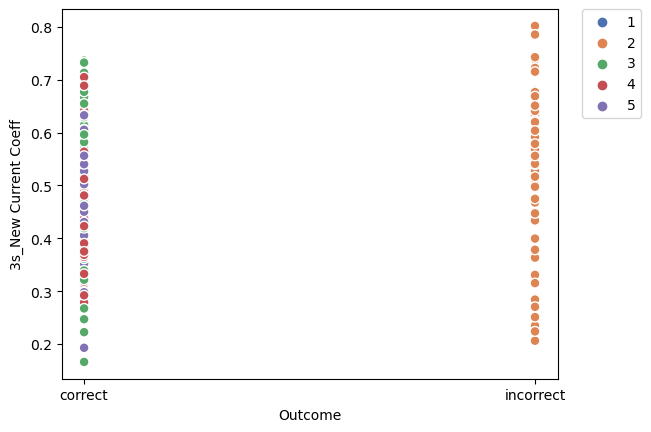

In [35]:
sns.scatterplot(data=new_current_coeff_3s, x = 'Outcome', y = '3s_New Current Coeff', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [36]:
mean_new_current_coeff_3s = get_mean_performances(new_current_coeff_3s)

In [37]:
mean_new_current_coeff_3s

,mouse,3s_New Current Coeff,%,Outcome
0,sa78m3,0.471594,83.870968,correct
1,sa78m3,0.513091,83.870968,incorrect
2,sa196m3e,0.464671,78.048780,correct
3,sa196m3e,0.420244,78.048780,incorrect
4,sa78m1,0.455064,88.888889,correct
5,sa78m1,0.583731,88.888889,incorrect
6,sa198m2e,0.544467,87.096774,correct
7,sa198m2e,0.583898,87.096774,incorrect
8,sa199m3e,0.443821,61.904762,correct
9,sa199m3e,0.510057,61.904762,incorrect


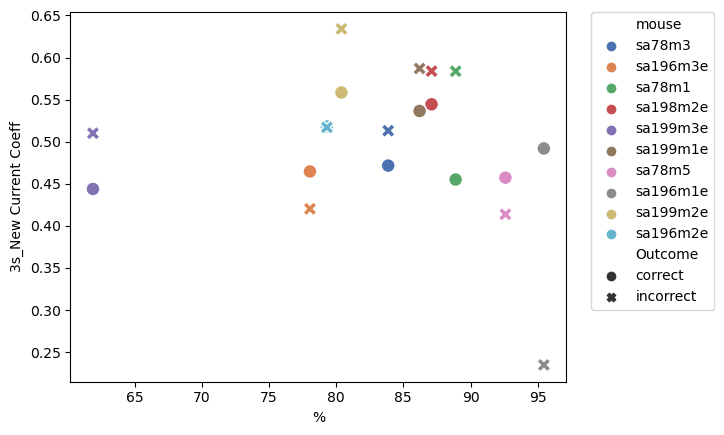

In [38]:
sns.scatterplot(data=mean_new_current_coeff_3s, x = '%', y = '3s_New Current Coeff', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [39]:
current_coeff_3s = get_performance(df_grouped_unscaled_ri, 'Current Coeff', 3)

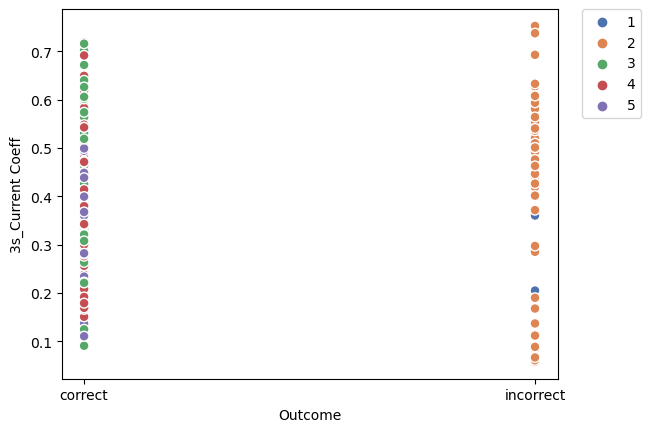

In [40]:
sns.scatterplot(data=current_coeff_3s, x = 'Outcome', y = '3s_Current Coeff', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [41]:
mean_current_coeff_3s = get_mean_performances(current_coeff_3s)

In [42]:
mean_current_coeff_3s

,mouse,3s_Current Coeff,%,Outcome
0,sa78m3,0.343096,83.870968,correct
1,sa78m3,0.454981,83.870968,incorrect
2,sa196m3e,0.364910,78.048780,correct
3,sa196m3e,0.307357,78.048780,incorrect
4,sa78m1,0.348946,88.888889,correct
5,sa78m1,0.527243,88.888889,incorrect
6,sa198m2e,0.419532,87.096774,correct
7,sa198m2e,0.470497,87.096774,incorrect
8,sa199m3e,0.307604,61.904762,correct
9,sa199m3e,0.432599,61.904762,incorrect


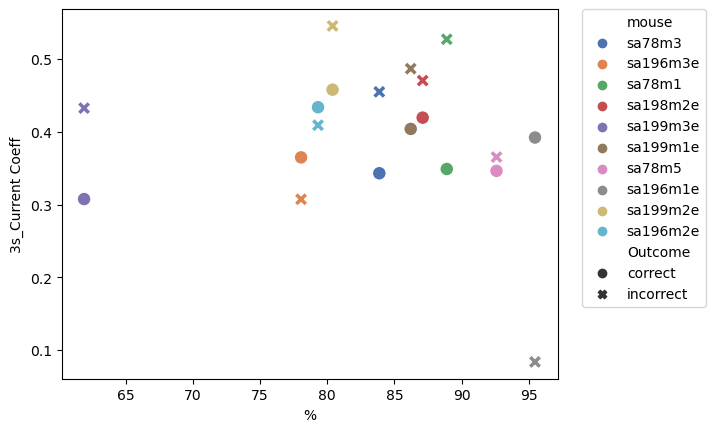

In [43]:
sns.scatterplot(data=mean_current_coeff_3s, x = '%', y = '3s_Current Coeff', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [44]:
cur_coeff_time_prop_3s = get_performance(df_grouped_unscaled_ri, 'Current Coeff Time Proportional', 3)

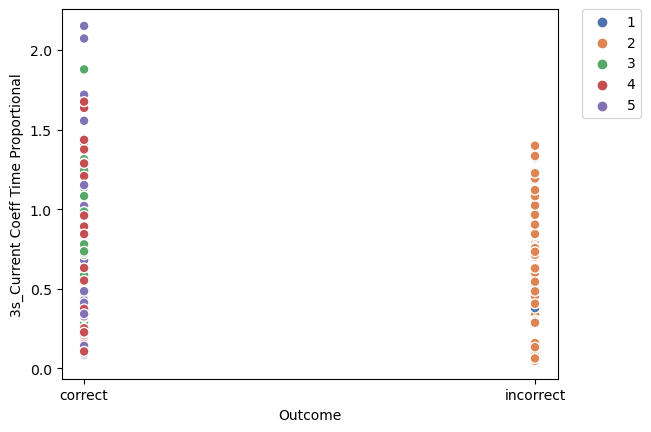

In [45]:
sns.scatterplot(data=cur_coeff_time_prop_3s, x = 'Outcome', y = '3s_Current Coeff Time Proportional', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [46]:
mean_cur_coeff_time_prop_3s = get_mean_performances(cur_coeff_time_prop_3s)

In [47]:
mean_cur_coeff_time_prop_3s

,mouse,3s_Current Coeff Time Proportional,%,Outcome
0,sa78m3,0.752677,83.870968,correct
1,sa78m3,1.174292,83.870968,incorrect
2,sa196m3e,0.501259,78.048780,correct
3,sa196m3e,0.464023,78.048780,incorrect
4,sa78m1,0.635290,88.888889,correct
5,sa78m1,0.779137,88.888889,incorrect
6,sa198m2e,0.482170,87.096774,correct
7,sa198m2e,0.590871,87.096774,incorrect
8,sa199m3e,0.406589,61.904762,correct
9,sa199m3e,0.631400,61.904762,incorrect


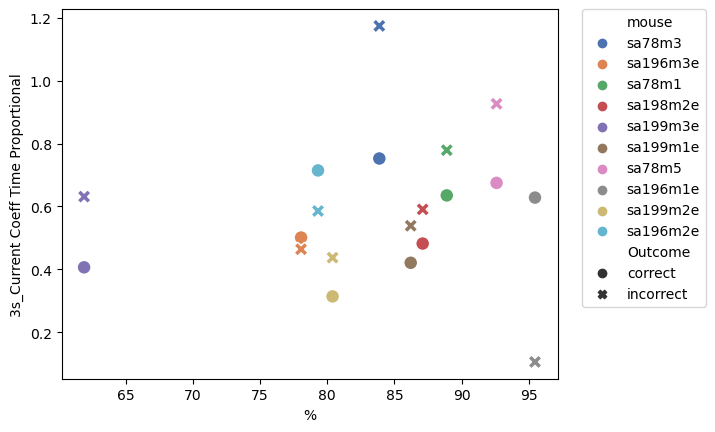

In [48]:
sns.scatterplot(data=mean_cur_coeff_time_prop_3s, x = '%', y = '3s_Current Coeff Time Proportional', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [49]:
lagged_1_duration_3s = get_performance(df_grouped_unscaled_ri, 'lagged_1_duration', 3)

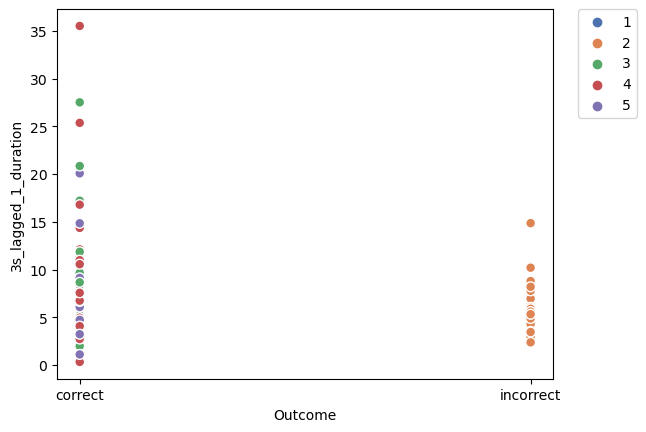

In [50]:
sns.scatterplot(data=lagged_1_duration_3s, x = 'Outcome', y = '3s_lagged_1_duration', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [51]:
mean_lagged_1_duration_3s = get_mean_performances(lagged_1_duration_3s)

In [132]:
mean_lagged_1_duration_3s
mean_lagged_1_duration_3s.to_csv('mean_arm_dur_past_2.csv', sep='\t', index=False)


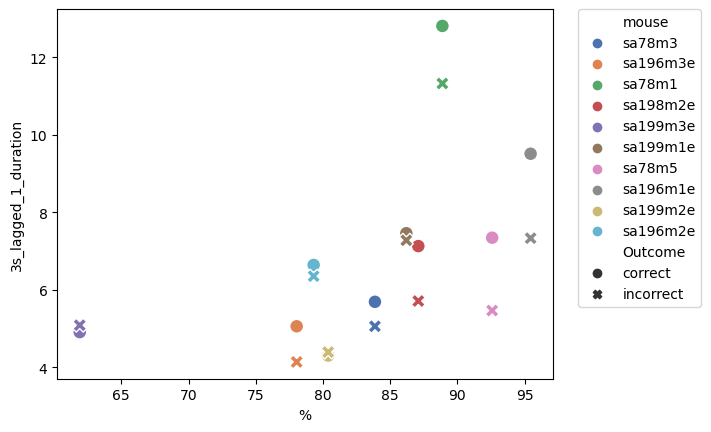

In [53]:
sns.scatterplot(data=mean_lagged_1_duration_3s, x = '%', y = '3s_lagged_1_duration', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [54]:
lagged_1_nose_time_to_max_dist_3s = get_performance(df_grouped_unscaled_ri, 'lagged_1_nose_time_to_max_dist', 3)

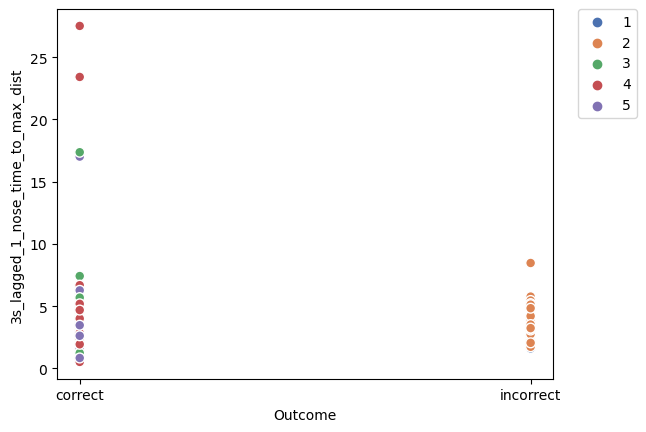

In [55]:
sns.scatterplot(data=lagged_1_nose_time_to_max_dist_3s, x = 'Outcome', y = '3s_lagged_1_nose_time_to_max_dist', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [56]:
mean_lagged_1_nose_time_to_max_dist_3s = get_mean_performances(lagged_1_nose_time_to_max_dist_3s)

In [131]:
mean_lagged_1_nose_time_to_max_dist_3s

mean_lagged_1_nose_time_to_max_dist_3s.to_csv('mean_time_to_max_past_2.csv', sep='\t', index=False)

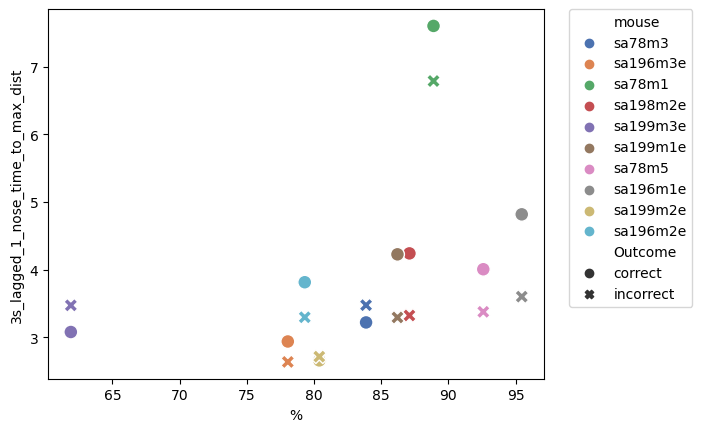

In [58]:
sns.scatterplot(data=mean_lagged_1_nose_time_to_max_dist_3s, x = '%', y = '3s_lagged_1_nose_time_to_max_dist', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [59]:
lagged_1_arm_nose_mov_3s = get_performance(df_grouped_unscaled_ri, 'lagged_1_arm_nose_mov', 3)

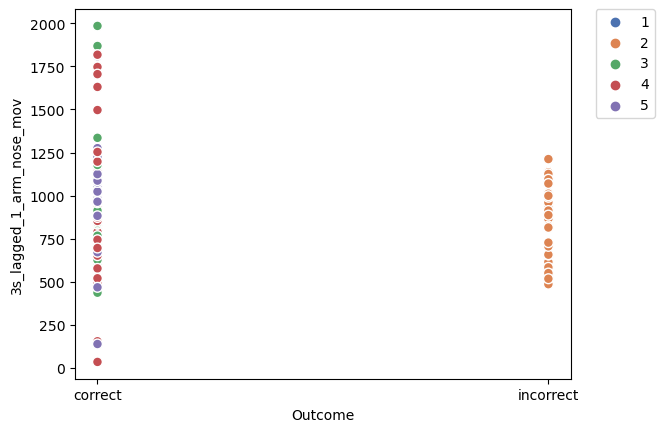

In [60]:
sns.scatterplot(data=lagged_1_arm_nose_mov_3s, x = 'Outcome', y = '3s_lagged_1_arm_nose_mov', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [61]:
mean_lagged_1_arm_nose_mov_3s = get_mean_performances(lagged_1_arm_nose_mov_3s)

In [130]:
mean_lagged_1_arm_nose_mov_3s

mean_lagged_1_arm_nose_mov_3s.to_csv('dist_in_arm_past_2_nose.csv', sep='\t', index=False)

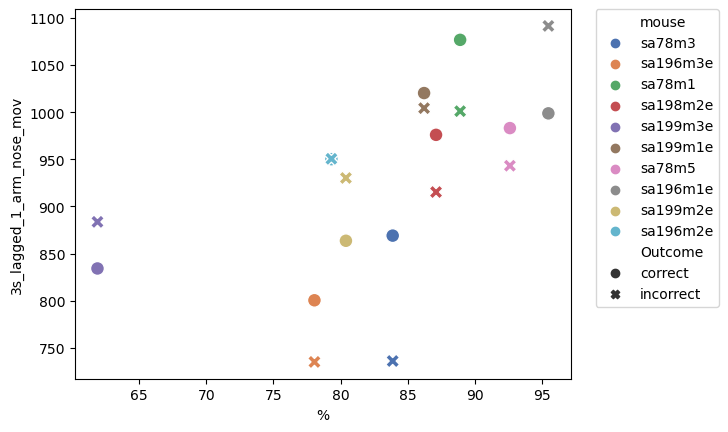

In [63]:
sns.scatterplot(data=mean_lagged_1_arm_nose_mov_3s, x = '%', y = '3s_lagged_1_arm_nose_mov', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [64]:
lagged_1_arm_nose_vel_3s = get_performance(df_grouped_unscaled_ri, 'lagged_1_arm_nose_vel', 3)

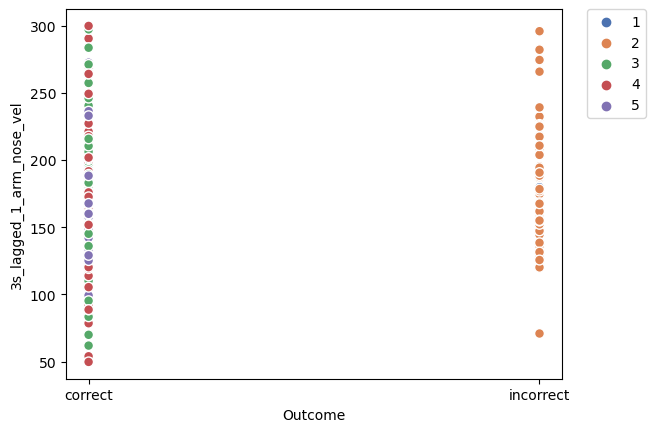

In [65]:
sns.scatterplot(data=lagged_1_arm_nose_vel_3s, x = 'Outcome', y = '3s_lagged_1_arm_nose_vel', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [66]:
mean_lagged_1_arm_nose_vel_3s = get_mean_performances(lagged_1_arm_nose_vel_3s)

In [129]:
mean_lagged_1_arm_nose_vel_3s
mean_lagged_1_arm_nose_vel_3s.to_csv('mean_vel_past_2_nose.csv', sep='\t', index=False)

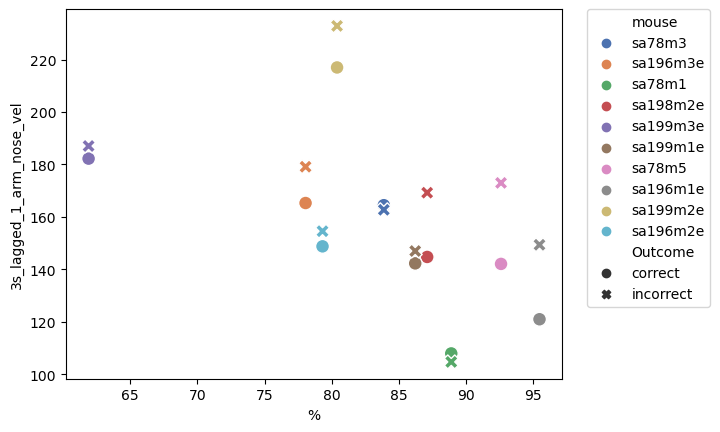

In [68]:
sns.scatterplot(data=mean_lagged_1_arm_nose_vel_3s, x = '%', y = '3s_lagged_1_arm_nose_vel', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [69]:
lagged_1_arm_tail_mov_3s = get_performance(df_grouped_unscaled_ri, 'lagged_1_arm_tail_mov', 3)

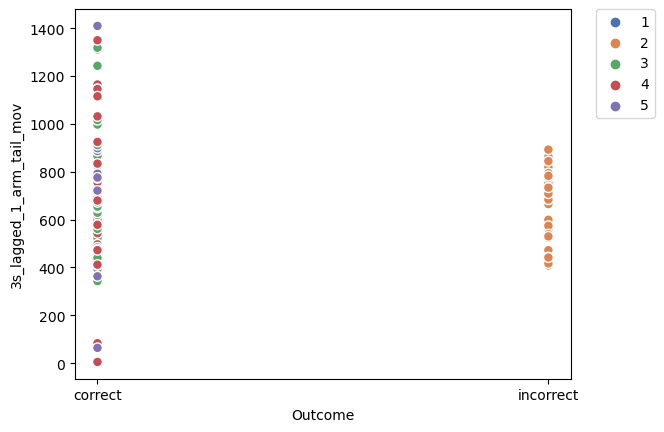

In [70]:
sns.scatterplot(data=lagged_1_arm_tail_mov_3s, x = 'Outcome', y = '3s_lagged_1_arm_tail_mov', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [71]:
mean_lagged_1_arm_tail_mov_3s = get_mean_performances(lagged_1_arm_tail_mov_3s)

In [128]:
mean_lagged_1_arm_tail_mov_3s
mean_lagged_1_arm_tail_mov_3s.to_csv('dist_in_arm_past_2_tail.csv', sep='\t', index=False)

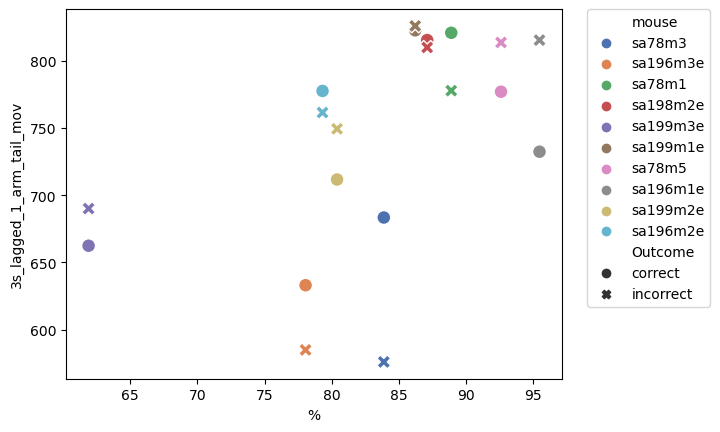

In [73]:
sns.scatterplot(data=mean_lagged_1_arm_tail_mov_3s, x = '%', y = '3s_lagged_1_arm_tail_mov', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [74]:
lagged_1_arm_tail_vel_3s = get_performance(df_grouped_unscaled_ri, 'lagged_1_arm_tail_vel', 3)

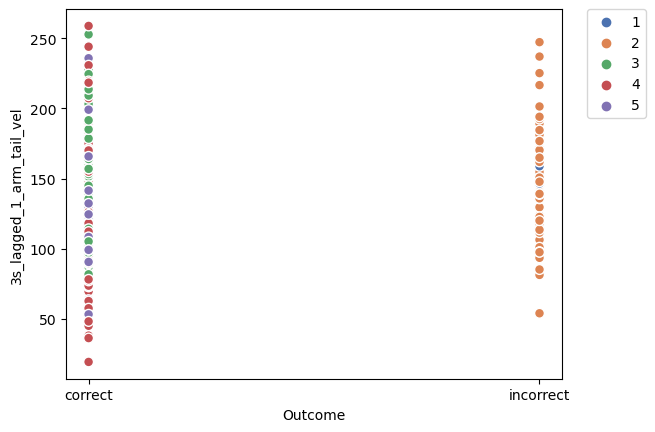

In [75]:
sns.scatterplot(data=lagged_1_arm_tail_vel_3s, x = 'Outcome', y = '3s_lagged_1_arm_tail_vel', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [76]:
mean_lagged_1_arm_tail_vel_3s = get_mean_performances(lagged_1_arm_tail_vel_3s)

In [127]:
mean_lagged_1_arm_tail_vel_3s
mean_lagged_1_arm_tail_vel_3s.to_csv('mean_vel_past_2_tail.csv', sep='\t', index=False)

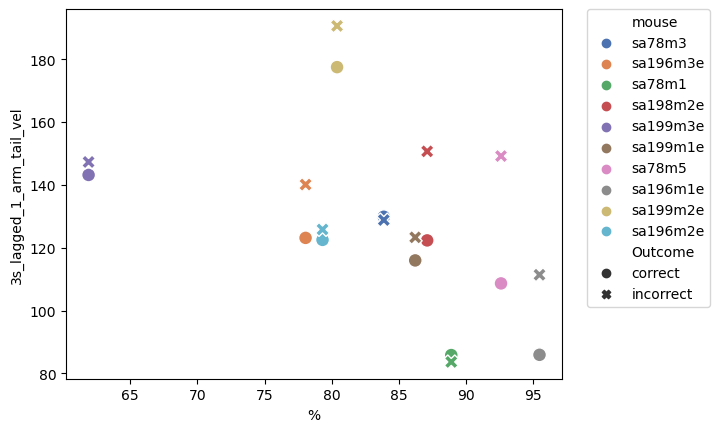

In [78]:
sns.scatterplot(data=mean_lagged_1_arm_tail_vel_3s, x = '%', y = '3s_lagged_1_arm_tail_vel', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [79]:
lagged_1_entry_tortuosity_3s = get_performance(df_grouped_unscaled_ri, 'lagged_1_entry_tortuosity', 3)

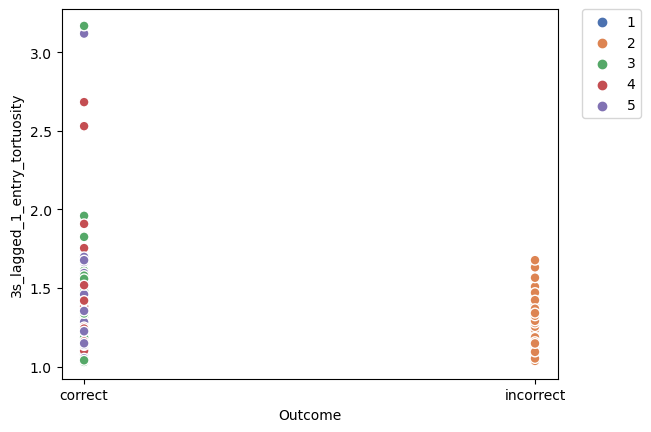

In [80]:
sns.scatterplot(data=lagged_1_entry_tortuosity_3s, x = 'Outcome', y = '3s_lagged_1_entry_tortuosity', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [81]:
mean_lagged_1_entry_tortuosity_3s = get_mean_performances(lagged_1_entry_tortuosity_3s)

In [82]:
mean_lagged_1_entry_tortuosity_3s

,mouse,3s_lagged_1_entry_tortuosity,%,Outcome
0,sa78m3,1.273093,83.870968,correct
1,sa78m3,1.246647,83.870968,incorrect
2,sa196m3e,1.277465,78.048780,correct
3,sa196m3e,1.260318,78.048780,incorrect
4,sa78m1,1.518748,88.888889,correct
5,sa78m1,1.407164,88.888889,incorrect
6,sa198m2e,1.292330,87.096774,correct
7,sa198m2e,1.240139,87.096774,incorrect
8,sa199m3e,1.243170,61.904762,correct
9,sa199m3e,1.324888,61.904762,incorrect


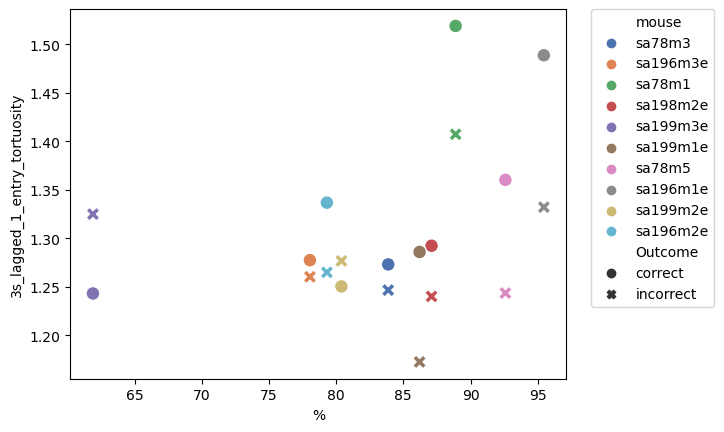

In [83]:
sns.scatterplot(data=mean_lagged_1_entry_tortuosity_3s, x = '%', y = '3s_lagged_1_entry_tortuosity', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [84]:
lagged_1_exit_tortuosity_3s = get_performance(df_grouped_unscaled_ri, 'lagged_1_exit_tortuosity', 3)

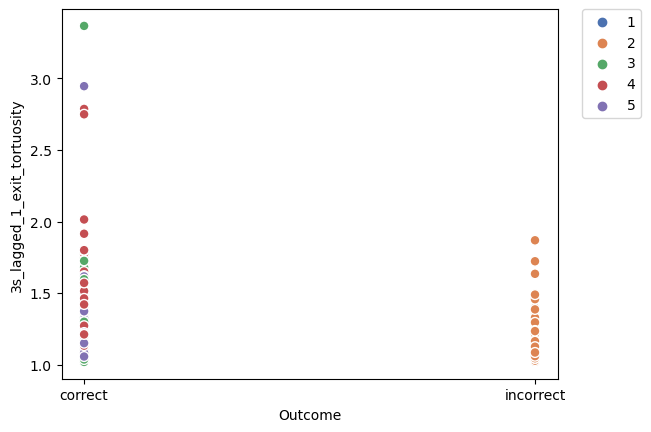

In [85]:
sns.scatterplot(data=lagged_1_exit_tortuosity_3s, x = 'Outcome', y = '3s_lagged_1_exit_tortuosity', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [86]:
mean_lagged_1_exit_tortuosity_3s = get_mean_performances(lagged_1_exit_tortuosity_3s)

In [126]:
mean_lagged_1_exit_tortuosity_3s

mean_lagged_1_exit_tortuosity_3s.to_csv('mean_exit_tortuosity_past_2.csv', sep='\t', index=False)

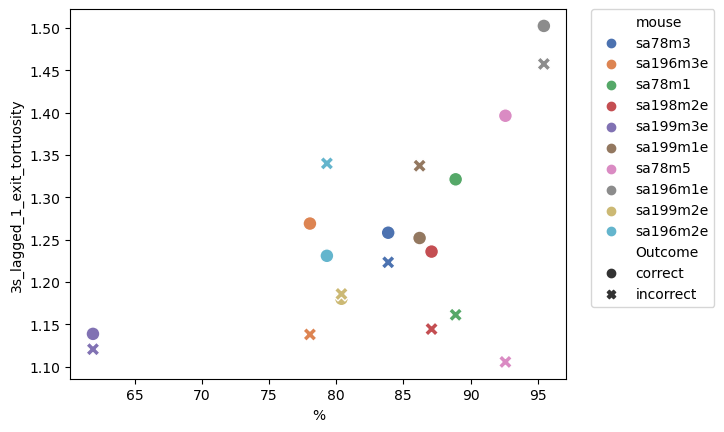

In [88]:
sns.scatterplot(data=mean_lagged_1_exit_tortuosity_3s, x = '%', y = '3s_lagged_1_exit_tortuosity', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [89]:
lagged_1_other_tortuosity_3s = get_performance(df_grouped_unscaled_ri, 'lagged_1_other_tortuosity', 3)

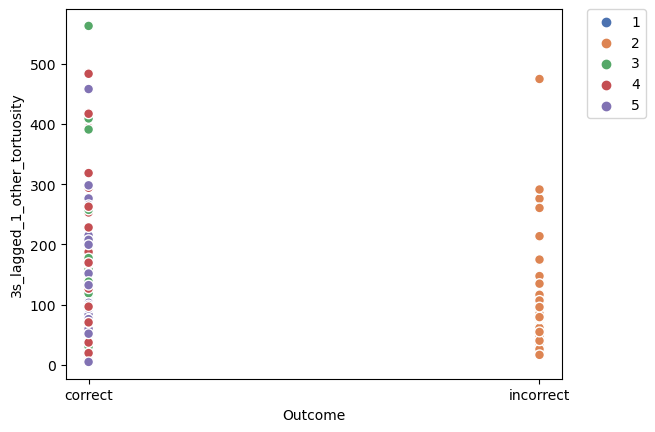

In [90]:
sns.scatterplot(data=lagged_1_other_tortuosity_3s, x = 'Outcome', y = '3s_lagged_1_other_tortuosity', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [91]:
mean_lagged_1_other_tortuosity_3s = get_mean_performances(lagged_1_other_tortuosity_3s)

In [92]:
mean_lagged_1_other_tortuosity_3s


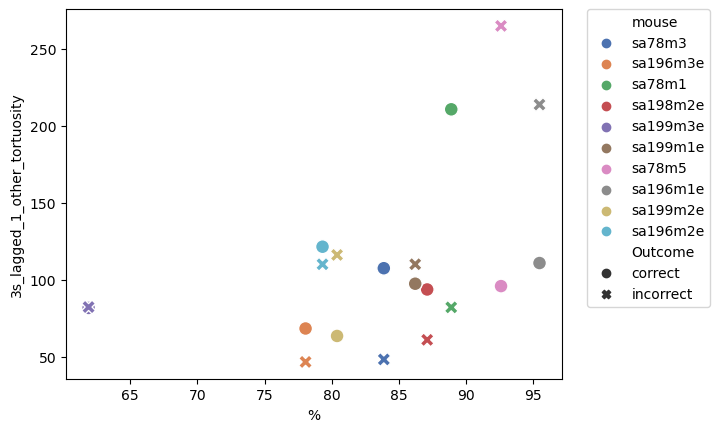

In [93]:
sns.scatterplot(data=mean_lagged_1_other_tortuosity_3s, x = '%', y = '3s_lagged_1_other_tortuosity', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [94]:
entry_latency_3s = get_performance(df_grouped_unscaled_ri, 'Entry Latency', 3)

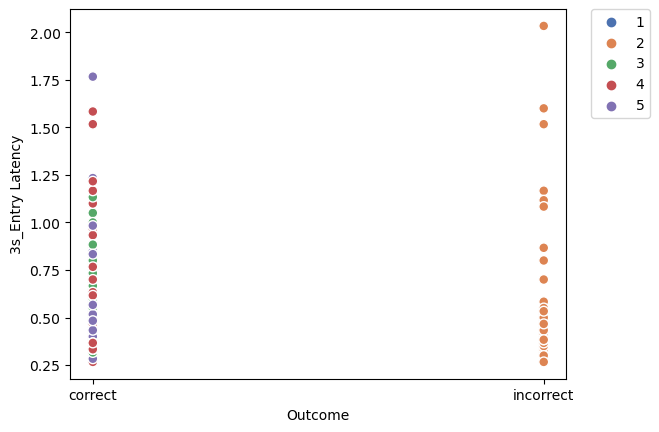

In [95]:
sns.scatterplot(data=entry_latency_3s, x = 'Outcome', y = '3s_Entry Latency', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [96]:
mean_entry_latency_3s = get_mean_performances(entry_latency_3s)

In [97]:
mean_entry_latency_3s

,mouse,3s_Entry Latency,%,Outcome
0,sa78m3,0.647436,83.870968,correct
1,sa78m3,1.120000,83.870968,incorrect
2,sa196m3e,0.588021,78.048780,correct
3,sa196m3e,0.546296,78.048780,incorrect
4,sa78m1,0.615625,88.888889,correct
5,sa78m1,0.808333,88.888889,incorrect
6,sa198m2e,0.574691,87.096774,correct
7,sa198m2e,0.495833,87.096774,incorrect
8,sa199m3e,0.420513,61.904762,correct
9,sa199m3e,0.460417,61.904762,incorrect


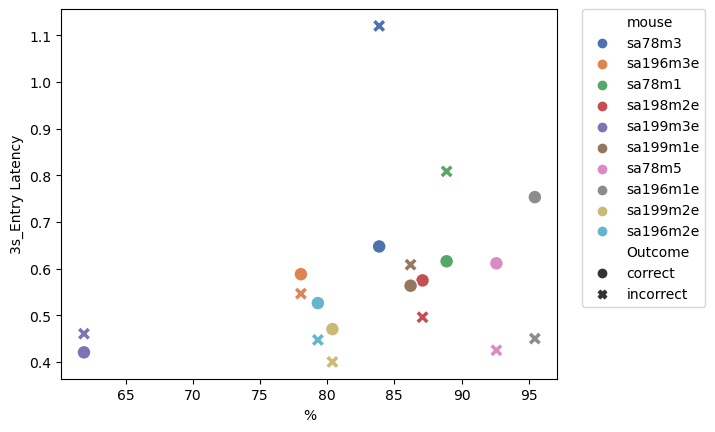

In [98]:
sns.scatterplot(data=mean_entry_latency_3s, x = '%', y = '3s_Entry Latency', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [99]:
lagged_1_new_cur_coeff_3s = get_performance(df_grouped_unscaled_ri, 'New Lagged 1 Cur Coeff', 3)

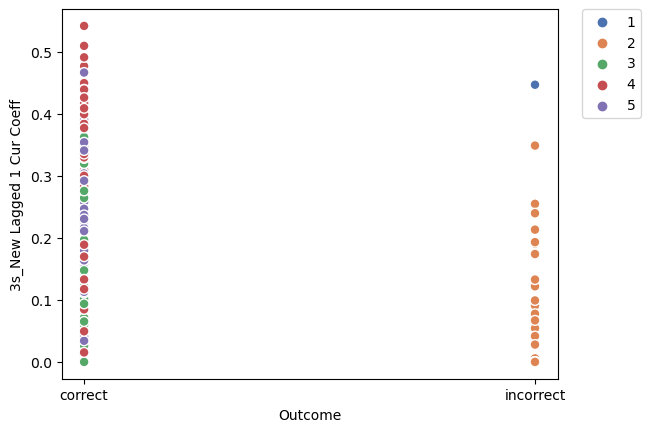

In [100]:
sns.scatterplot(data=lagged_1_new_cur_coeff_3s, x = 'Outcome', y = '3s_New Lagged 1 Cur Coeff', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [101]:
mean_lagged_1_new_cur_coeff_3s = get_mean_performances(lagged_1_new_cur_coeff_3s)

In [102]:
mean_lagged_1_new_cur_coeff_3s

,mouse,3s_New Lagged 1 Cur Coeff,%,Outcome
0,sa78m3,0.194216,83.870968,correct
1,sa78m3,0.013386,83.870968,incorrect
2,sa196m3e,0.135800,78.048780,correct
3,sa196m3e,0.165559,78.048780,incorrect
4,sa78m1,0.177658,88.888889,correct
5,sa78m1,0.080392,88.888889,incorrect
6,sa198m2e,0.149713,87.096774,correct
7,sa198m2e,0.000000,87.096774,incorrect
8,sa199m3e,0.193528,61.904762,correct
9,sa199m3e,0.029709,61.904762,incorrect


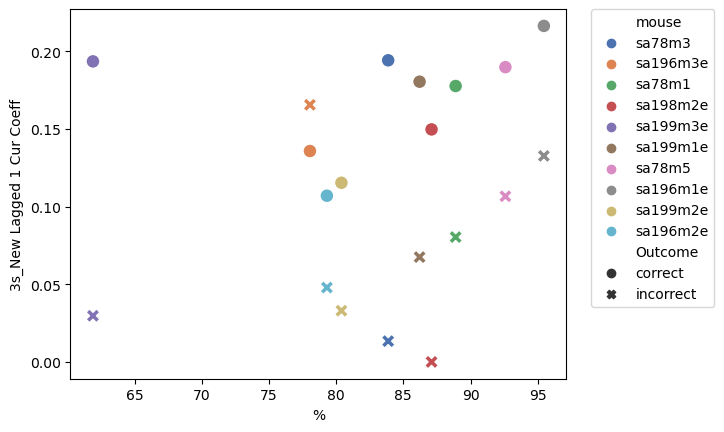

In [103]:
sns.scatterplot(data=mean_lagged_1_new_cur_coeff_3s, x = '%', y = '3s_New Lagged 1 Cur Coeff', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [111]:
middle_duration_3s = get_performance(df_grouped_unscaled_ri, 'Middle Duration', 3)

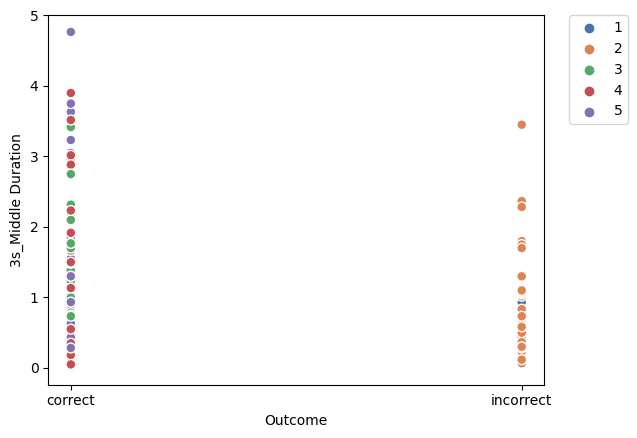

In [112]:
sns.scatterplot(data=middle_duration_3s, x = 'Outcome', y = '3s_Middle Duration', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [113]:
mean_middle_duration_3s = get_mean_performances(middle_duration_3s)

In [114]:
mean_middle_duration_3s

,mouse,3s_Middle Duration,%,Outcome
0,sa78m3,1.269231,83.870968,correct
1,sa78m3,1.330000,83.870968,incorrect
2,sa196m3e,0.845833,78.048780,correct
3,sa196m3e,0.761111,78.048780,incorrect
4,sa78m1,0.713542,88.888889,correct
5,sa78m1,0.991667,88.888889,incorrect
6,sa198m2e,0.522222,87.096774,correct
7,sa198m2e,0.591667,87.096774,incorrect
8,sa199m3e,0.563462,61.904762,correct
9,sa199m3e,0.942708,61.904762,incorrect


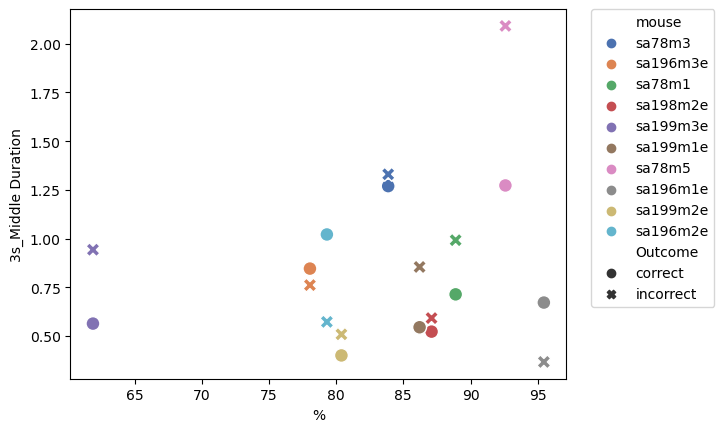

In [115]:
sns.scatterplot(data=mean_middle_duration_3s, x = '%', y = '3s_Middle Duration', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [116]:
lagged_1_duration_4s = get_performance(df_grouped_unscaled_ri, 'lagged_1_duration', 4)

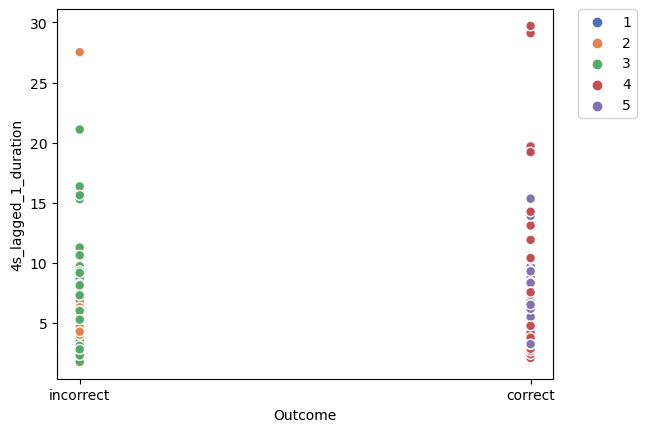

In [117]:
sns.scatterplot(data=lagged_1_duration_4s, x = 'Outcome', y = '4s_lagged_1_duration', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [118]:
mean_lagged_1_duration_4s = get_mean_performances(lagged_1_duration_4s)

In [119]:
mean_lagged_1_duration_4s

,mouse,4s_lagged_1_duration,%,Outcome
0,sa78m3,5.770175,61.290323,correct
1,sa78m3,5.006481,61.290323,incorrect
2,sa196m3e,5.230159,34.146341,correct
3,sa196m3e,4.674074,34.146341,incorrect
4,sa78m1,12.973333,55.555556,correct
5,sa78m1,11.893056,55.555556,incorrect
6,sa198m2e,6.847531,58.064516,correct
7,sa198m2e,6.960684,58.064516,incorrect
8,sa199m3e,4.983333,33.333333,correct
9,sa199m3e,4.962302,33.333333,incorrect


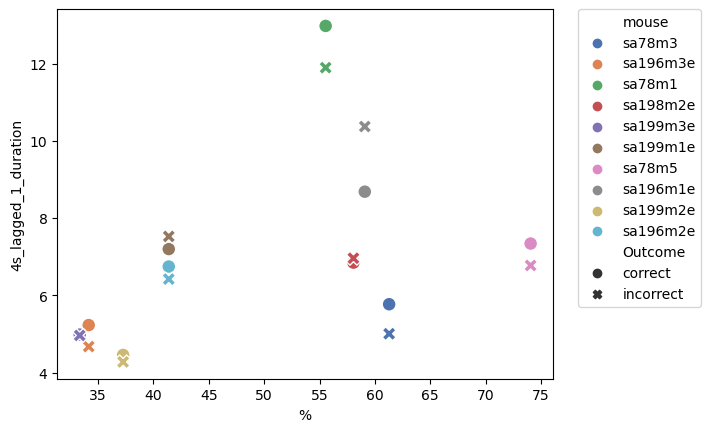

In [120]:
sns.scatterplot(data=mean_lagged_1_duration_4s, x = '%', y = '4s_lagged_1_duration', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [121]:
lagged_1_duration_5s = get_performance(df_grouped_unscaled_ri, 'lagged_1_duration', 5)

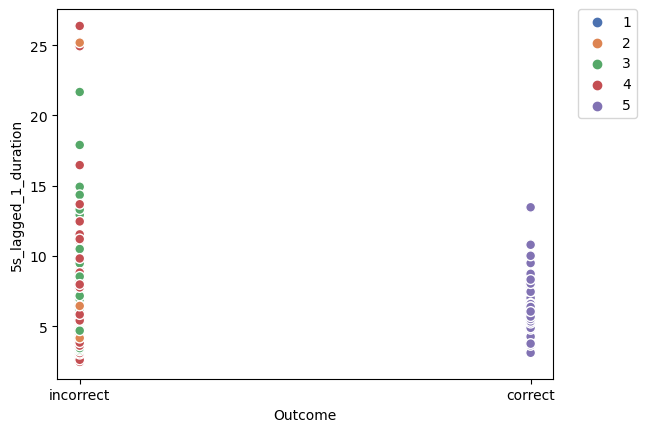

In [122]:
sns.scatterplot(data=lagged_1_duration_5s, x = 'Outcome', y = '5s_lagged_1_duration', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [123]:
mean_lagged_1_duration_5s = get_mean_performances(lagged_1_duration_5s)

In [124]:
mean_lagged_1_duration_5s

,mouse,5s_lagged_1_duration,%,Outcome
0,sa78m3,6.028030,35.483871,correct
1,sa78m3,5.097917,35.483871,incorrect
2,sa196m3e,6.358333,7.317073,correct
3,sa196m3e,4.771930,7.317073,incorrect
4,sa78m1,8.208333,16.666667,correct
5,sa78m1,13.311111,16.666667,incorrect
6,sa198m2e,6.846875,25.806452,correct
7,sa198m2e,6.890217,25.806452,incorrect
8,sa199m3e,5.022222,14.285714,correct
9,sa199m3e,4.973148,14.285714,incorrect


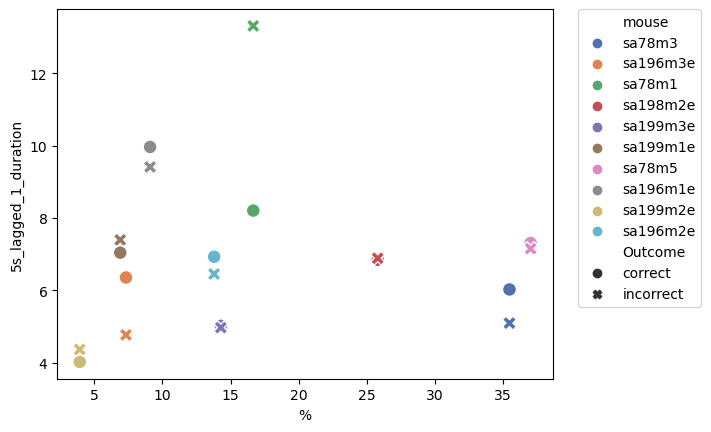

In [125]:
sns.scatterplot(data=mean_lagged_1_duration_5s, x = '%', y = '5s_lagged_1_duration', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [ ]:
# 4s

In [133]:
exitmidentry_duration_4s = get_performance(df_grouped_unscaled_ri, 'ExitMidEntry Duration', 4)

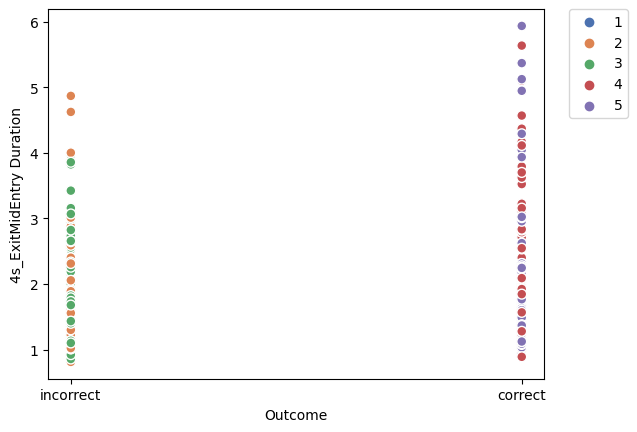

In [134]:
sns.scatterplot(data=exitmidentry_duration_4s, x = 'Outcome', y = '4s_ExitMidEntry Duration', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [135]:
mean_exitmidentry_duration_4s = get_mean_performances(exitmidentry_duration_4s)

In [136]:
mean_exitmidentry_duration_4s

,mouse,4s_ExitMidEntry Duration,%,Outcome
0,sa78m3,2.988889,61.290323,correct
1,sa78m3,3.286111,61.290323,incorrect
2,sa196m3e,1.967460,34.146341,correct
3,sa196m3e,1.917284,34.146341,incorrect
4,sa78m1,2.474444,55.555556,correct
5,sa78m1,2.377778,55.555556,incorrect
6,sa198m2e,1.659259,58.064516,correct
7,sa198m2e,1.611966,58.064516,incorrect
8,sa199m3e,1.595238,33.333333,correct
9,sa199m3e,1.773016,33.333333,incorrect


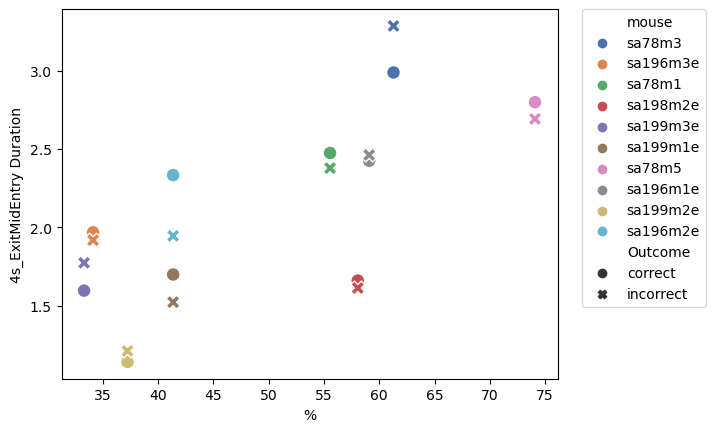

In [137]:
sns.scatterplot(data=mean_exitmidentry_duration_4s, x = '%', y = '4s_ExitMidEntry Duration', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [138]:
middle_tortuosity_4s = get_performance(df_grouped_unscaled_ri, 'Middle Tortuosity', 4)

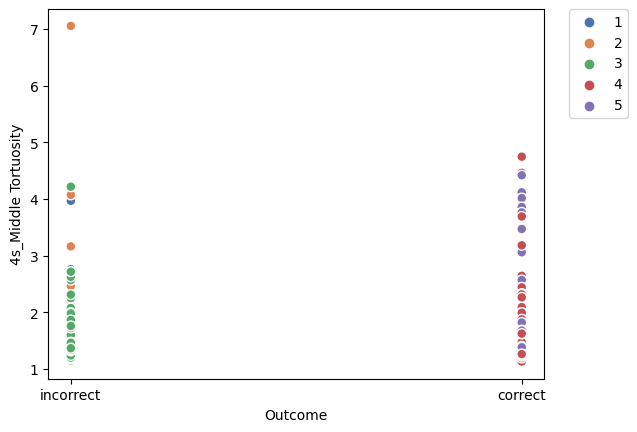

In [139]:
sns.scatterplot(data=middle_tortuosity_4s, x = 'Outcome', y = '4s_Middle Tortuosity', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [140]:
mean_middle_tortuosity_4s = get_mean_performances(middle_tortuosity_4s)

In [141]:
mean_middle_tortuosity_4s

,mouse,4s_Middle Tortuosity,%,Outcome
0,sa78m3,2.293634,61.290323,correct
1,sa78m3,2.083257,61.290323,incorrect
2,sa196m3e,1.592236,34.146341,correct
3,sa196m3e,2.003018,34.146341,incorrect
4,sa78m1,1.505096,55.555556,correct
5,sa78m1,1.526170,55.555556,incorrect
6,sa198m2e,1.400442,58.064516,correct
7,sa198m2e,1.329897,58.064516,incorrect
8,sa199m3e,1.696674,33.333333,correct
9,sa199m3e,1.572245,33.333333,incorrect


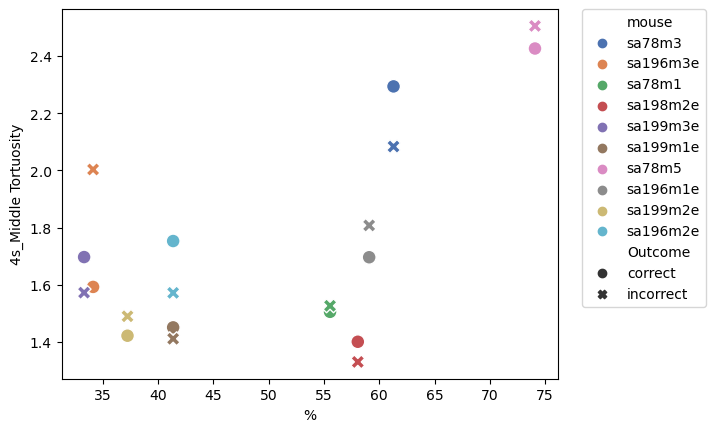

In [142]:
sns.scatterplot(data=mean_middle_tortuosity_4s, x = '%', y = '4s_Middle Tortuosity', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [143]:
new_cur_coeff_time_prop_4s = get_performance(df_grouped_unscaled_ri, 'New Current Coeff Time Proportional', 4)

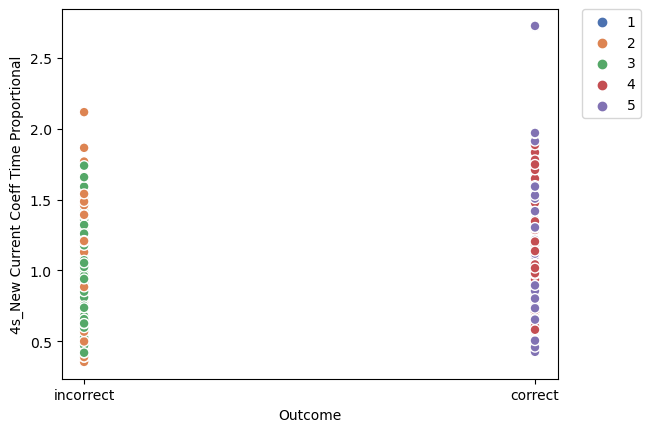

In [144]:
sns.scatterplot(data=new_cur_coeff_time_prop_4s, x = 'Outcome', y = '4s_New Current Coeff Time Proportional', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [145]:
mean_new_cur_coeff_time_prop_4s = get_mean_performances(new_cur_coeff_time_prop_4s)

In [146]:
mean_new_cur_coeff_time_prop_4s

,mouse,4s_New Current Coeff Time Proportional,%,Outcome
0,sa78m3,1.221315,61.290323,correct
1,sa78m3,1.453945,61.290323,incorrect
2,sa196m3e,0.867030,34.146341,correct
3,sa196m3e,0.839222,34.146341,incorrect
4,sa78m1,1.076910,55.555556,correct
5,sa78m1,1.058593,55.555556,incorrect
6,sa198m2e,0.888132,58.064516,correct
7,sa198m2e,0.950170,58.064516,incorrect
8,sa199m3e,0.704338,33.333333,correct
9,sa199m3e,0.866841,33.333333,incorrect


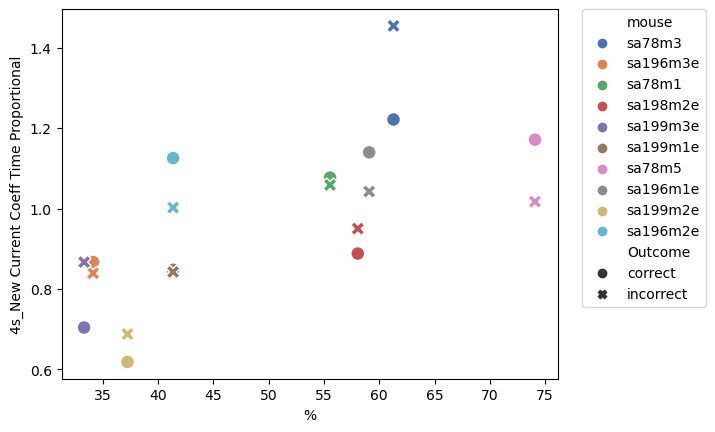

In [147]:
sns.scatterplot(data=mean_new_cur_coeff_time_prop_4s, x = '%', y = '4s_New Current Coeff Time Proportional', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [148]:
new_current_coeff_4s = get_performance(df_grouped_unscaled_ri, 'New Current Coeff', 4)

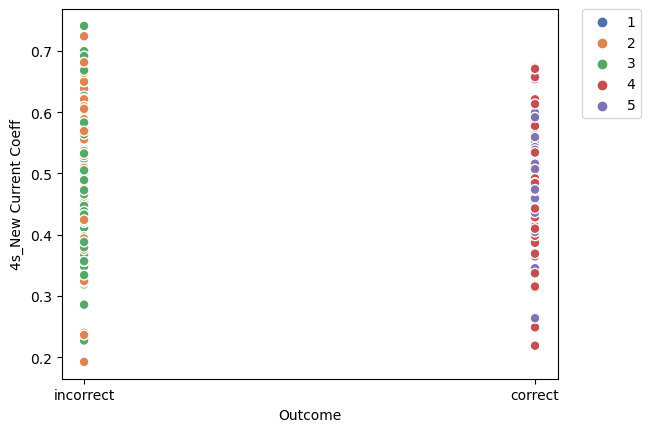

In [149]:
sns.scatterplot(data=new_current_coeff_4s, x = 'Outcome', y = '4s_New Current Coeff', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [150]:
mean_new_current_coeff_4s = get_mean_performances(new_current_coeff_4s)

In [151]:
mean_new_current_coeff_4s

,mouse,4s_New Current Coeff,%,Outcome
0,sa78m3,0.472899,61.290323,correct
1,sa78m3,0.487016,61.290323,incorrect
2,sa196m3e,0.461489,34.146341,correct
3,sa196m3e,0.447127,34.146341,incorrect
4,sa78m1,0.456036,55.555556,correct
5,sa78m1,0.478310,55.555556,incorrect
6,sa198m2e,0.531075,58.064516,correct
7,sa198m2e,0.574255,58.064516,incorrect
8,sa199m3e,0.427272,33.333333,correct
9,sa199m3e,0.491602,33.333333,incorrect


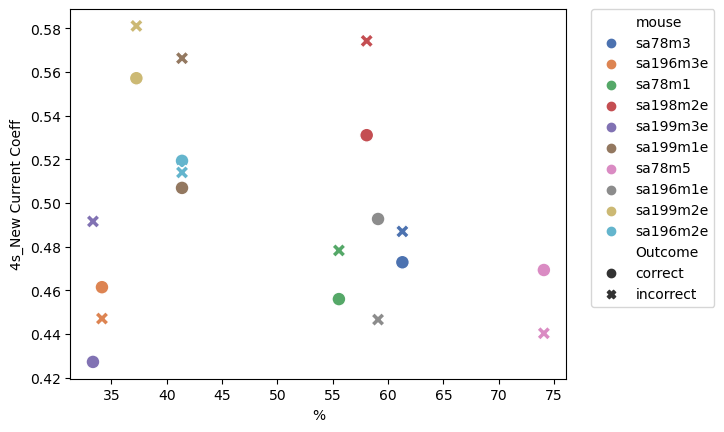

In [152]:
sns.scatterplot(data=mean_new_current_coeff_4s, x = '%', y = '4s_New Current Coeff', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [153]:
current_coeff_4s = get_performance(df_grouped_unscaled_ri, 'Current Coeff', 4)

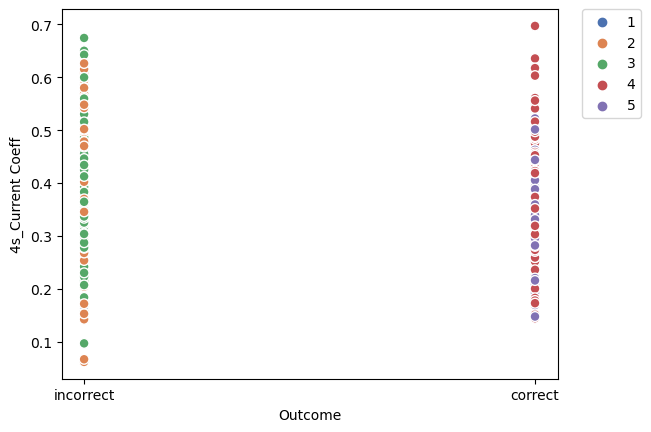

In [154]:
sns.scatterplot(data=current_coeff_4s, x = 'Outcome', y = '4s_Current Coeff', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [155]:
mean_current_coeff_4s = get_mean_performances(current_coeff_4s)

In [156]:
mean_current_coeff_4s

,mouse,4s_Current Coeff,%,Outcome
0,sa78m3,0.332848,61.290323,correct
1,sa78m3,0.396186,61.290323,incorrect
2,sa196m3e,0.369748,34.146341,correct
3,sa196m3e,0.338637,34.146341,incorrect
4,sa78m1,0.347325,55.555556,correct
5,sa78m1,0.389426,55.555556,incorrect
6,sa198m2e,0.400468,58.064516,correct
7,sa198m2e,0.457951,58.064516,incorrect
8,sa199m3e,0.279973,33.333333,correct
9,sa199m3e,0.395470,33.333333,incorrect


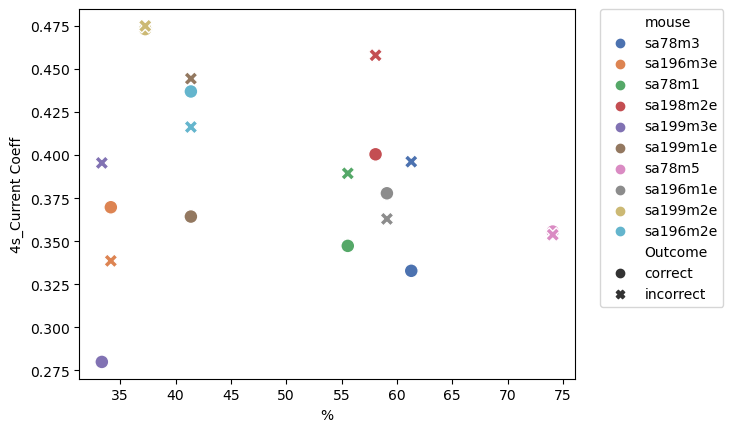

In [157]:
sns.scatterplot(data=mean_current_coeff_4s, x = '%', y = '4s_Current Coeff', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [158]:
cur_coeff_time_prop_4s = get_performance(df_grouped_unscaled_ri, 'Current Coeff Time Proportional', 4)

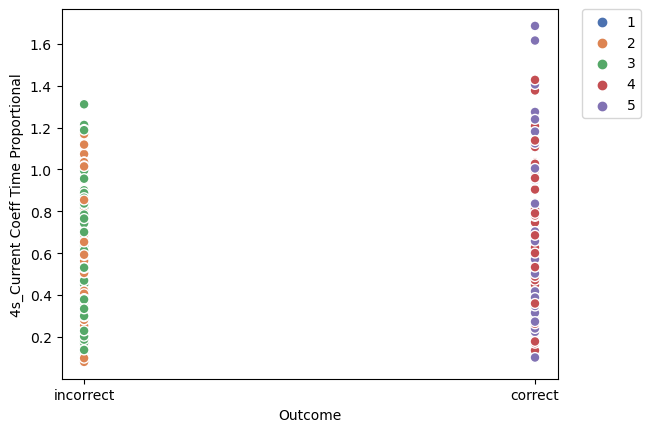

In [159]:
sns.scatterplot(data=cur_coeff_time_prop_4s, x = 'Outcome', y = '4s_Current Coeff Time Proportional', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [160]:
mean_cur_coeff_time_prop_4s = get_mean_performances(cur_coeff_time_prop_4s)

In [161]:
mean_cur_coeff_time_prop_4s

,mouse,4s_Current Coeff Time Proportional,%,Outcome
0,sa78m3,0.732460,61.290323,correct
1,sa78m3,0.911147,61.290323,incorrect
2,sa196m3e,0.489526,34.146341,correct
3,sa196m3e,0.488334,34.146341,incorrect
4,sa78m1,0.645248,55.555556,correct
5,sa78m1,0.603547,55.555556,incorrect
6,sa198m2e,0.474742,58.064516,correct
7,sa198m2e,0.529158,58.064516,incorrect
8,sa199m3e,0.395961,33.333333,correct
9,sa199m3e,0.543764,33.333333,incorrect


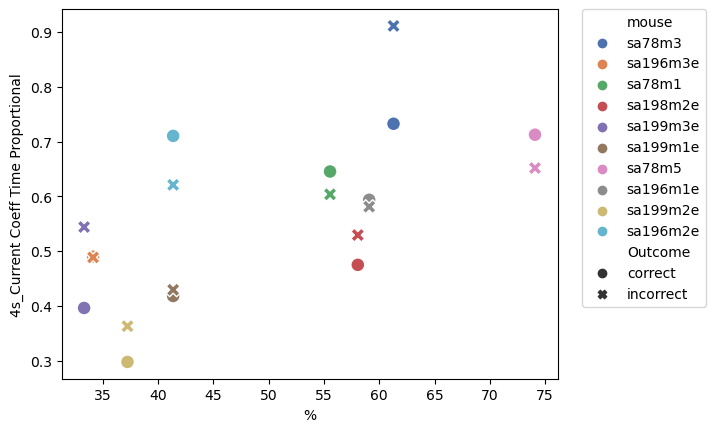

In [162]:
sns.scatterplot(data=mean_cur_coeff_time_prop_4s, x = '%', y = '4s_Current Coeff Time Proportional', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [163]:
lagged_1_duration_4s = get_performance(df_grouped_unscaled_ri, 'lagged_1_duration', 4)

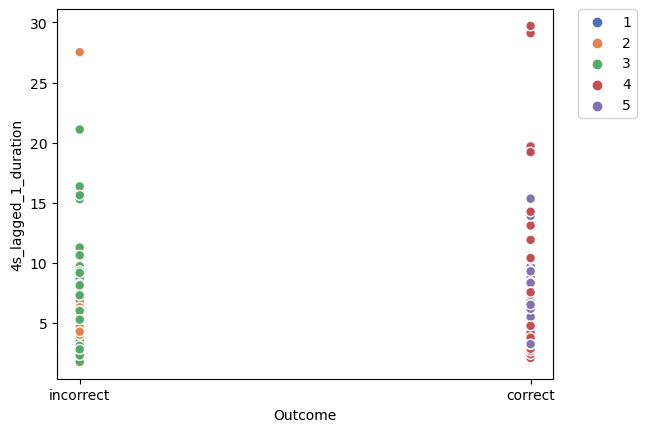

In [164]:
sns.scatterplot(data=lagged_1_duration_4s, x = 'Outcome', y = '4s_lagged_1_duration', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [165]:
mean_lagged_1_duration_4s = get_mean_performances(lagged_1_duration_4s)

In [166]:
mean_lagged_1_duration_4s
mean_lagged_1_duration_4s.to_csv('mean_arm_dur_past_2.csv', sep='\t', index=False)


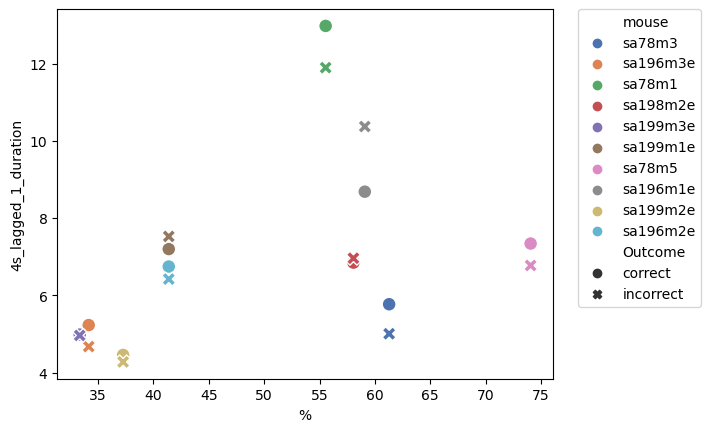

In [167]:
sns.scatterplot(data=mean_lagged_1_duration_4s, x = '%', y = '4s_lagged_1_duration', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [168]:
lagged_1_nose_time_to_max_dist_4s = get_performance(df_grouped_unscaled_ri, 'lagged_1_nose_time_to_max_dist', 4)

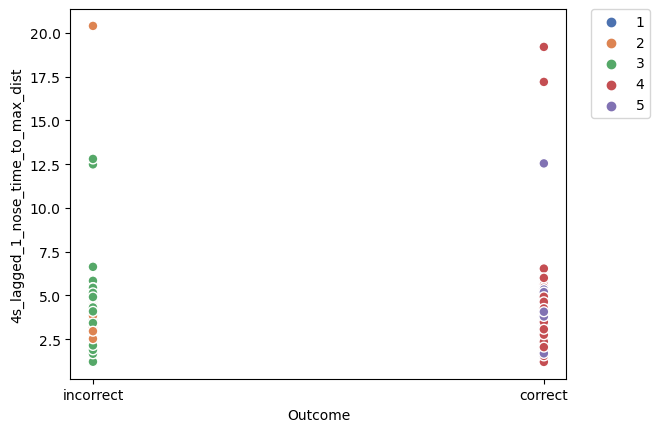

In [169]:
sns.scatterplot(data=lagged_1_nose_time_to_max_dist_4s, x = 'Outcome', y = '4s_lagged_1_nose_time_to_max_dist', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [170]:
mean_lagged_1_nose_time_to_max_dist_4s = get_mean_performances(lagged_1_nose_time_to_max_dist_4s)

In [171]:
mean_lagged_1_nose_time_to_max_dist_4s

mean_lagged_1_nose_time_to_max_dist_4s.to_csv('mean_time_to_max_past_2.csv', sep='\t', index=False)

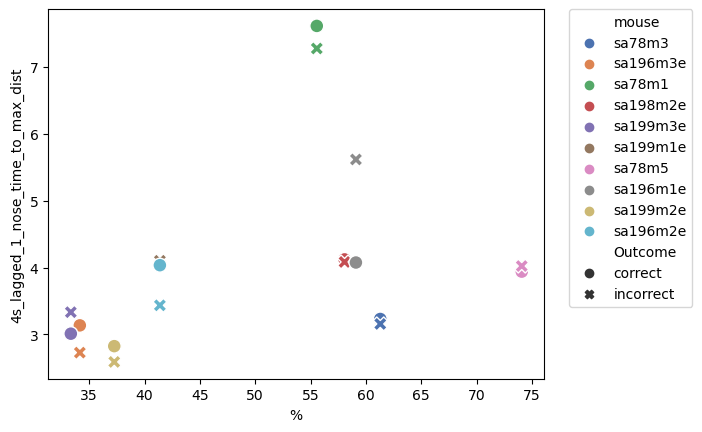

In [172]:
sns.scatterplot(data=mean_lagged_1_nose_time_to_max_dist_4s, x = '%', y = '4s_lagged_1_nose_time_to_max_dist', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [173]:
lagged_1_arm_nose_mov_4s = get_performance(df_grouped_unscaled_ri, 'lagged_1_arm_nose_mov', 4)

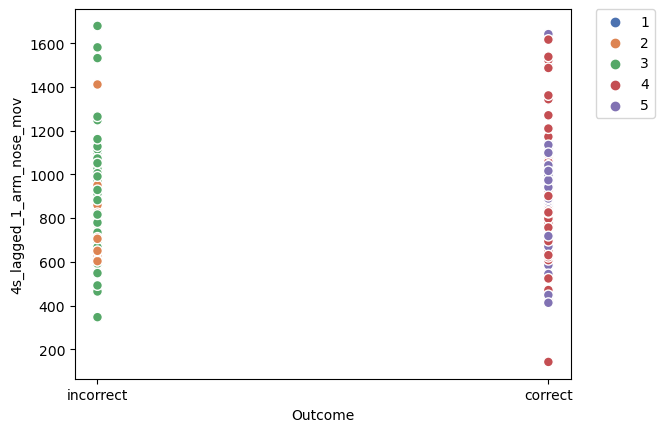

In [174]:
sns.scatterplot(data=lagged_1_arm_nose_mov_4s, x = 'Outcome', y = '4s_lagged_1_arm_nose_mov', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [175]:
mean_lagged_1_arm_nose_mov_4s = get_mean_performances(lagged_1_arm_nose_mov_4s)

In [176]:
mean_lagged_1_arm_nose_mov_4s

mean_lagged_1_arm_nose_mov_4s.to_csv('dist_in_arm_past_2_nose.csv', sep='\t', index=False)

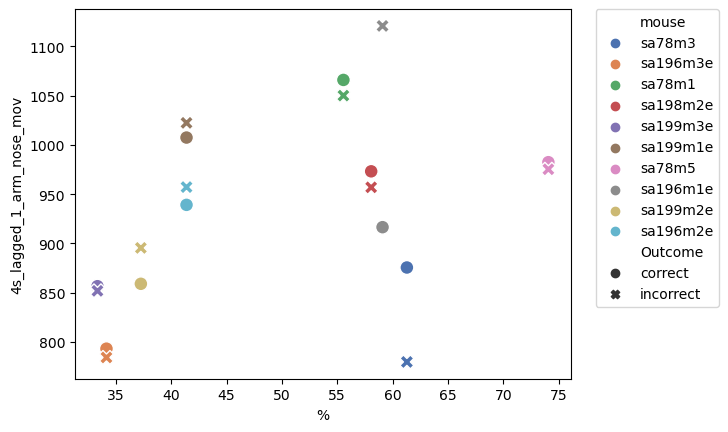

In [177]:
sns.scatterplot(data=mean_lagged_1_arm_nose_mov_4s, x = '%', y = '4s_lagged_1_arm_nose_mov', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [178]:
lagged_1_arm_nose_vel_4s = get_performance(df_grouped_unscaled_ri, 'lagged_1_arm_nose_vel', 4)

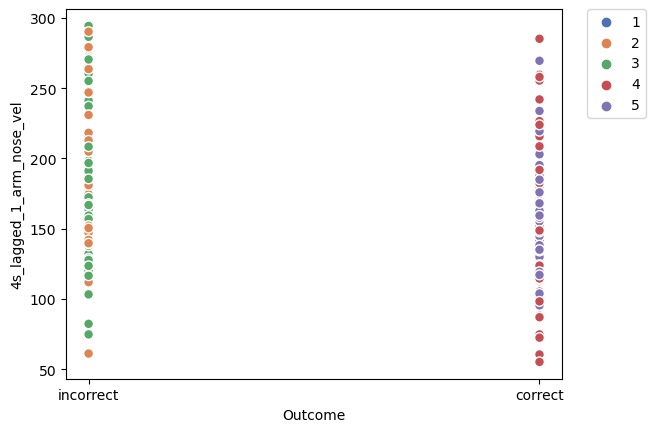

In [179]:
sns.scatterplot(data=lagged_1_arm_nose_vel_4s, x = 'Outcome', y = '4s_lagged_1_arm_nose_vel', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [180]:
mean_lagged_1_arm_nose_vel_4s = get_mean_performances(lagged_1_arm_nose_vel_4s)

In [181]:
mean_lagged_1_arm_nose_vel_4s
mean_lagged_1_arm_nose_vel_4s.to_csv('mean_vel_past_2_nose.csv', sep='\t', index=False)

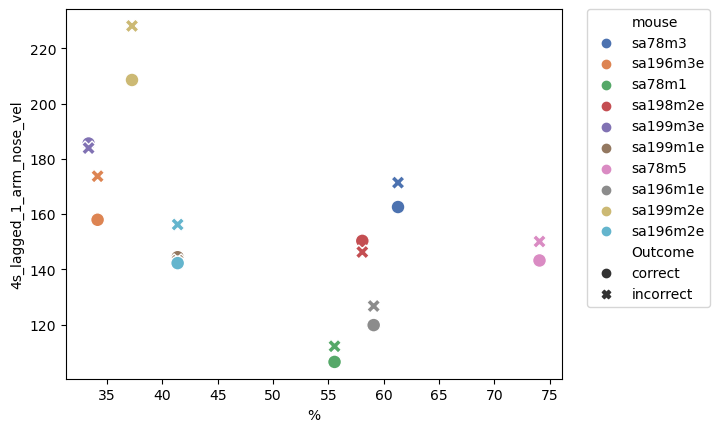

In [182]:
sns.scatterplot(data=mean_lagged_1_arm_nose_vel_4s, x = '%', y = '4s_lagged_1_arm_nose_vel', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [183]:
lagged_1_arm_tail_mov_4s = get_performance(df_grouped_unscaled_ri, 'lagged_1_arm_tail_mov', 4)

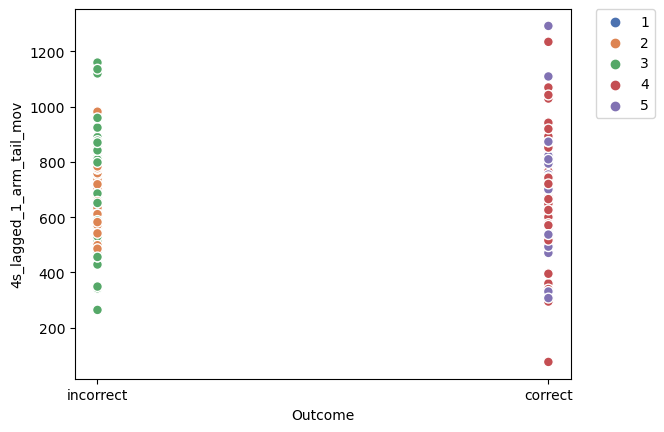

In [184]:
sns.scatterplot(data=lagged_1_arm_tail_mov_4s, x = 'Outcome', y = '4s_lagged_1_arm_tail_mov', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [185]:
mean_lagged_1_arm_tail_mov_4s = get_mean_performances(lagged_1_arm_tail_mov_4s)

In [186]:
mean_lagged_1_arm_tail_mov_4s
mean_lagged_1_arm_tail_mov_4s.to_csv('dist_in_arm_past_2_tail.csv', sep='\t', index=False)

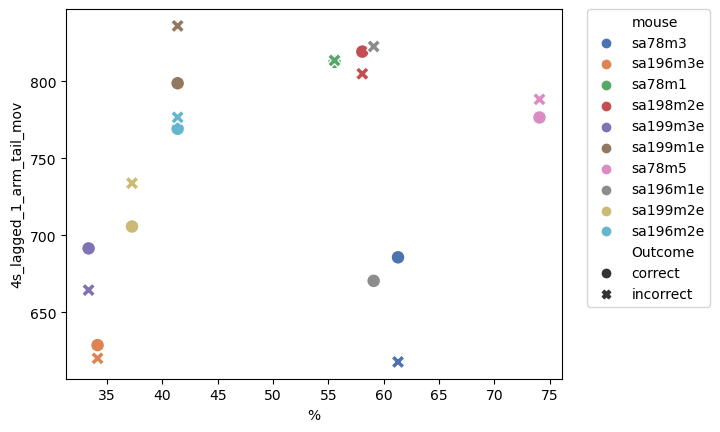

In [187]:
sns.scatterplot(data=mean_lagged_1_arm_tail_mov_4s, x = '%', y = '4s_lagged_1_arm_tail_mov', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [188]:
lagged_1_arm_tail_vel_4s = get_performance(df_grouped_unscaled_ri, 'lagged_1_arm_tail_vel', 4)

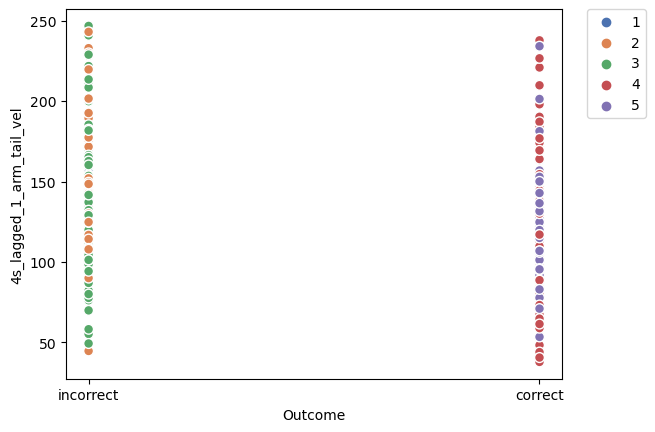

In [189]:
sns.scatterplot(data=lagged_1_arm_tail_vel_4s, x = 'Outcome', y = '4s_lagged_1_arm_tail_vel', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [190]:
mean_lagged_1_arm_tail_vel_4s = get_mean_performances(lagged_1_arm_tail_vel_4s)

In [191]:
mean_lagged_1_arm_tail_vel_4s
mean_lagged_1_arm_tail_vel_4s.to_csv('mean_vel_past_2_tail.csv', sep='\t', index=False)

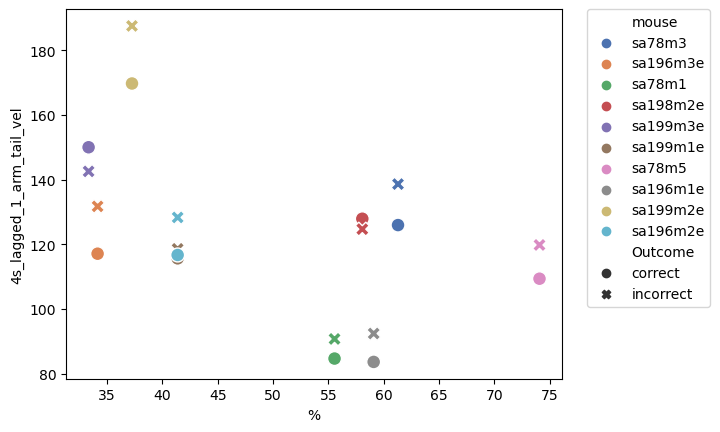

In [192]:
sns.scatterplot(data=mean_lagged_1_arm_tail_vel_4s, x = '%', y = '4s_lagged_1_arm_tail_vel', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [193]:
lagged_1_entry_tortuosity_4s = get_performance(df_grouped_unscaled_ri, 'lagged_1_entry_tortuosity', 4)

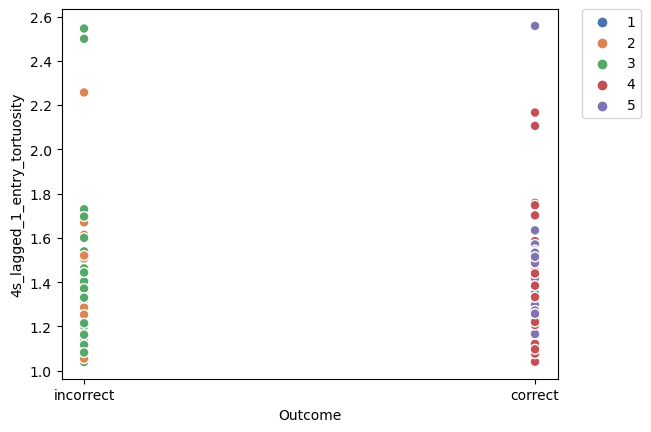

In [194]:
sns.scatterplot(data=lagged_1_entry_tortuosity_4s, x = 'Outcome', y = '4s_lagged_1_entry_tortuosity', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [195]:
mean_lagged_1_entry_tortuosity_4s = get_mean_performances(lagged_1_entry_tortuosity_4s)

In [196]:
mean_lagged_1_entry_tortuosity_4s

,mouse,4s_lagged_1_entry_tortuosity,%,Outcome
0,sa78m3,1.279694,61.290323,correct
1,sa78m3,1.232657,61.290323,incorrect
2,sa196m3e,1.309475,34.146341,correct
3,sa196m3e,1.253219,34.146341,incorrect
4,sa78m1,1.510113,55.555556,correct
5,sa78m1,1.490542,55.555556,incorrect
6,sa198m2e,1.284857,58.064516,correct
7,sa198m2e,1.285521,58.064516,incorrect
8,sa199m3e,1.210838,33.333333,correct
9,sa199m3e,1.305812,33.333333,incorrect


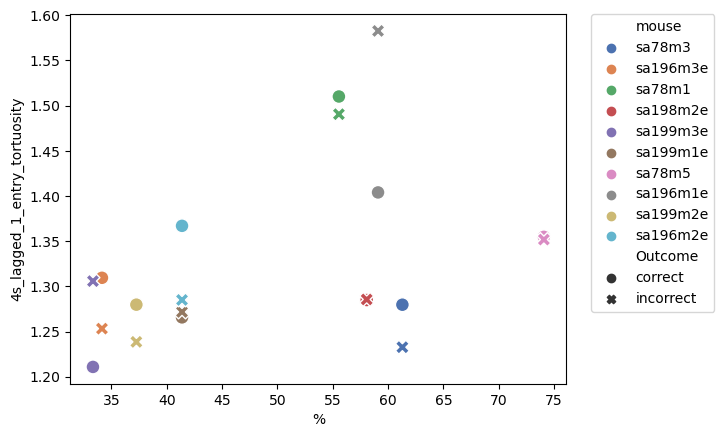

In [197]:
sns.scatterplot(data=mean_lagged_1_entry_tortuosity_4s, x = '%', y = '4s_lagged_1_entry_tortuosity', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [203]:
lagged_1_exit_tortuosity_4s = get_performance(df_grouped_unscaled_ri, 'lagged_1_exit_tortuosity', 4)

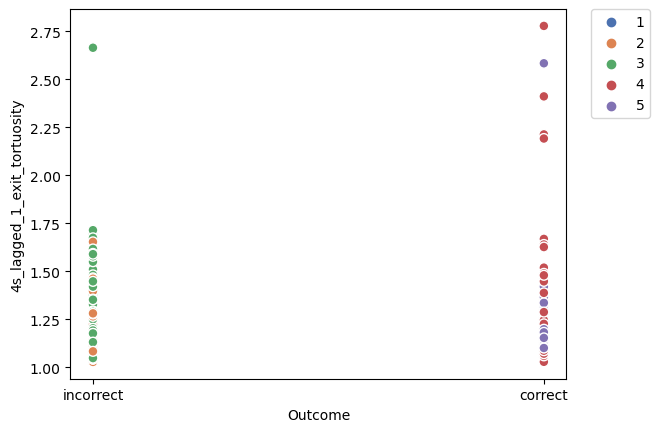

In [204]:
sns.scatterplot(data=lagged_1_exit_tortuosity_4s, x = 'Outcome', y = '4s_lagged_1_exit_tortuosity', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [205]:
mean_lagged_1_exit_tortuosity_4s = get_mean_performances(lagged_1_exit_tortuosity_4s)

In [206]:
mean_lagged_1_exit_tortuosity_4s

mean_lagged_1_exit_tortuosity_4s.to_csv('mean_exit_tortuosity_past_2.csv', sep='\t', index=False)

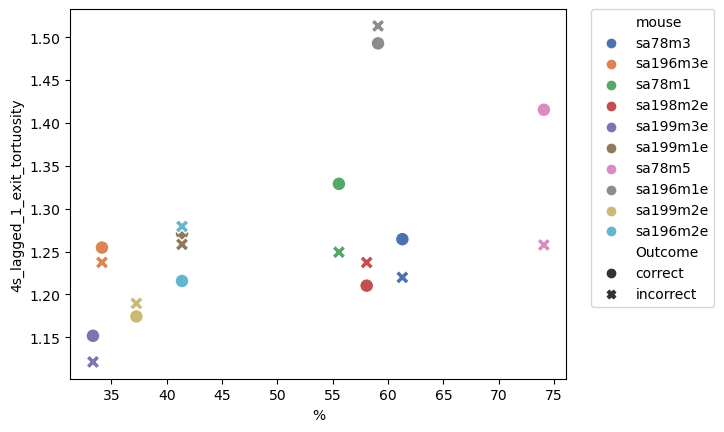

In [207]:
sns.scatterplot(data=mean_lagged_1_exit_tortuosity_4s, x = '%', y = '4s_lagged_1_exit_tortuosity', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [208]:
lagged_1_other_tortuosity_4s = get_performance(df_grouped_unscaled_ri, 'lagged_1_other_tortuosity', 4)

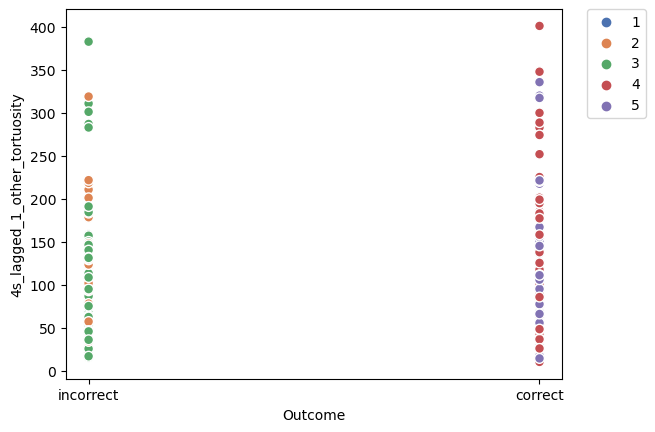

In [209]:
sns.scatterplot(data=lagged_1_other_tortuosity_4s, x = 'Outcome', y = '4s_lagged_1_other_tortuosity', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [210]:
mean_lagged_1_other_tortuosity_4s = get_mean_performances(lagged_1_other_tortuosity_4s)

In [211]:
mean_lagged_1_other_tortuosity_4s


,mouse,4s_lagged_1_other_tortuosity,%,Outcome
0,sa78m3,121.537703,61.290323,correct
1,sa78m3,57.104103,61.290323,incorrect
2,sa196m3e,80.498127,34.146341,correct
3,sa196m3e,54.646011,34.146341,incorrect
4,sa78m1,227.617559,55.555556,correct
5,sa78m1,148.848957,55.555556,incorrect
6,sa198m2e,109.346479,58.064516,correct
7,sa198m2e,77.482168,58.064516,incorrect
8,sa199m3e,78.594111,33.333333,correct
9,sa199m3e,83.732073,33.333333,incorrect


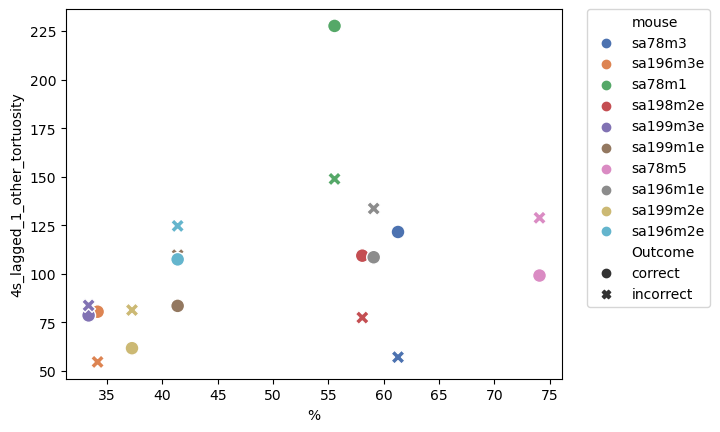

In [212]:
sns.scatterplot(data=mean_lagged_1_other_tortuosity_4s, x = '%', y = '4s_lagged_1_other_tortuosity', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [213]:
entry_latency_4s = get_performance(df_grouped_unscaled_ri, 'Entry Latency', 4)

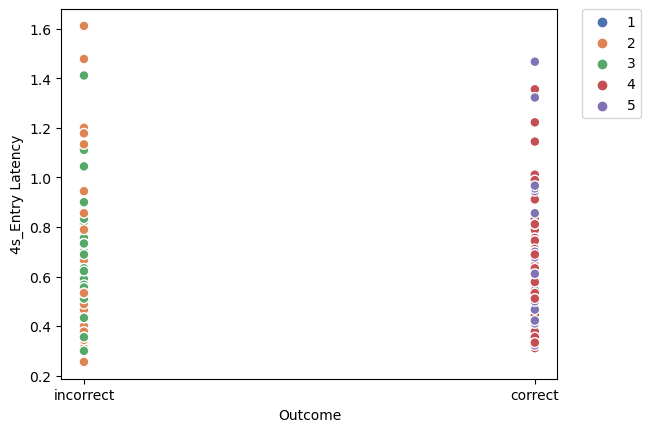

In [214]:
sns.scatterplot(data=entry_latency_4s, x = 'Outcome', y = '4s_Entry Latency', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [215]:
mean_entry_latency_4s = get_mean_performances(entry_latency_4s)

In [216]:
mean_entry_latency_4s

,mouse,4s_Entry Latency,%,Outcome
0,sa78m3,0.663158,61.290323,correct
1,sa78m3,0.807407,61.290323,incorrect
2,sa196m3e,0.619048,34.146341,correct
3,sa196m3e,0.556790,34.146341,incorrect
4,sa78m1,0.650000,55.555556,correct
5,sa78m1,0.644444,55.555556,incorrect
6,sa198m2e,0.573457,58.064516,correct
7,sa198m2e,0.553846,58.064516,incorrect
8,sa199m3e,0.417460,33.333333,correct
9,sa199m3e,0.450397,33.333333,incorrect


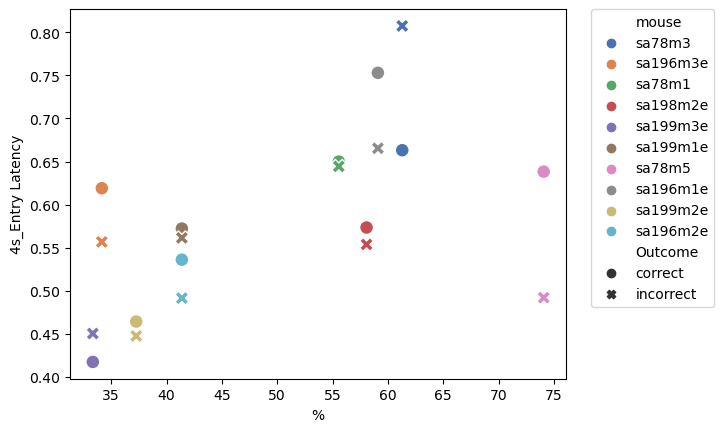

In [217]:
sns.scatterplot(data=mean_entry_latency_4s, x = '%', y = '4s_Entry Latency', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [218]:
lagged_1_new_cur_coeff_4s = get_performance(df_grouped_unscaled_ri, 'New Lagged 1 Cur Coeff', 4)

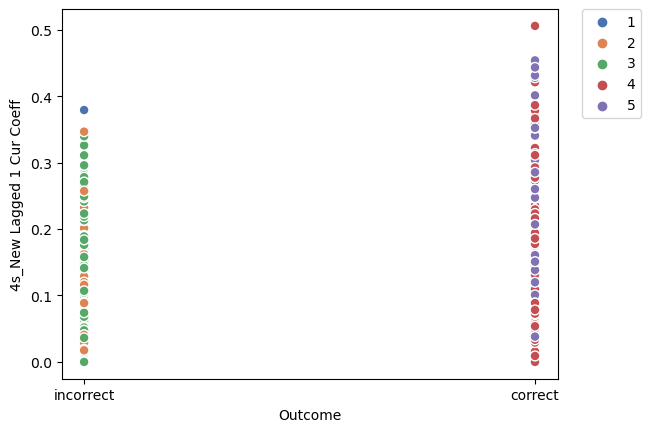

In [219]:
sns.scatterplot(data=lagged_1_new_cur_coeff_4s, x = 'Outcome', y = '4s_New Lagged 1 Cur Coeff', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [220]:
mean_lagged_1_new_cur_coeff_4s = get_mean_performances(lagged_1_new_cur_coeff_4s)

In [221]:
mean_lagged_1_new_cur_coeff_4s

,mouse,4s_New Lagged 1 Cur Coeff,%,Outcome
0,sa78m3,0.206784,61.290323,correct
1,sa78m3,0.103511,61.290323,incorrect
2,sa196m3e,0.121710,34.146341,correct
3,sa196m3e,0.157696,34.146341,incorrect
4,sa78m1,0.184686,55.555556,correct
5,sa78m1,0.166438,55.555556,incorrect
6,sa198m2e,0.171331,58.064516,correct
7,sa198m2e,0.075171,58.064516,incorrect
8,sa199m3e,0.241503,33.333333,correct
9,sa199m3e,0.083372,33.333333,incorrect


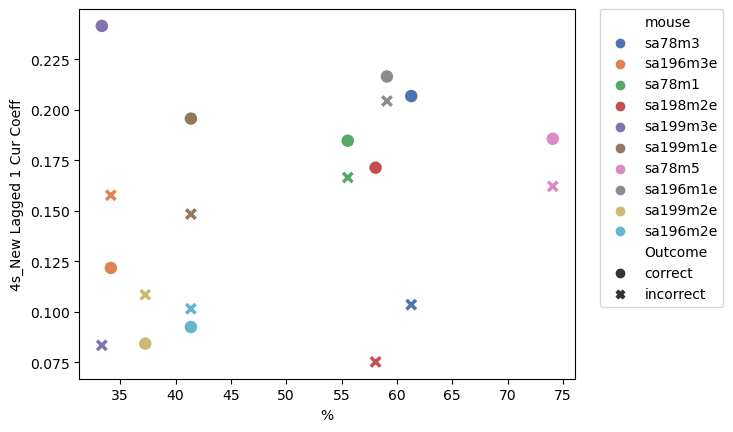

In [222]:
sns.scatterplot(data=mean_lagged_1_new_cur_coeff_4s, x = '%', y = '4s_New Lagged 1 Cur Coeff', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [223]:
middle_duration_4s = get_performance(df_grouped_unscaled_ri, 'Middle Duration', 4)

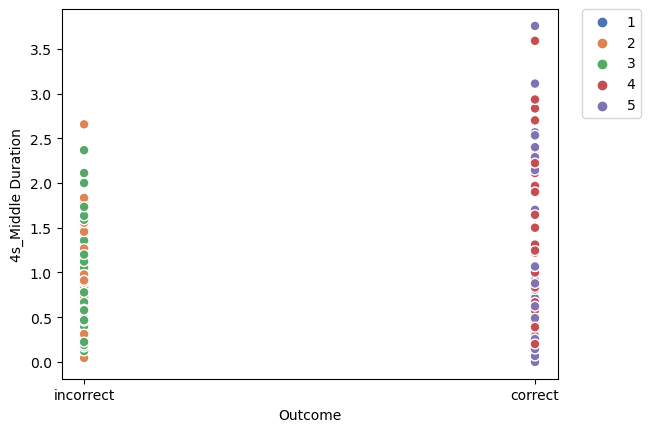

In [224]:
sns.scatterplot(data=middle_duration_4s, x = 'Outcome', y = '4s_Middle Duration', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [225]:
mean_middle_duration_4s = get_mean_performances(middle_duration_4s)

In [226]:
mean_middle_duration_4s

,mouse,4s_Middle Duration,%,Outcome
0,sa78m3,1.308187,61.290323,correct
1,sa78m3,1.145370,61.290323,incorrect
2,sa196m3e,0.849206,34.146341,correct
3,sa196m3e,0.831687,34.146341,incorrect
4,sa78m1,0.733333,55.555556,correct
5,sa78m1,0.631944,55.555556,incorrect
6,sa198m2e,0.548765,58.064516,correct
7,sa198m2e,0.509402,58.064516,incorrect
8,sa199m3e,0.523016,33.333333,correct
9,sa199m3e,0.794841,33.333333,incorrect


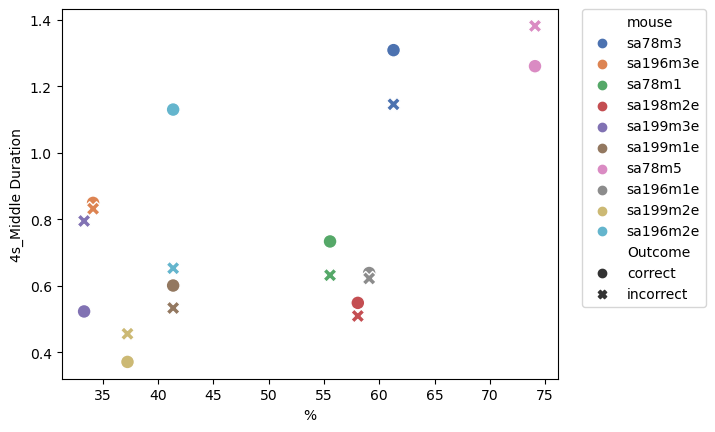

In [227]:
sns.scatterplot(data=mean_middle_duration_4s, x = '%', y = '4s_Middle Duration', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [ ]:
# 5s

In [228]:
exitmidentry_duration_5s = get_performance(df_grouped_unscaled_ri, 'ExitMidEntry Duration', 5)

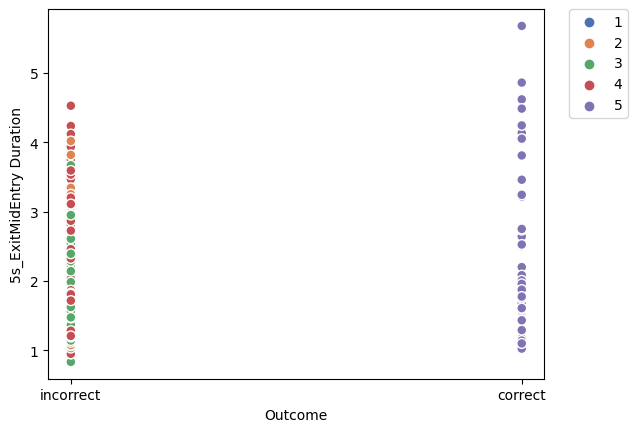

In [229]:
sns.scatterplot(data=exitmidentry_duration_5s, x = 'Outcome', y = '5s_ExitMidEntry Duration', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [230]:
mean_exitmidentry_duration_5s = get_mean_performances(exitmidentry_duration_5s)

In [231]:
mean_exitmidentry_duration_5s

,mouse,5s_ExitMidEntry Duration,%,Outcome
0,sa78m3,2.988636,35.483871,correct
1,sa78m3,3.123333,35.483871,incorrect
2,sa196m3e,2.027778,7.317073,correct
3,sa196m3e,1.922368,7.317073,incorrect
4,sa78m1,2.497222,16.666667,correct
5,sa78m1,2.433889,16.666667,incorrect
6,sa198m2e,1.665625,25.806452,correct
7,sa198m2e,1.636594,25.806452,incorrect
8,sa199m3e,1.588889,14.285714,correct
9,sa199m3e,1.740741,14.285714,incorrect


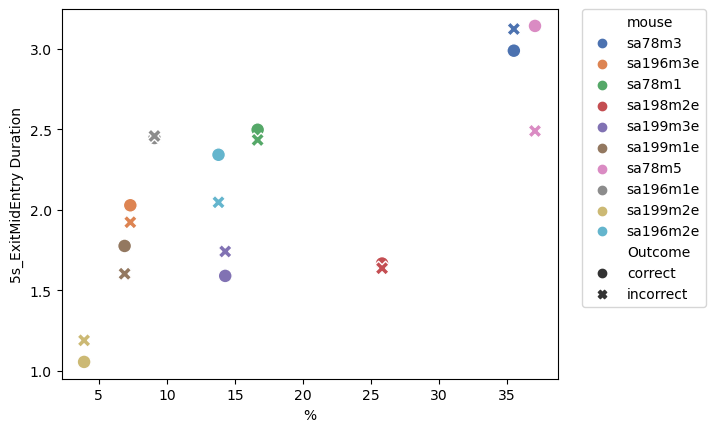

In [232]:
sns.scatterplot(data=mean_exitmidentry_duration_5s, x = '%', y = '5s_ExitMidEntry Duration', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [233]:
middle_tortuosity_5s = get_performance(df_grouped_unscaled_ri, 'Middle Tortuosity', 5)

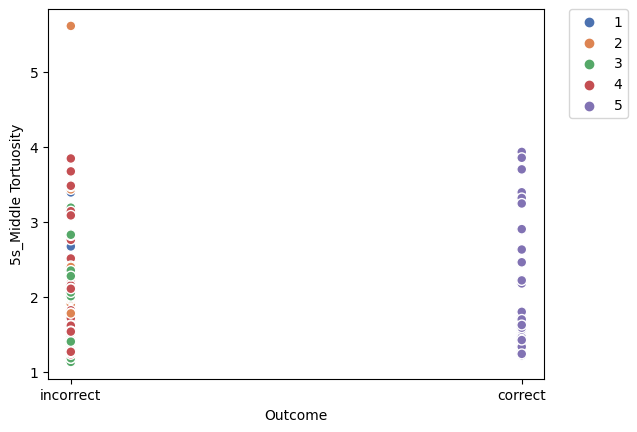

In [234]:
sns.scatterplot(data=middle_tortuosity_5s, x = 'Outcome', y = '5s_Middle Tortuosity', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [235]:
mean_middle_tortuosity_5s = get_mean_performances(middle_tortuosity_5s)

In [236]:
mean_middle_tortuosity_5s

,mouse,5s_Middle Tortuosity,%,Outcome
0,sa78m3,2.180051,35.483871,correct
1,sa78m3,2.209316,35.483871,incorrect
2,sa196m3e,1.575765,7.317073,correct
3,sa196m3e,1.890530,7.317073,incorrect
4,sa78m1,1.523206,16.666667,correct
5,sa78m1,1.517809,16.666667,incorrect
6,sa198m2e,1.413031,25.806452,correct
7,sa198m2e,1.362862,25.806452,incorrect
8,sa199m3e,1.699603,14.285714,correct
9,sa199m3e,1.603218,14.285714,incorrect


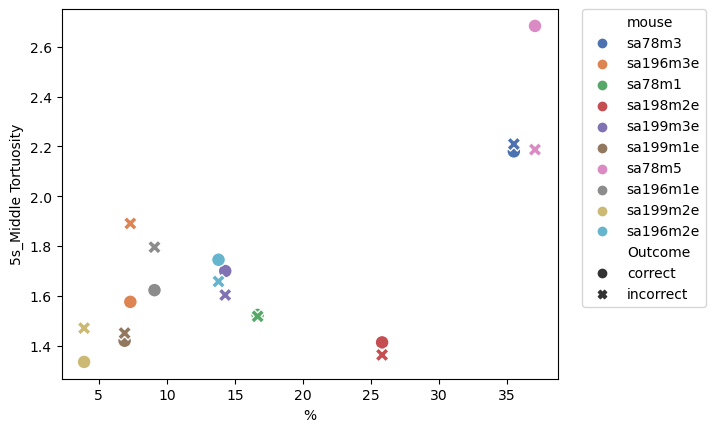

In [237]:
sns.scatterplot(data=mean_middle_tortuosity_5s, x = '%', y = '5s_Middle Tortuosity', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [238]:
new_cur_coeff_time_prop_5s = get_performance(df_grouped_unscaled_ri, 'New Current Coeff Time Proportional', 5)

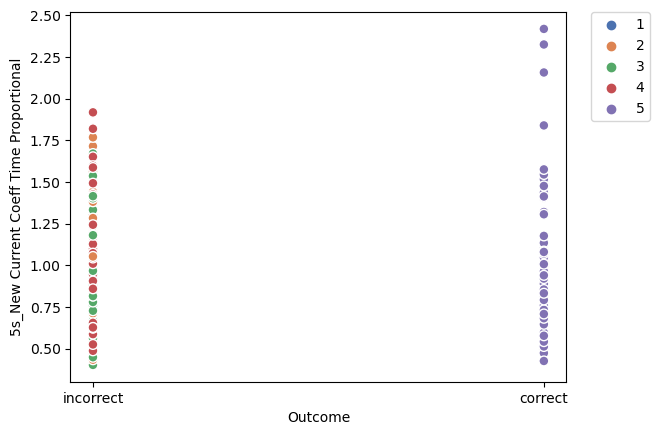

In [239]:
sns.scatterplot(data=new_cur_coeff_time_prop_5s, x = 'Outcome', y = '5s_New Current Coeff Time Proportional', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [240]:
mean_new_cur_coeff_time_prop_5s = get_mean_performances(new_cur_coeff_time_prop_5s)

In [241]:
mean_new_cur_coeff_time_prop_5s

,mouse,5s_New Current Coeff Time Proportional,%,Outcome
0,sa78m3,1.220489,35.483871,correct
1,sa78m3,1.341127,35.483871,incorrect
2,sa196m3e,0.950888,7.317073,correct
3,sa196m3e,0.832424,7.317073,incorrect
4,sa78m1,1.065456,16.666667,correct
5,sa78m1,1.070820,16.666667,incorrect
6,sa198m2e,0.865148,25.806452,correct
7,sa198m2e,0.928790,25.806452,incorrect
8,sa199m3e,0.658954,14.285714,correct
9,sa199m3e,0.838167,14.285714,incorrect


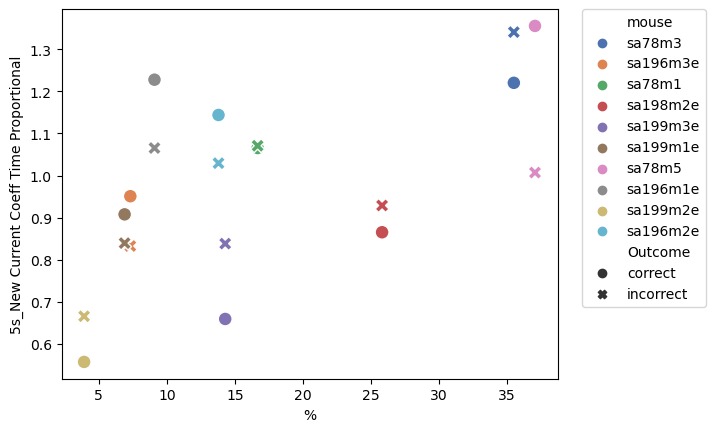

In [242]:
sns.scatterplot(data=mean_new_cur_coeff_time_prop_5s, x = '%', y = '5s_New Current Coeff Time Proportional', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [243]:
new_current_coeff_5s = get_performance(df_grouped_unscaled_ri, 'New Current Coeff', 5)

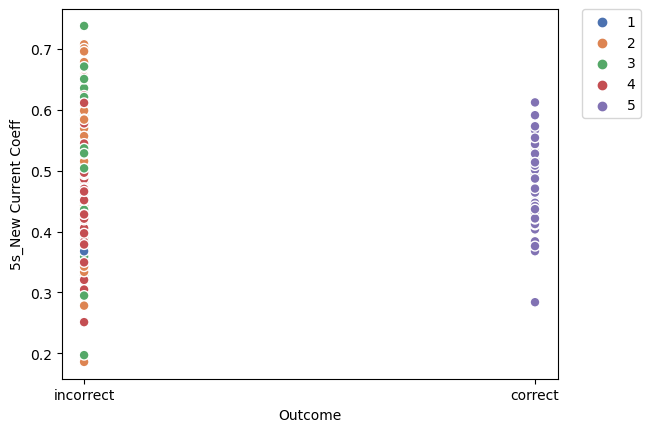

In [244]:
sns.scatterplot(data=new_current_coeff_5s, x = 'Outcome', y = '5s_New Current Coeff', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [245]:
mean_new_current_coeff_5s = get_mean_performances(new_current_coeff_5s)

In [246]:
mean_new_current_coeff_5s

,mouse,5s_New Current Coeff,%,Outcome
0,sa78m3,0.482142,35.483871,correct
1,sa78m3,0.474427,35.483871,incorrect
2,sa196m3e,0.463516,7.317073,correct
3,sa196m3e,0.448973,7.317073,incorrect
4,sa78m1,0.453769,16.666667,correct
5,sa78m1,0.464447,16.666667,incorrect
6,sa198m2e,0.507490,25.806452,correct
7,sa198m2e,0.561606,25.806452,incorrect
8,sa199m3e,0.401272,14.285714,correct
9,sa199m3e,0.479447,14.285714,incorrect


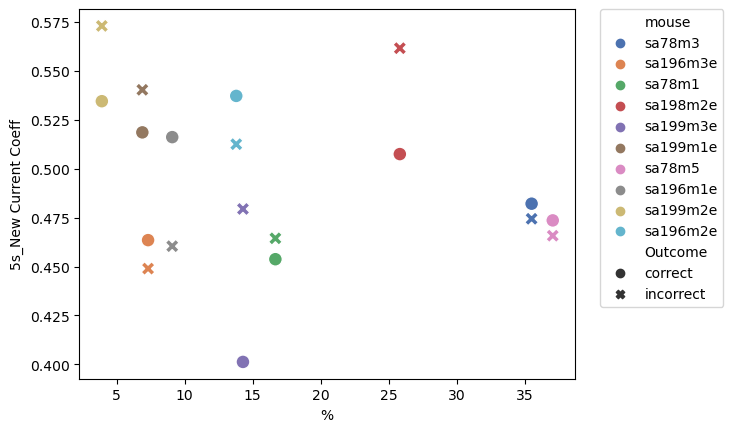

In [247]:
sns.scatterplot(data=mean_new_current_coeff_5s, x = '%', y = '5s_New Current Coeff', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [248]:
current_coeff_5s = get_performance(df_grouped_unscaled_ri, 'Current Coeff', 5)

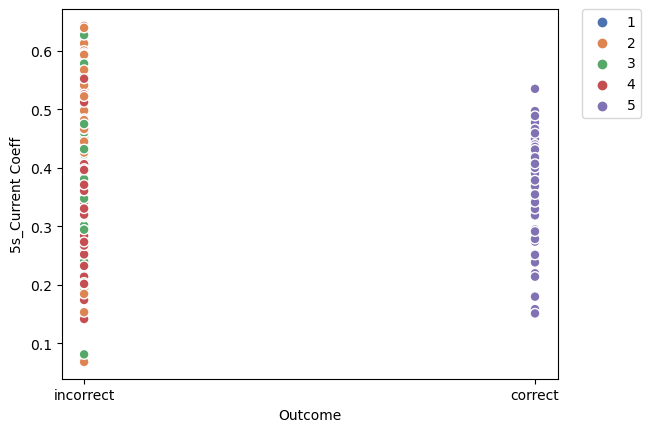

In [249]:
sns.scatterplot(data=current_coeff_5s, x = 'Outcome', y = '5s_Current Coeff', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [250]:
mean_current_coeff_5s = get_mean_performances(current_coeff_5s)

In [251]:
mean_current_coeff_5s

,mouse,5s_Current Coeff,%,Outcome
0,sa78m3,0.342753,35.483871,correct
1,sa78m3,0.360431,35.483871,incorrect
2,sa196m3e,0.384044,7.317073,correct
3,sa196m3e,0.343722,7.317073,incorrect
4,sa78m1,0.328851,16.666667,correct
5,sa78m1,0.370484,16.666667,incorrect
6,sa198m2e,0.364865,25.806452,correct
7,sa198m2e,0.440342,25.806452,incorrect
8,sa199m3e,0.245084,14.285714,correct
9,sa199m3e,0.372821,14.285714,incorrect


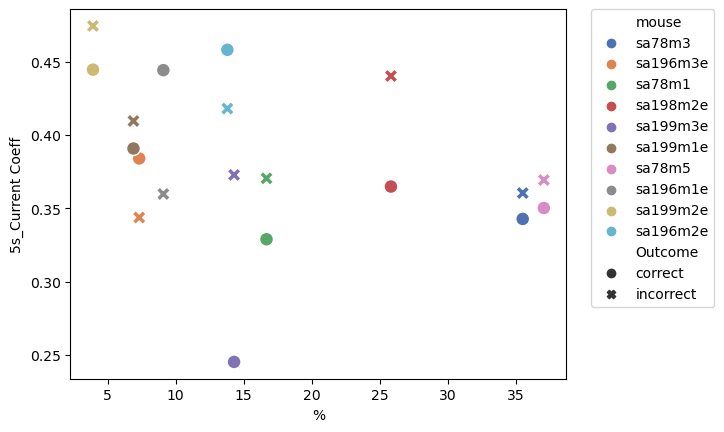

In [252]:
sns.scatterplot(data=mean_current_coeff_5s, x = '%', y = '5s_Current Coeff', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [253]:
cur_coeff_time_prop_5s = get_performance(df_grouped_unscaled_ri, 'Current Coeff Time Proportional', 5)

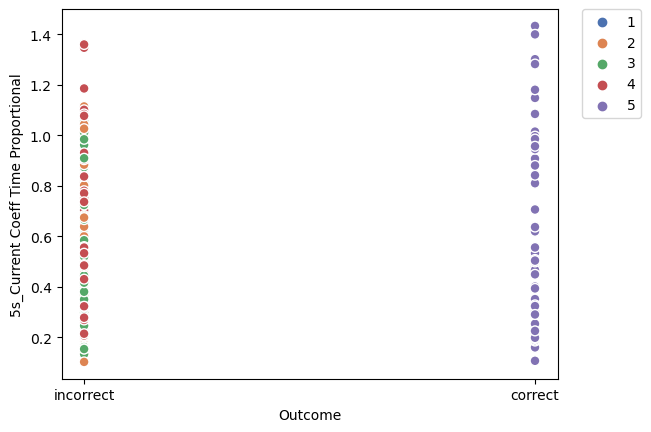

In [254]:
sns.scatterplot(data=cur_coeff_time_prop_5s, x = 'Outcome', y = '5s_Current Coeff Time Proportional', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [255]:
mean_cur_coeff_time_prop_5s = get_mean_performances(cur_coeff_time_prop_5s)

In [256]:
mean_cur_coeff_time_prop_5s

,mouse,5s_Current Coeff Time Proportional,%,Outcome
0,sa78m3,0.717885,35.483871,correct
1,sa78m3,0.829522,35.483871,incorrect
2,sa196m3e,0.558683,7.317073,correct
3,sa196m3e,0.475210,7.317073,incorrect
4,sa78m1,0.624542,16.666667,correct
5,sa78m1,0.624036,16.666667,incorrect
6,sa198m2e,0.470046,25.806452,correct
7,sa198m2e,0.499160,25.806452,incorrect
8,sa199m3e,0.347867,14.285714,correct
9,sa199m3e,0.516990,14.285714,incorrect


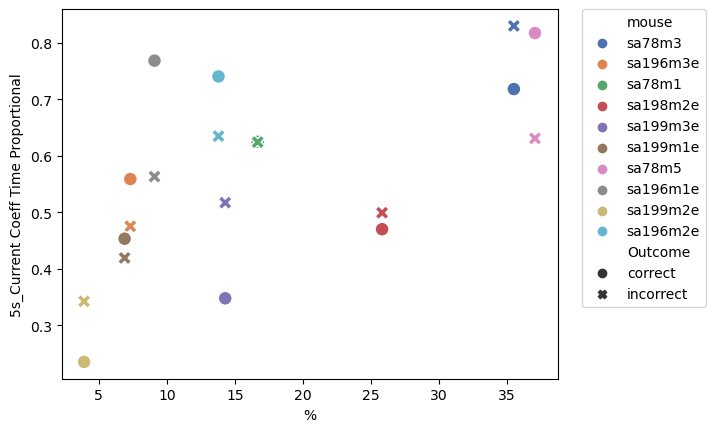

In [257]:
sns.scatterplot(data=mean_cur_coeff_time_prop_5s, x = '%', y = '5s_Current Coeff Time Proportional', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [258]:
lagged_1_duration_5s = get_performance(df_grouped_unscaled_ri, 'lagged_1_duration', 5)

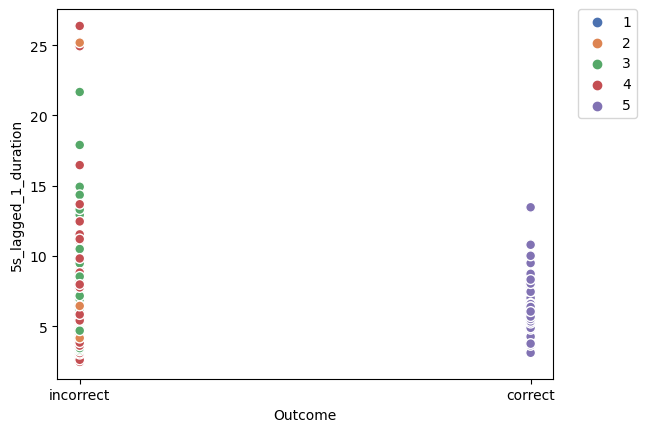

In [259]:
sns.scatterplot(data=lagged_1_duration_5s, x = 'Outcome', y = '5s_lagged_1_duration', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [260]:
mean_lagged_1_duration_5s = get_mean_performances(lagged_1_duration_5s)

In [261]:
mean_lagged_1_duration_5s
mean_lagged_1_duration_5s.to_csv('mean_arm_dur_past_2.csv', sep='\t', index=False)


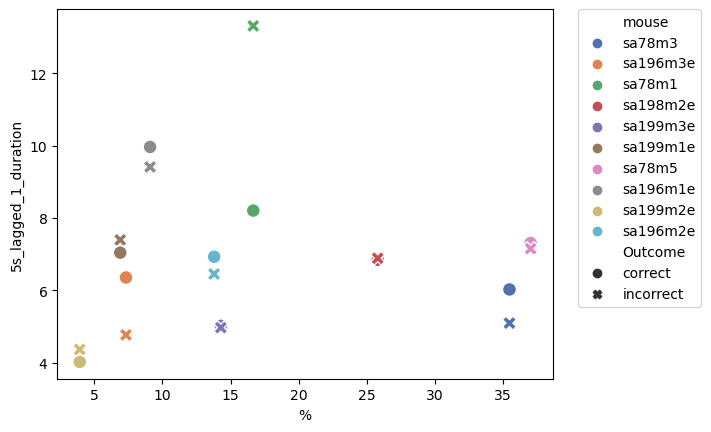

In [262]:
sns.scatterplot(data=mean_lagged_1_duration_5s, x = '%', y = '5s_lagged_1_duration', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [263]:
lagged_1_nose_time_to_max_dist_5s = get_performance(df_grouped_unscaled_ri, 'lagged_1_nose_time_to_max_dist', 5)

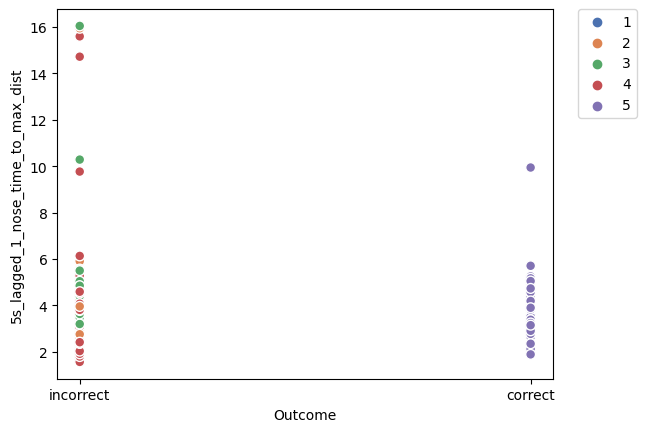

In [264]:
sns.scatterplot(data=lagged_1_nose_time_to_max_dist_5s, x = 'Outcome', y = '5s_lagged_1_nose_time_to_max_dist', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [265]:
mean_lagged_1_nose_time_to_max_dist_5s = get_mean_performances(lagged_1_nose_time_to_max_dist_5s)

In [266]:
mean_lagged_1_nose_time_to_max_dist_5s

mean_lagged_1_nose_time_to_max_dist_5s.to_csv('mean_time_to_max_past_2.csv', sep='\t', index=False)

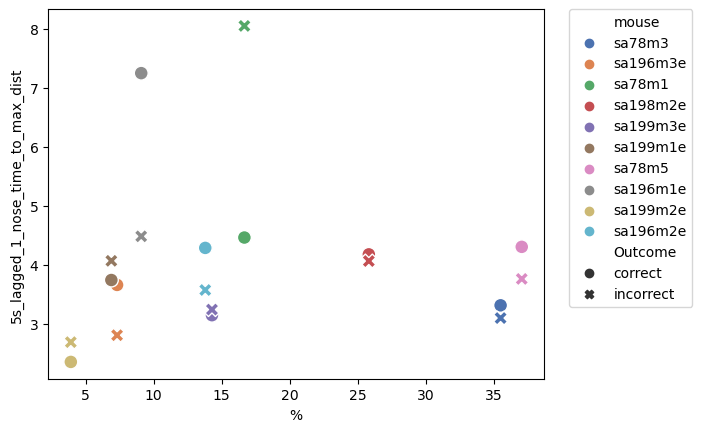

In [267]:
sns.scatterplot(data=mean_lagged_1_nose_time_to_max_dist_5s, x = '%', y = '5s_lagged_1_nose_time_to_max_dist', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [268]:
lagged_1_arm_nose_mov_5s = get_performance(df_grouped_unscaled_ri, 'lagged_1_arm_nose_mov', 5)

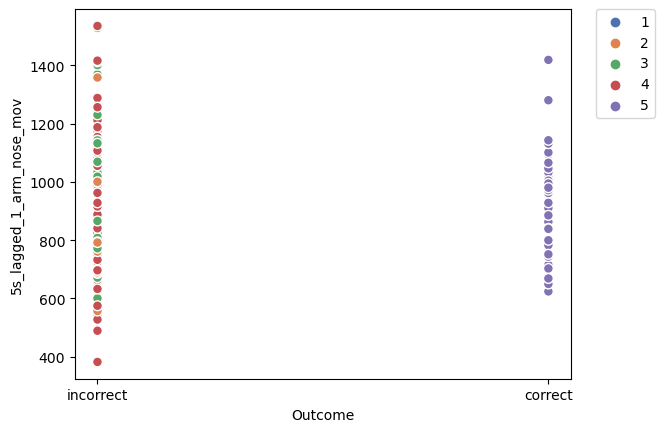

In [269]:
sns.scatterplot(data=lagged_1_arm_nose_mov_5s, x = 'Outcome', y = '5s_lagged_1_arm_nose_mov', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [270]:
mean_lagged_1_arm_nose_mov_5s = get_mean_performances(lagged_1_arm_nose_mov_5s)

In [271]:
mean_lagged_1_arm_nose_mov_5s

mean_lagged_1_arm_nose_mov_5s.to_csv('dist_in_arm_past_2_nose.csv', sep='\t', index=False)

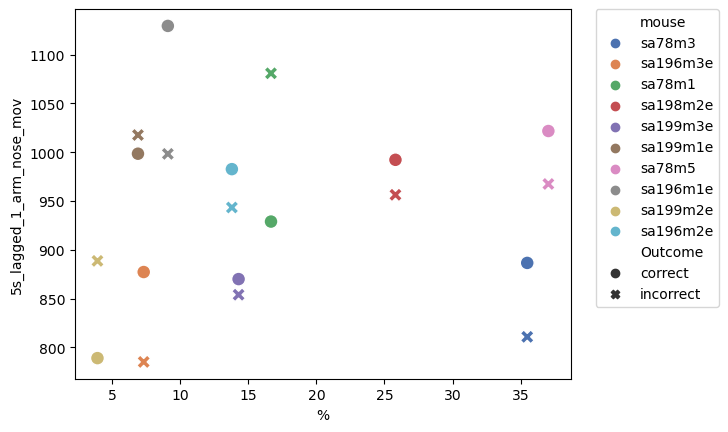

In [272]:
sns.scatterplot(data=mean_lagged_1_arm_nose_mov_5s, x = '%', y = '5s_lagged_1_arm_nose_mov', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [273]:
lagged_1_arm_nose_vel_5s = get_performance(df_grouped_unscaled_ri, 'lagged_1_arm_nose_vel', 5)

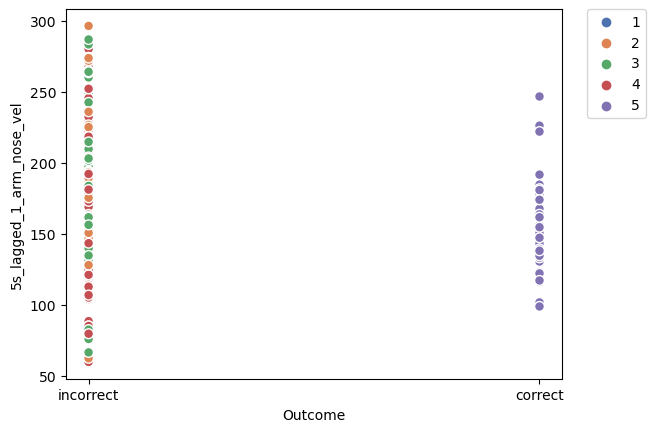

In [274]:
sns.scatterplot(data=lagged_1_arm_nose_vel_5s, x = 'Outcome', y = '5s_lagged_1_arm_nose_vel', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [275]:
mean_lagged_1_arm_nose_vel_5s = get_mean_performances(lagged_1_arm_nose_vel_5s)

In [276]:
mean_lagged_1_arm_nose_vel_5s
mean_lagged_1_arm_nose_vel_5s.to_csv('mean_vel_past_2_nose.csv', sep='\t', index=False)

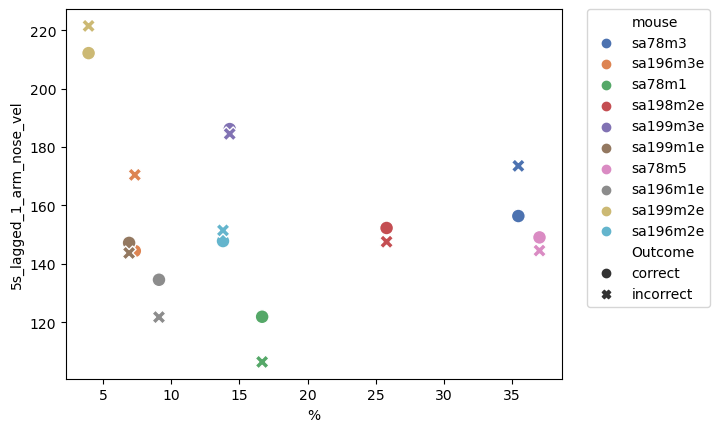

In [277]:
sns.scatterplot(data=mean_lagged_1_arm_nose_vel_5s, x = '%', y = '5s_lagged_1_arm_nose_vel', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [278]:
lagged_1_arm_tail_mov_5s = get_performance(df_grouped_unscaled_ri, 'lagged_1_arm_tail_mov', 5)

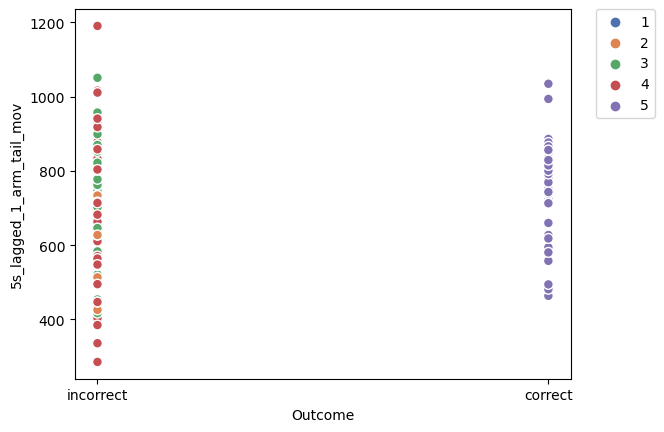

In [279]:
sns.scatterplot(data=lagged_1_arm_tail_mov_5s, x = 'Outcome', y = '5s_lagged_1_arm_tail_mov', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [280]:
mean_lagged_1_arm_tail_mov_5s = get_mean_performances(lagged_1_arm_tail_mov_5s)

In [281]:
mean_lagged_1_arm_tail_mov_5s
mean_lagged_1_arm_tail_mov_5s.to_csv('dist_in_arm_past_2_tail.csv', sep='\t', index=False)

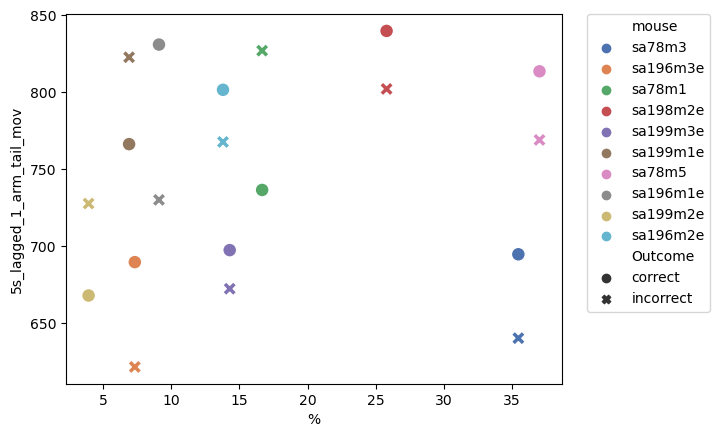

In [282]:
sns.scatterplot(data=mean_lagged_1_arm_tail_mov_5s, x = '%', y = '5s_lagged_1_arm_tail_mov', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [283]:
lagged_1_arm_tail_vel_5s = get_performance(df_grouped_unscaled_ri, 'lagged_1_arm_tail_vel', 5)

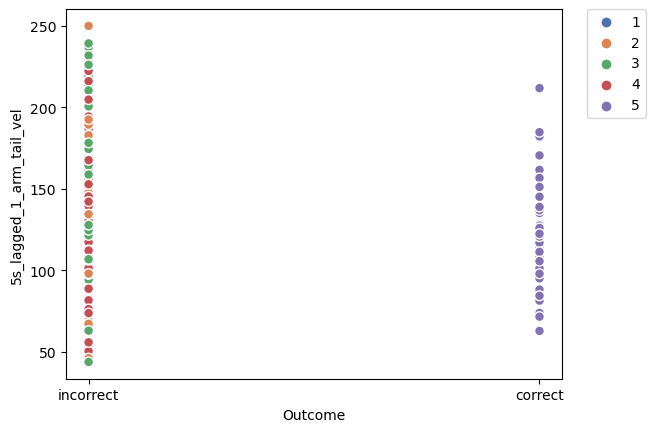

In [284]:
sns.scatterplot(data=lagged_1_arm_tail_vel_5s, x = 'Outcome', y = '5s_lagged_1_arm_tail_vel', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [285]:
mean_lagged_1_arm_tail_vel_5s = get_mean_performances(lagged_1_arm_tail_vel_5s)

In [286]:
mean_lagged_1_arm_tail_vel_5s
mean_lagged_1_arm_tail_vel_5s.to_csv('mean_vel_past_2_tail.csv', sep='\t', index=False)

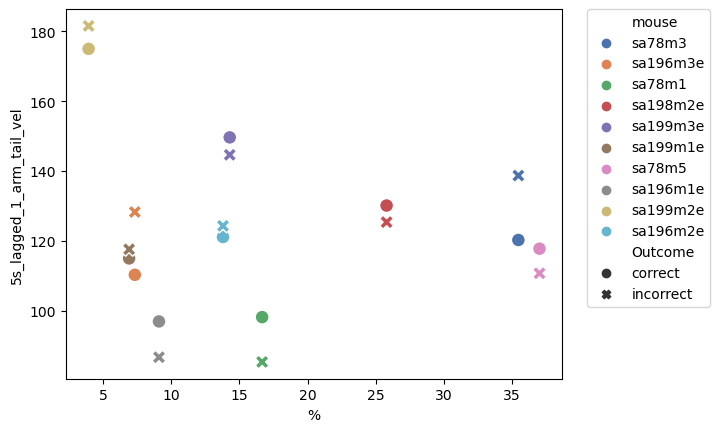

In [287]:
sns.scatterplot(data=mean_lagged_1_arm_tail_vel_5s, x = '%', y = '5s_lagged_1_arm_tail_vel', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [288]:
lagged_1_entry_tortuosity_5s = get_performance(df_grouped_unscaled_ri, 'lagged_1_entry_tortuosity', 5)

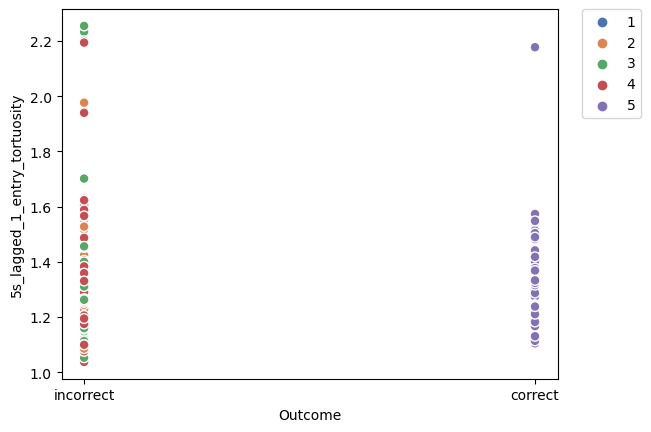

In [289]:
sns.scatterplot(data=lagged_1_entry_tortuosity_5s, x = 'Outcome', y = '5s_lagged_1_entry_tortuosity', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [290]:
mean_lagged_1_entry_tortuosity_5s = get_mean_performances(lagged_1_entry_tortuosity_5s)

In [291]:
mean_lagged_1_entry_tortuosity_5s

,mouse,5s_lagged_1_entry_tortuosity,%,Outcome
0,sa78m3,1.283916,35.483871,correct
1,sa78m3,1.241470,35.483871,incorrect
2,sa196m3e,1.364410,7.317073,correct
3,sa196m3e,1.264189,7.317073,incorrect
4,sa78m1,1.303772,16.666667,correct
5,sa78m1,1.541172,16.666667,incorrect
6,sa198m2e,1.284714,25.806452,correct
7,sa198m2e,1.283005,25.806452,incorrect
8,sa199m3e,1.240284,14.285714,correct
9,sa199m3e,1.279230,14.285714,incorrect


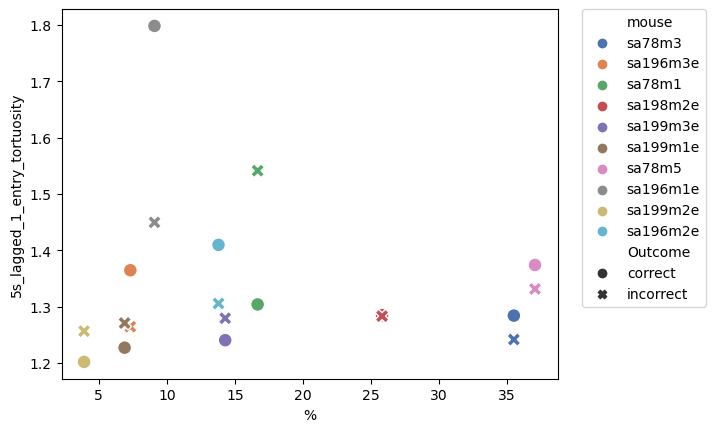

In [292]:
sns.scatterplot(data=mean_lagged_1_entry_tortuosity_5s, x = '%', y = '5s_lagged_1_entry_tortuosity', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [293]:
lagged_1_exit_tortuosity_5s = get_performance(df_grouped_unscaled_ri, 'lagged_1_exit_tortuosity', 5)

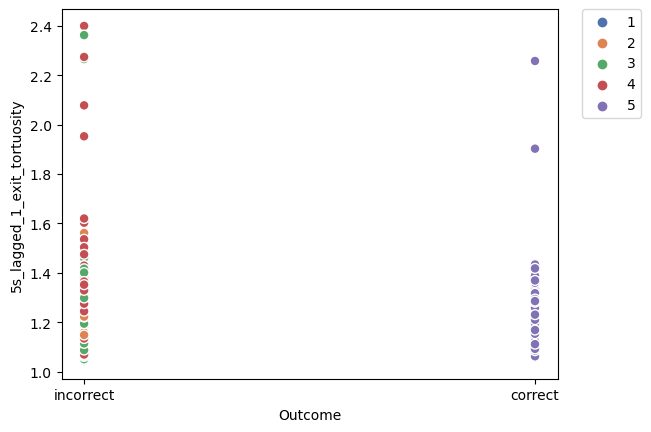

In [294]:
sns.scatterplot(data=lagged_1_exit_tortuosity_5s, x = 'Outcome', y = '5s_lagged_1_exit_tortuosity', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [295]:
mean_lagged_1_exit_tortuosity_5s = get_mean_performances(lagged_1_exit_tortuosity_5s)

In [296]:
mean_lagged_1_exit_tortuosity_5s

mean_lagged_1_exit_tortuosity_5s.to_csv('mean_exit_tortuosity_past_2.csv', sep='\t', index=False)

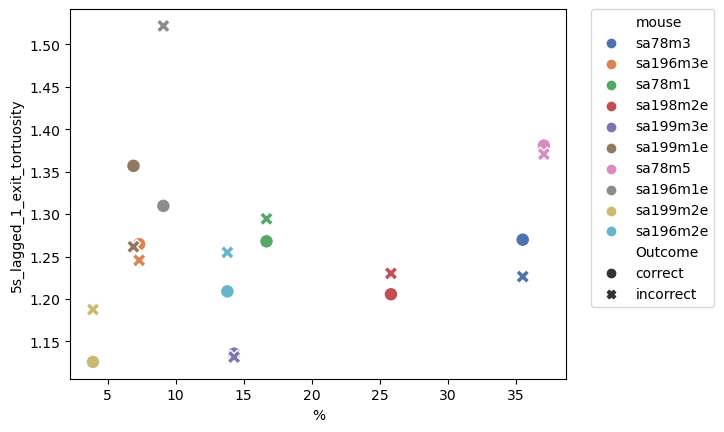

In [297]:
sns.scatterplot(data=mean_lagged_1_exit_tortuosity_5s, x = '%', y = '5s_lagged_1_exit_tortuosity', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [298]:
lagged_1_other_tortuosity_5s = get_performance(df_grouped_unscaled_ri, 'lagged_1_other_tortuosity', 5)

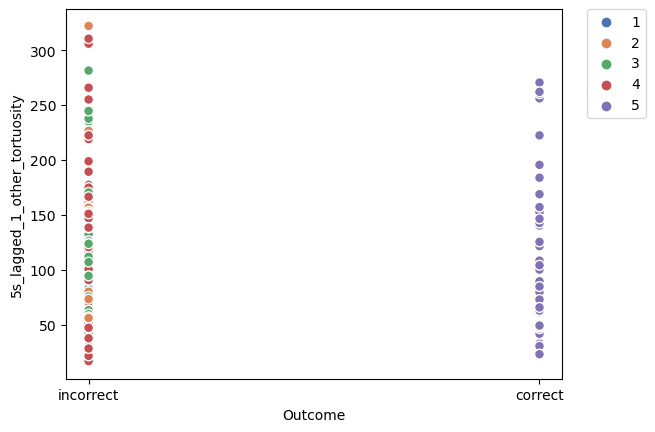

In [299]:
sns.scatterplot(data=lagged_1_other_tortuosity_5s, x = 'Outcome', y = '5s_lagged_1_other_tortuosity', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [300]:
mean_lagged_1_other_tortuosity_5s = get_mean_performances(lagged_1_other_tortuosity_5s)

In [301]:
mean_lagged_1_other_tortuosity_5s


,mouse,5s_lagged_1_other_tortuosity,%,Outcome
0,sa78m3,142.006763,35.483871,correct
1,sa78m3,70.125063,35.483871,incorrect
2,sa196m3e,77.771336,7.317073,correct
3,sa196m3e,62.319074,7.317073,incorrect
4,sa78m1,156.697287,16.666667,correct
5,sa78m1,197.114470,16.666667,incorrect
6,sa198m2e,85.634465,25.806452,correct
7,sa198m2e,100.419303,25.806452,incorrect
8,sa199m3e,82.956156,14.285714,correct
9,sa199m3e,81.552712,14.285714,incorrect


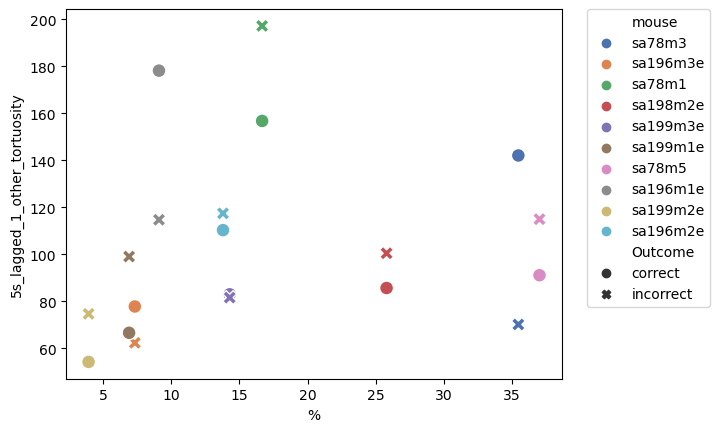

In [302]:
sns.scatterplot(data=mean_lagged_1_other_tortuosity_5s, x = '%', y = '5s_lagged_1_other_tortuosity', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [303]:
entry_latency_5s = get_performance(df_grouped_unscaled_ri, 'Entry Latency', 5)

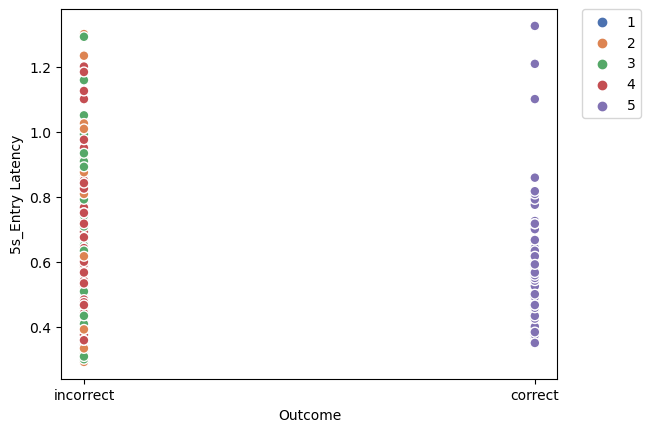

In [304]:
sns.scatterplot(data=entry_latency_5s, x = 'Outcome', y = '5s_Entry Latency', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [305]:
mean_entry_latency_5s = get_mean_performances(entry_latency_5s)

In [306]:
mean_entry_latency_5s

,mouse,5s_Entry Latency,%,Outcome
0,sa78m3,0.671970,35.483871,correct
1,sa78m3,0.740000,35.483871,incorrect
2,sa196m3e,0.627778,7.317073,correct
3,sa196m3e,0.574342,7.317073,incorrect
4,sa78m1,0.650000,16.666667,correct
5,sa78m1,0.655556,16.666667,incorrect
6,sa198m2e,0.569792,25.806452,correct
7,sa198m2e,0.569203,25.806452,incorrect
8,sa199m3e,0.433333,14.285714,correct
9,sa199m3e,0.443287,14.285714,incorrect


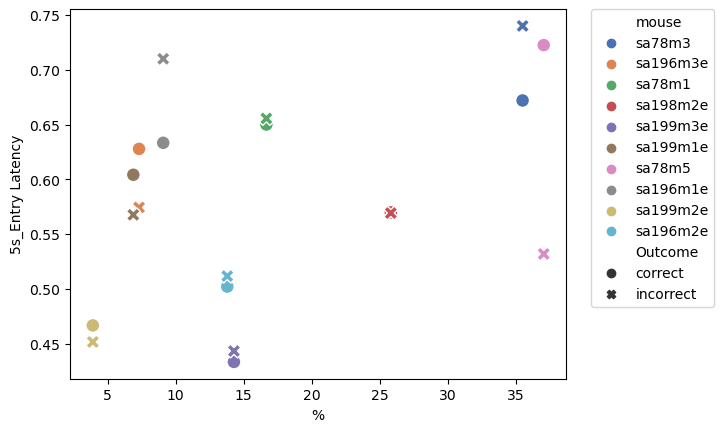

In [307]:
sns.scatterplot(data=mean_entry_latency_5s, x = '%', y = '5s_Entry Latency', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [308]:
lagged_1_new_cur_coeff_5s = get_performance(df_grouped_unscaled_ri, 'New Lagged 1 Cur Coeff', 5)

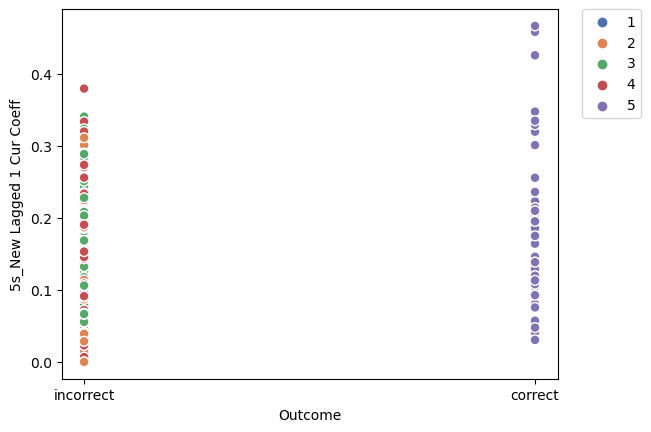

In [309]:
sns.scatterplot(data=lagged_1_new_cur_coeff_5s, x = 'Outcome', y = '5s_New Lagged 1 Cur Coeff', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [310]:
mean_lagged_1_new_cur_coeff_5s = get_mean_performances(lagged_1_new_cur_coeff_5s)

In [311]:
mean_lagged_1_new_cur_coeff_5s

,mouse,5s_New Lagged 1 Cur Coeff,%,Outcome
0,sa78m3,0.208203,35.483871,correct
1,sa78m3,0.143729,35.483871,incorrect
2,sa196m3e,0.077042,7.317073,correct
3,sa196m3e,0.152464,7.317073,incorrect
4,sa78m1,0.198517,16.666667,correct
5,sa78m1,0.178023,16.666667,incorrect
6,sa198m2e,0.161671,25.806452,correct
7,sa198m2e,0.118651,25.806452,incorrect
8,sa199m3e,0.287374,14.285714,correct
9,sa199m3e,0.113761,14.285714,incorrect


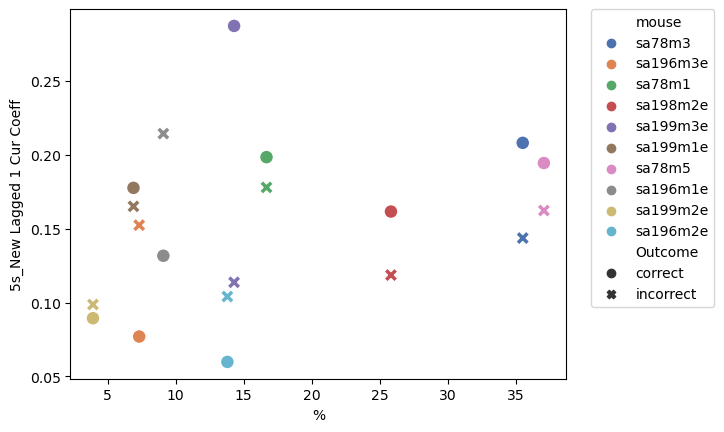

In [312]:
sns.scatterplot(data=mean_lagged_1_new_cur_coeff_5s, x = '%', y = '5s_New Lagged 1 Cur Coeff', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [313]:
middle_duration_5s = get_performance(df_grouped_unscaled_ri, 'Middle Duration', 5)

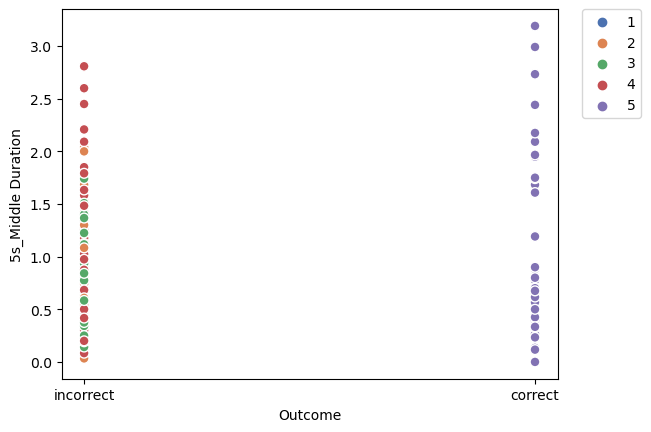

In [314]:
sns.scatterplot(data=middle_duration_5s, x = 'Outcome', y = '5s_Middle Duration', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [315]:
mean_middle_duration_5s = get_mean_performances(middle_duration_5s)

In [316]:
mean_middle_duration_5s

,mouse,5s_Middle Duration,%,Outcome
0,sa78m3,1.219697,35.483871,correct
1,sa78m3,1.227917,35.483871,incorrect
2,sa196m3e,0.886111,7.317073,correct
3,sa196m3e,0.830044,7.317073,incorrect
4,sa78m1,0.991667,16.666667,correct
5,sa78m1,0.607222,16.666667,incorrect
6,sa198m2e,0.582292,25.806452,correct
7,sa198m2e,0.513768,25.806452,incorrect
8,sa199m3e,0.530556,14.285714,correct
9,sa199m3e,0.728935,14.285714,incorrect


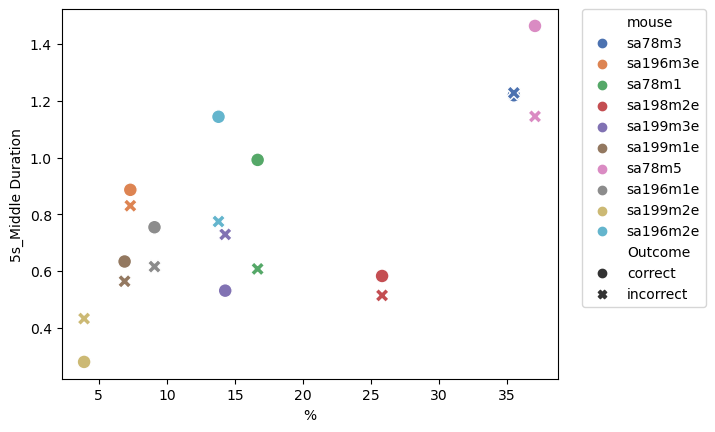

In [317]:
sns.scatterplot(data=mean_middle_duration_5s, x = '%', y = '5s_Middle Duration', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

# Same as above but with scaled data

In [327]:
df_lagged_added_stats_sa199m2e = pd.read_csv('sa199m2e_new_newest_lagged_added_stats.csv')
df_lagged_added_stats_sa196m2e = pd.read_csv('sa196m2e_new_newest_lagged_added_stats.csv')
df_lagged_added_stats_sa196m1e = pd.read_csv('sa196m1e_new_newest_lagged_added_stats.csv')
df_lagged_added_stats_sa198m2e = pd.read_csv('sa198m2e_new_newest_lagged_added_stats.csv')
df_lagged_added_stats_sa196m3e = pd.read_csv('sa196m3e_new_newest_lagged_added_stats.csv')
df_lagged_added_stats_sa199m3e = pd.read_csv('sa199m3e_new_newest_lagged_added_stats.csv')
df_lagged_added_stats_sa199m1e = pd.read_csv('sa199m1e_new_newest_lagged_added_stats.csv')
df_lagged_added_stats_sa78m1 = pd.read_csv('sa78m1_new_newest_lagged_added_stats.csv')
df_lagged_added_stats_sa78m3 = pd.read_csv('sa78m3_new_newest_lagged_added_stats.csv')
df_lagged_added_stats_sa78m5 = pd.read_csv('sa78m5_new_newest_lagged_added_stats.csv')

In [328]:
df_lagged_added_new_class_sa199m2e = set_new_class_individual(df_lagged_added_stats_sa199m2e)
df_lagged_added_new_class_sa196m2e = set_new_class_individual(df_lagged_added_stats_sa196m2e)
df_lagged_added_new_class_sa196m1e = set_new_class_individual(df_lagged_added_stats_sa196m1e)
df_lagged_added_new_class_sa198m2e = set_new_class_individual(df_lagged_added_stats_sa198m2e)
df_lagged_added_new_class_sa196m3e = set_new_class_individual(df_lagged_added_stats_sa196m3e)
df_lagged_added_new_class_sa199m3e = set_new_class_individual(df_lagged_added_stats_sa199m3e)
df_lagged_added_new_class_sa199m1e = set_new_class_individual(df_lagged_added_stats_sa199m1e)
df_lagged_added_new_class_sa78m1 = set_new_class_individual(df_lagged_added_stats_sa78m1)
df_lagged_added_new_class_sa78m3 = set_new_class_individual(df_lagged_added_stats_sa78m3)
df_lagged_added_new_class_sa78m5 = set_new_class_individual(df_lagged_added_stats_sa78m5)

In [329]:
df_lagged_added_new_class_sa199m2e['mouse'] = 'sa199m2e'
df_lagged_added_new_class_sa196m2e['mouse'] = 'sa196m2e'
df_lagged_added_new_class_sa196m1e['mouse'] = 'sa196m1e'
df_lagged_added_new_class_sa198m2e['mouse'] = 'sa198m2e'
df_lagged_added_new_class_sa196m3e['mouse'] = 'sa196m3e'
df_lagged_added_new_class_sa199m3e['mouse'] = 'sa199m3e'
df_lagged_added_new_class_sa199m1e['mouse'] = 'sa199m1e'
df_lagged_added_new_class_sa78m1['mouse'] = 'sa78m1'
df_lagged_added_new_class_sa78m3['mouse'] = 'sa78m3'
df_lagged_added_new_class_sa78m5['mouse'] = 'sa78m5'

In [331]:
df_grouped_scaled = pd.concat([df_lagged_added_new_class_sa199m2e, df_lagged_added_new_class_sa196m2e, df_lagged_added_new_class_sa196m1e, df_lagged_added_new_class_sa198m2e, df_lagged_added_new_class_sa196m3e,
                                df_lagged_added_new_class_sa199m3e, df_lagged_added_new_class_sa199m1e, df_lagged_added_new_class_sa78m1, df_lagged_added_new_class_sa78m3, df_lagged_added_new_class_sa78m5])

In [332]:
df_grouped_scaled_ri = df_grouped_scaled.reset_index(drop=True)

In [333]:
exitmidentry_duration_3s = get_performance(df_grouped_scaled_ri, 'ExitMidEntry Duration', 3)

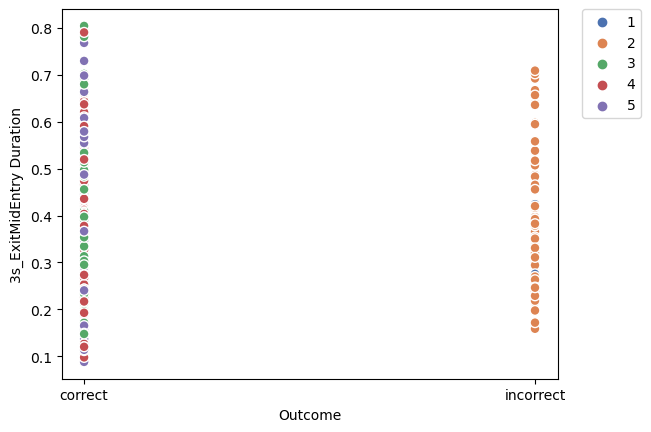

In [334]:
sns.scatterplot(data=exitmidentry_duration_3s, x = 'Outcome', y = '3s_ExitMidEntry Duration', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [335]:
mean_exitmidentry_duration_3s = get_mean_performances(exitmidentry_duration_3s)

In [336]:
mean_exitmidentry_duration_3s

,mouse,3s_ExitMidEntry Duration,%,Outcome
0,sa78m3,0.257659,83.870968,correct
1,sa78m3,0.345272,83.870968,incorrect
2,sa196m3e,0.398060,78.048780,correct
3,sa196m3e,0.403448,78.048780,incorrect
4,sa78m1,0.337559,88.888889,correct
5,sa78m1,0.420991,88.888889,incorrect
6,sa198m2e,0.458290,87.096774,correct
7,sa198m2e,0.443925,87.096774,incorrect
8,sa199m3e,0.322783,61.904762,correct
9,sa199m3e,0.407986,61.904762,incorrect


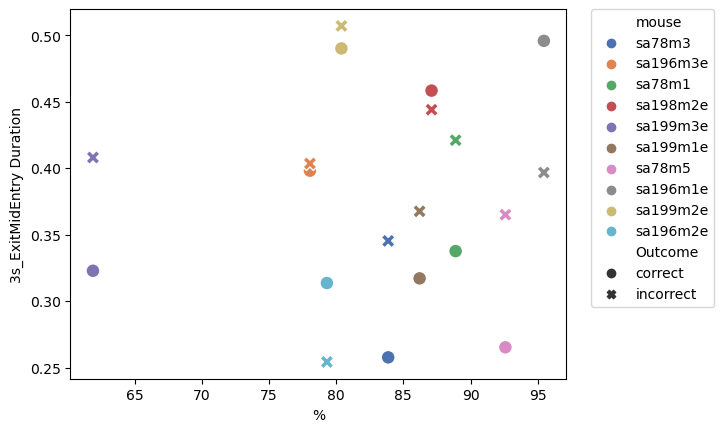

In [337]:
sns.scatterplot(data=mean_exitmidentry_duration_3s, x = '%', y = '3s_ExitMidEntry Duration', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [338]:
middle_tortuosity_3s = get_performance(df_grouped_scaled_ri, 'Middle Tortuosity', 3)

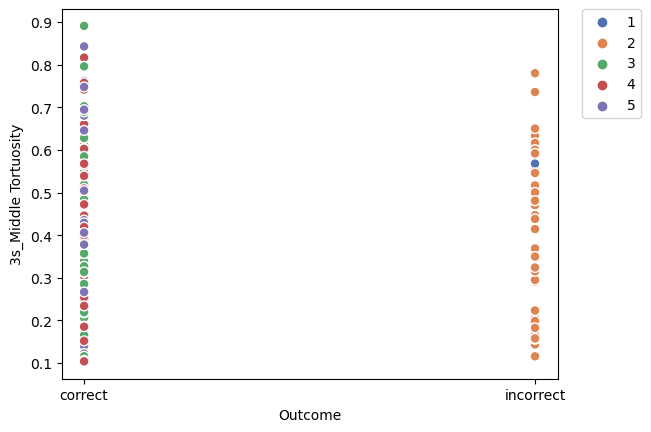

In [339]:
sns.scatterplot(data=middle_tortuosity_3s, x = 'Outcome', y = '3s_Middle Tortuosity', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [340]:
mean_middle_tortuosity_3s = get_mean_performances(middle_tortuosity_3s)

In [341]:
mean_middle_tortuosity_3s

,mouse,3s_Middle Tortuosity,%,Outcome
0,sa78m3,0.231250,83.870968,correct
1,sa78m3,0.222083,83.870968,incorrect
2,sa196m3e,0.174545,78.048780,correct
3,sa196m3e,0.300998,78.048780,incorrect
4,sa78m1,0.565182,88.888889,correct
5,sa78m1,0.565437,88.888889,incorrect
6,sa198m2e,0.644477,87.096774,correct
7,sa198m2e,0.617505,87.096774,incorrect
8,sa199m3e,0.422557,61.904762,correct
9,sa199m3e,0.416587,61.904762,incorrect


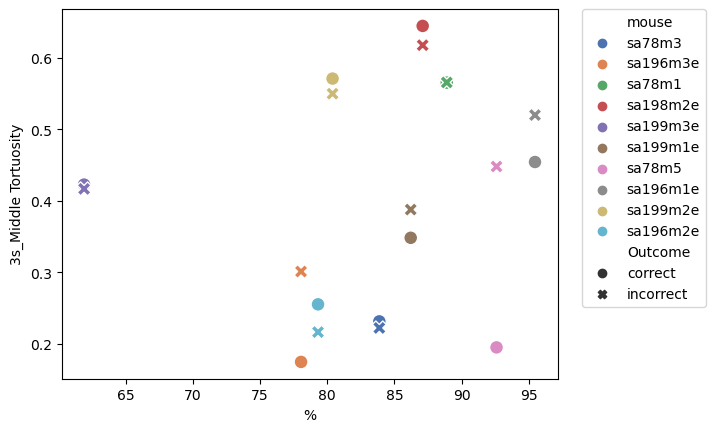

In [342]:
sns.scatterplot(data=mean_middle_tortuosity_3s, x = '%', y = '3s_Middle Tortuosity', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [343]:
new_cur_coeff_time_prop_3s = get_performance(df_grouped_scaled_ri, 'New Current Coeff Time Proportional', 3)

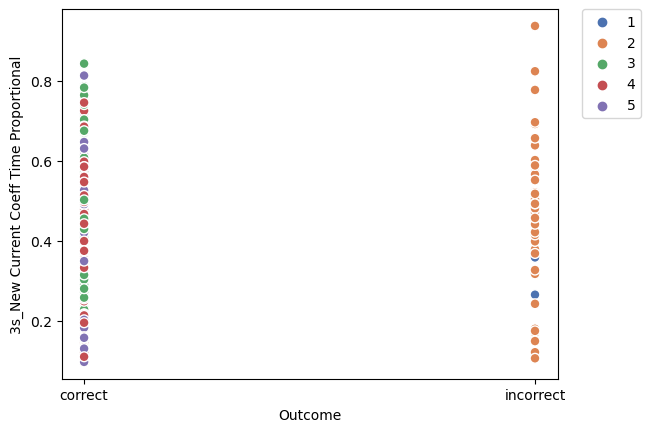

In [345]:
sns.scatterplot(data=new_cur_coeff_time_prop_3s, x = 'Outcome', y = '3s_New Current Coeff Time Proportional', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [346]:
mean_new_cur_coeff_time_prop_3s = get_mean_performances(new_cur_coeff_time_prop_3s)

In [347]:
mean_new_cur_coeff_time_prop_3s

,mouse,3s_New Current Coeff Time Proportional,%,Outcome
0,sa78m3,0.351318,83.870968,correct
1,sa78m3,0.531340,83.870968,incorrect
2,sa196m3e,0.465501,78.048780,correct
3,sa196m3e,0.432447,78.048780,incorrect
4,sa78m1,0.299429,88.888889,correct
5,sa78m1,0.399070,88.888889,incorrect
6,sa198m2e,0.461182,87.096774,correct
7,sa198m2e,0.497908,87.096774,incorrect
8,sa199m3e,0.320263,61.904762,correct
9,sa199m3e,0.433774,61.904762,incorrect


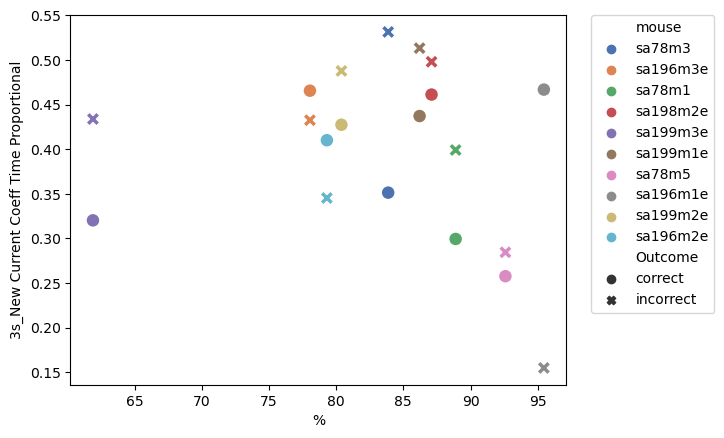

In [348]:
sns.scatterplot(data=mean_new_cur_coeff_time_prop_3s, x = '%', y = '3s_New Current Coeff Time Proportional', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [349]:
new_current_coeff_3s = get_performance(df_grouped_scaled_ri, 'New Current Coeff', 3)

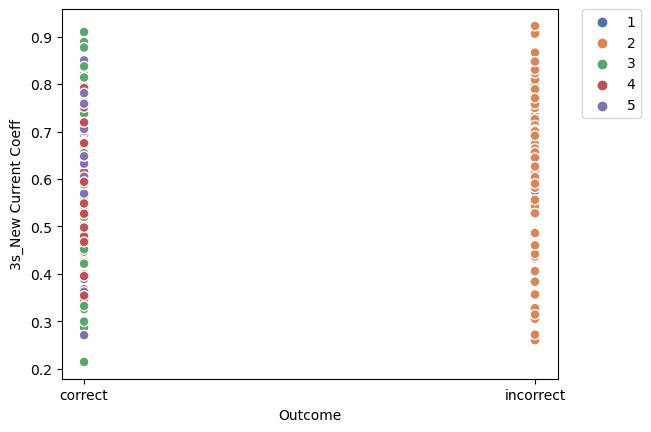

In [350]:
sns.scatterplot(data=new_current_coeff_3s, x = 'Outcome', y = '3s_New Current Coeff', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [351]:
mean_new_current_coeff_3s = get_mean_performances(new_current_coeff_3s)

In [352]:
mean_new_current_coeff_3s

,mouse,3s_New Current Coeff,%,Outcome
0,sa78m3,0.586306,83.870968,correct
1,sa78m3,0.637897,83.870968,incorrect
2,sa196m3e,0.612971,78.048780,correct
3,sa196m3e,0.554364,78.048780,incorrect
4,sa78m1,0.551766,88.888889,correct
5,sa78m1,0.707773,88.888889,incorrect
6,sa198m2e,0.676459,87.096774,correct
7,sa198m2e,0.725449,87.096774,incorrect
8,sa199m3e,0.539982,61.904762,correct
9,sa199m3e,0.620569,61.904762,incorrect


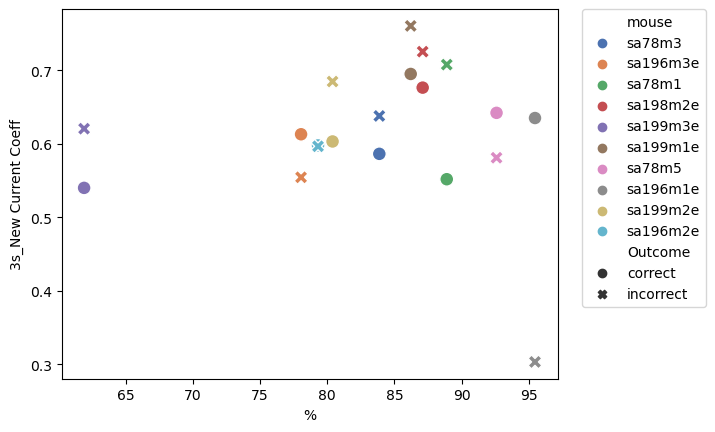

In [353]:
sns.scatterplot(data=mean_new_current_coeff_3s, x = '%', y = '3s_New Current Coeff', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [354]:
current_coeff_3s = get_performance(df_grouped_scaled_ri, 'Current Coeff', 3)

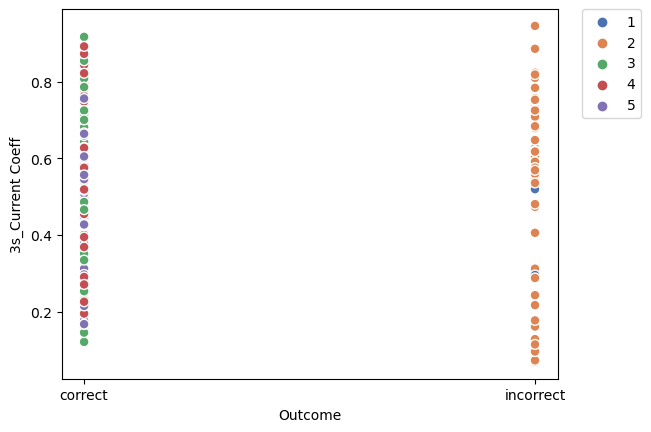

In [355]:
sns.scatterplot(data=current_coeff_3s, x = 'Outcome', y = '3s_Current Coeff', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [356]:
mean_current_coeff_3s = get_mean_performances(current_coeff_3s)

In [357]:
mean_current_coeff_3s

,mouse,3s_Current Coeff,%,Outcome
0,sa78m3,0.457461,83.870968,correct
1,sa78m3,0.606642,83.870968,incorrect
2,sa196m3e,0.525899,78.048780,correct
3,sa196m3e,0.442956,78.048780,incorrect
4,sa78m1,0.449753,88.888889,correct
5,sa78m1,0.679558,88.888889,incorrect
6,sa198m2e,0.572089,87.096774,correct
7,sa198m2e,0.641587,87.096774,incorrect
8,sa199m3e,0.397635,61.904762,correct
9,sa199m3e,0.559214,61.904762,incorrect


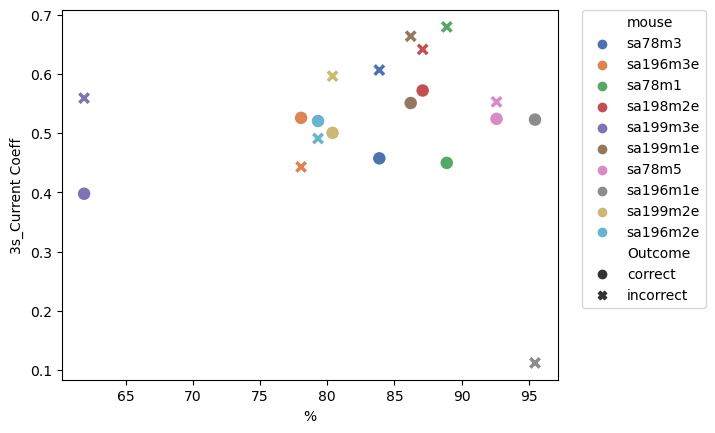

In [358]:
sns.scatterplot(data=mean_current_coeff_3s, x = '%', y = '3s_Current Coeff', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [359]:
cur_coeff_time_prop_3s = get_performance(df_grouped_scaled_ri, 'Current Coeff Time Proportional', 3)

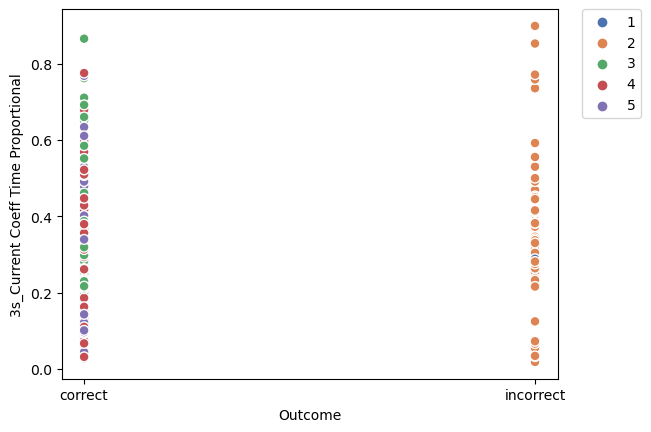

In [360]:
sns.scatterplot(data=cur_coeff_time_prop_3s, x = 'Outcome', y = '3s_Current Coeff Time Proportional', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [361]:
mean_cur_coeff_time_prop_3s = get_mean_performances(cur_coeff_time_prop_3s)

In [362]:
mean_cur_coeff_time_prop_3s

,mouse,3s_Current Coeff Time Proportional,%,Outcome
0,sa78m3,0.234482,83.870968,correct
1,sa78m3,0.365828,83.870968,incorrect
2,sa196m3e,0.382107,78.048780,correct
3,sa196m3e,0.353722,78.048780,incorrect
4,sa78m1,0.207085,88.888889,correct
5,sa78m1,0.253975,88.888889,incorrect
6,sa198m2e,0.322882,87.096774,correct
7,sa198m2e,0.395673,87.096774,incorrect
8,sa199m3e,0.220630,61.904762,correct
9,sa199m3e,0.342620,61.904762,incorrect


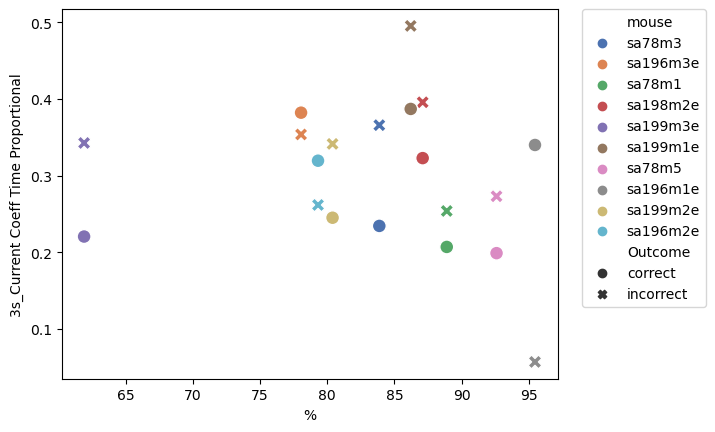

In [363]:
sns.scatterplot(data=mean_cur_coeff_time_prop_3s, x = '%', y = '3s_Current Coeff Time Proportional', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [364]:
lagged_1_duration_3s = get_performance(df_grouped_scaled_ri, 'lagged_1_duration', 3)

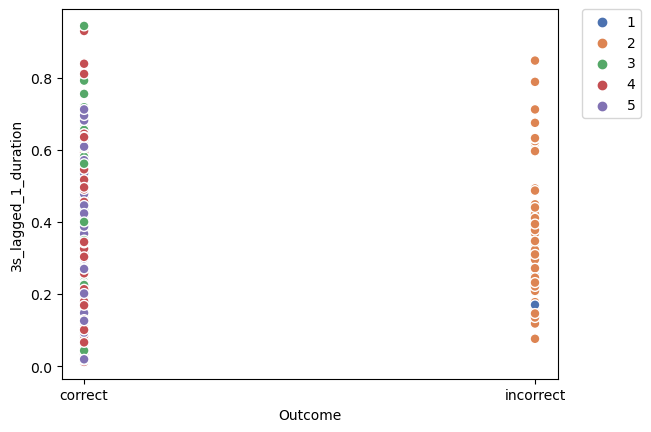

In [365]:
sns.scatterplot(data=lagged_1_duration_3s, x = 'Outcome', y = '3s_lagged_1_duration', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [366]:
mean_lagged_1_duration_3s = get_mean_performances(lagged_1_duration_3s)

In [367]:
mean_lagged_1_duration_3s
mean_lagged_1_duration_3s.to_csv('mean_arm_dur_past_2.csv', sep='\t', index=False)


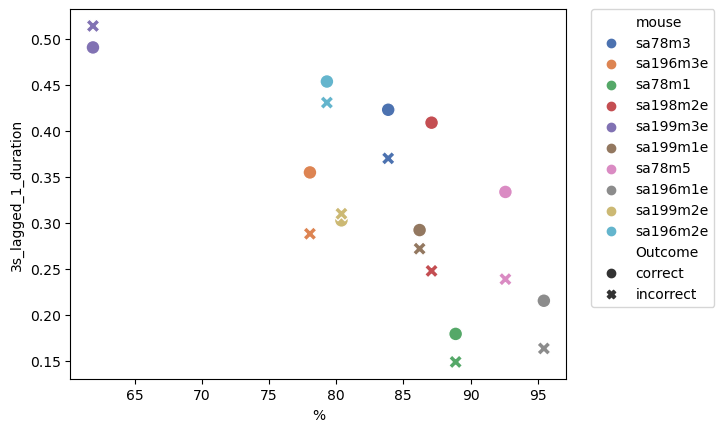

In [368]:
sns.scatterplot(data=mean_lagged_1_duration_3s, x = '%', y = '3s_lagged_1_duration', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [369]:
lagged_1_nose_time_to_max_dist_3s = get_performance(df_grouped_scaled_ri, 'lagged_1_nose_time_to_max_dist', 3)

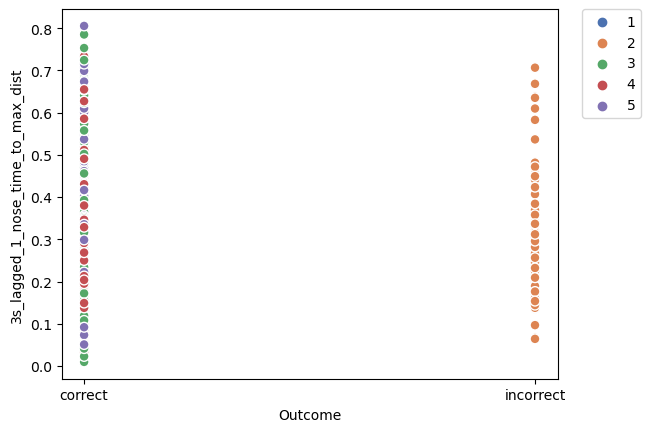

In [370]:
sns.scatterplot(data=lagged_1_nose_time_to_max_dist_3s, x = 'Outcome', y = '3s_lagged_1_nose_time_to_max_dist', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [371]:
mean_lagged_1_nose_time_to_max_dist_3s = get_mean_performances(lagged_1_nose_time_to_max_dist_3s)

In [372]:
mean_lagged_1_nose_time_to_max_dist_3s

mean_lagged_1_nose_time_to_max_dist_3s.to_csv('mean_time_to_max_past_2.csv', sep='\t', index=False)

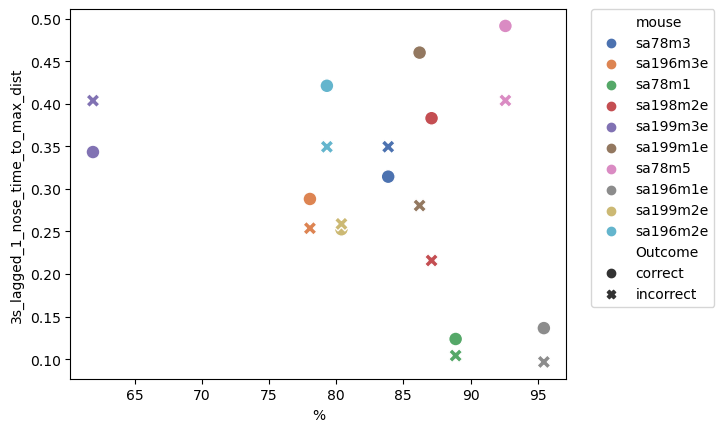

In [373]:
sns.scatterplot(data=mean_lagged_1_nose_time_to_max_dist_3s, x = '%', y = '3s_lagged_1_nose_time_to_max_dist', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [374]:
lagged_1_arm_nose_mov_3s = get_performance(df_grouped_scaled_ri, 'lagged_1_arm_nose_mov', 3)

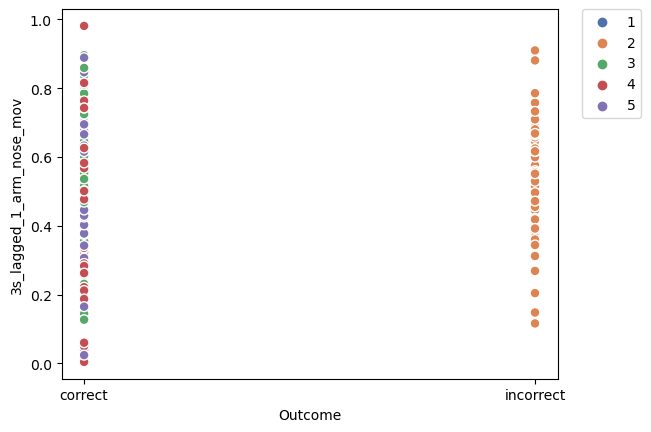

In [375]:
sns.scatterplot(data=lagged_1_arm_nose_mov_3s, x = 'Outcome', y = '3s_lagged_1_arm_nose_mov', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [376]:
mean_lagged_1_arm_nose_mov_3s = get_mean_performances(lagged_1_arm_nose_mov_3s)

In [377]:
mean_lagged_1_arm_nose_mov_3s

mean_lagged_1_arm_nose_mov_3s.to_csv('dist_in_arm_past_2_nose.csv', sep='\t', index=False)

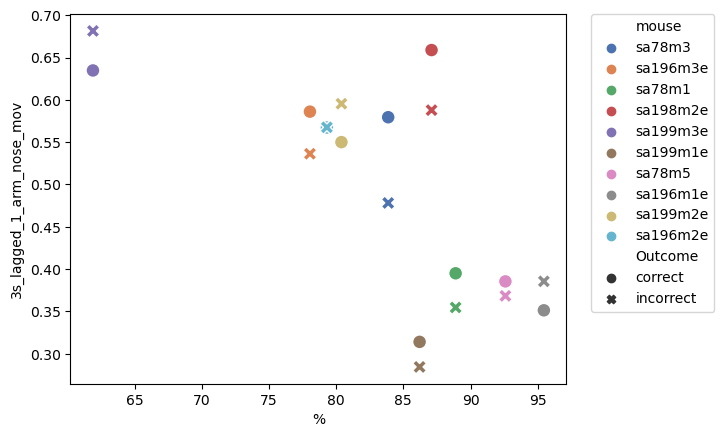

In [378]:
sns.scatterplot(data=mean_lagged_1_arm_nose_mov_3s, x = '%', y = '3s_lagged_1_arm_nose_mov', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [379]:
lagged_1_arm_nose_vel_3s = get_performance(df_grouped_scaled_ri, 'lagged_1_arm_nose_vel', 3)

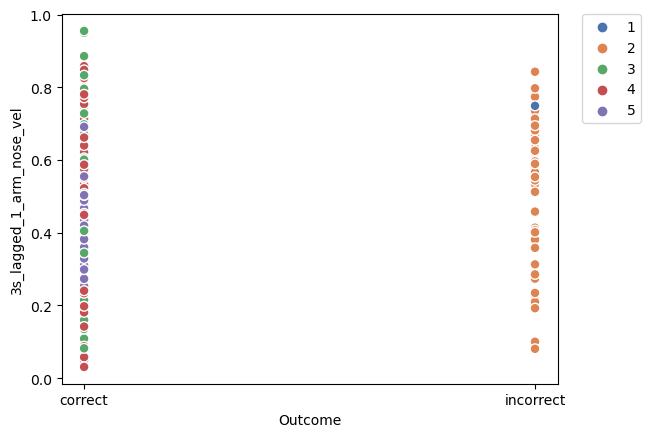

In [380]:
sns.scatterplot(data=lagged_1_arm_nose_vel_3s, x = 'Outcome', y = '3s_lagged_1_arm_nose_vel', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [381]:
mean_lagged_1_arm_nose_vel_3s = get_mean_performances(lagged_1_arm_nose_vel_3s)

In [382]:
mean_lagged_1_arm_nose_vel_3s
mean_lagged_1_arm_nose_vel_3s.to_csv('mean_vel_past_2_nose.csv', sep='\t', index=False)

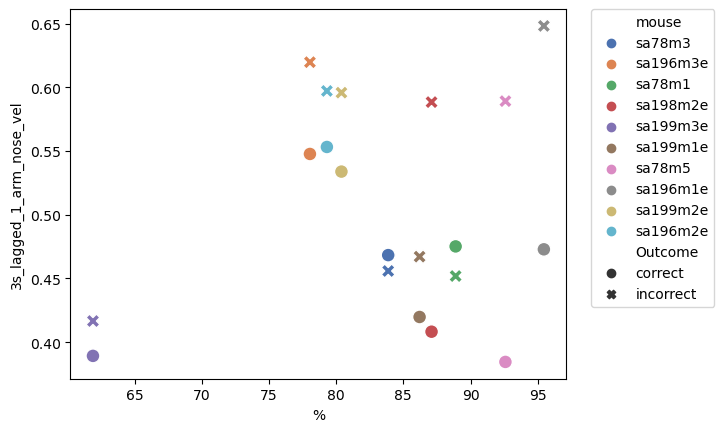

In [383]:
sns.scatterplot(data=mean_lagged_1_arm_nose_vel_3s, x = '%', y = '3s_lagged_1_arm_nose_vel', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [384]:
lagged_1_arm_tail_mov_3s = get_performance(df_grouped_scaled_ri, 'lagged_1_arm_tail_mov', 3)

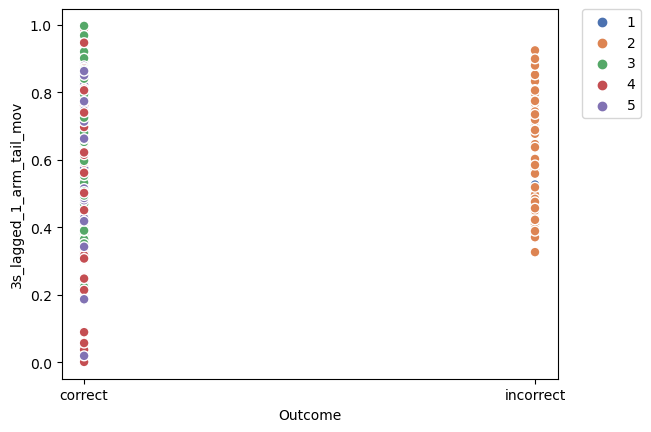

In [385]:
sns.scatterplot(data=lagged_1_arm_tail_mov_3s, x = 'Outcome', y = '3s_lagged_1_arm_tail_mov', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [386]:
mean_lagged_1_arm_tail_mov_3s = get_mean_performances(lagged_1_arm_tail_mov_3s)

In [387]:
mean_lagged_1_arm_tail_mov_3s
mean_lagged_1_arm_tail_mov_3s.to_csv('dist_in_arm_past_2_tail.csv', sep='\t', index=False)

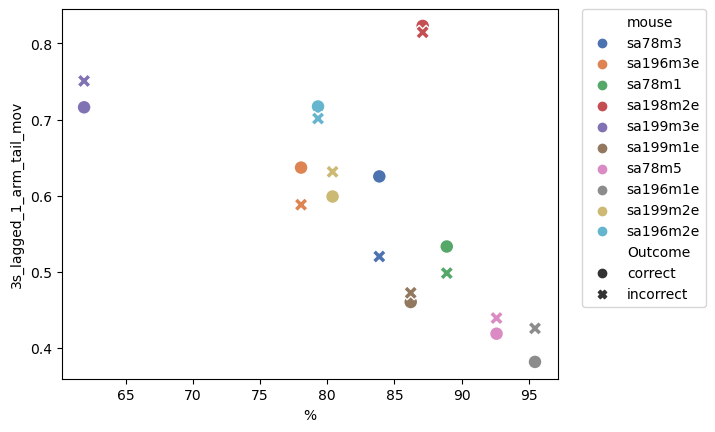

In [388]:
sns.scatterplot(data=mean_lagged_1_arm_tail_mov_3s, x = '%', y = '3s_lagged_1_arm_tail_mov', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [389]:
lagged_1_arm_tail_vel_3s = get_performance(df_grouped_scaled_ri, 'lagged_1_arm_tail_vel', 3)

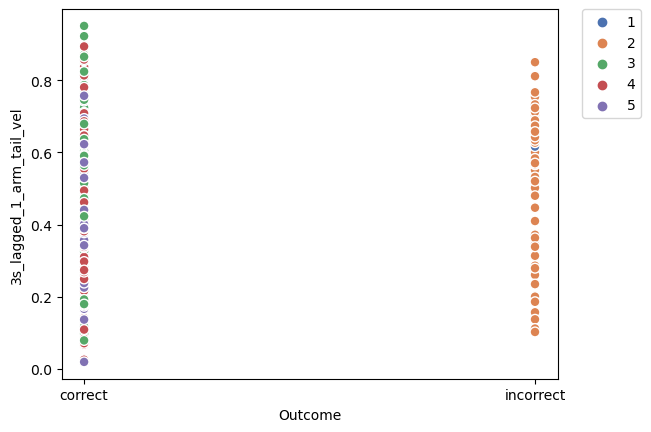

In [390]:
sns.scatterplot(data=lagged_1_arm_tail_vel_3s, x = 'Outcome', y = '3s_lagged_1_arm_tail_vel', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [391]:
mean_lagged_1_arm_tail_vel_3s = get_mean_performances(lagged_1_arm_tail_vel_3s)

In [392]:
mean_lagged_1_arm_tail_vel_3s
mean_lagged_1_arm_tail_vel_3s.to_csv('mean_vel_past_2_tail.csv', sep='\t', index=False)

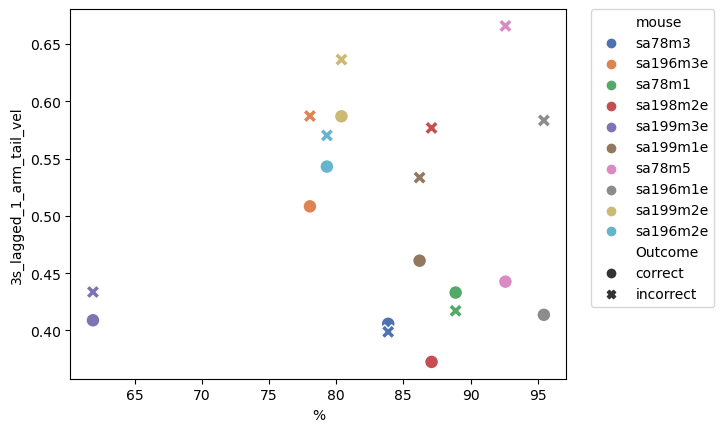

In [393]:
sns.scatterplot(data=mean_lagged_1_arm_tail_vel_3s, x = '%', y = '3s_lagged_1_arm_tail_vel', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [394]:
lagged_1_entry_tortuosity_3s = get_performance(df_grouped_scaled_ri, 'lagged_1_entry_tortuosity', 3)

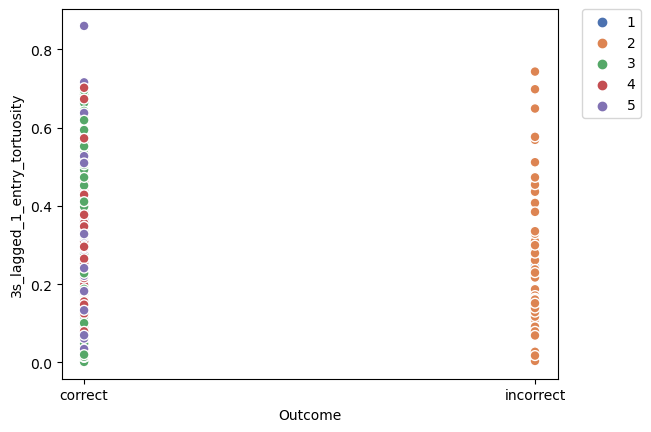

In [395]:
sns.scatterplot(data=lagged_1_entry_tortuosity_3s, x = 'Outcome', y = '3s_lagged_1_entry_tortuosity', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [396]:
mean_lagged_1_entry_tortuosity_3s = get_mean_performances(lagged_1_entry_tortuosity_3s)

In [397]:
mean_lagged_1_entry_tortuosity_3s

,mouse,3s_lagged_1_entry_tortuosity,%,Outcome
0,sa78m3,0.279451,83.870968,correct
1,sa78m3,0.250053,83.870968,incorrect
2,sa196m3e,0.292985,78.048780,correct
3,sa196m3e,0.272488,78.048780,incorrect
4,sa78m1,0.172267,88.888889,correct
5,sa78m1,0.133914,88.888889,incorrect
6,sa198m2e,0.444062,87.096774,correct
7,sa198m2e,0.345901,87.096774,incorrect
8,sa199m3e,0.226048,61.904762,correct
9,sa199m3e,0.314896,61.904762,incorrect


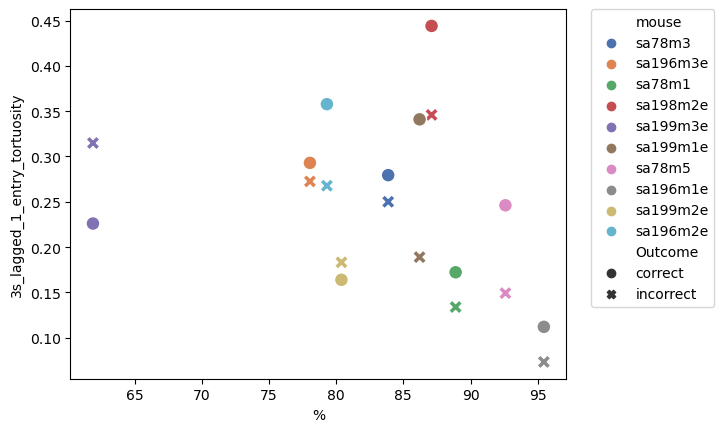

In [398]:
sns.scatterplot(data=mean_lagged_1_entry_tortuosity_3s, x = '%', y = '3s_lagged_1_entry_tortuosity', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [399]:
lagged_1_exit_tortuosity_3s = get_performance(df_grouped_scaled_ri, 'lagged_1_exit_tortuosity', 3)

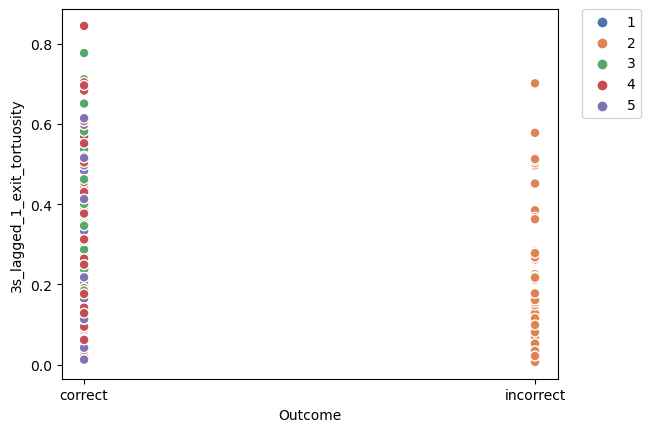

In [400]:
sns.scatterplot(data=lagged_1_exit_tortuosity_3s, x = 'Outcome', y = '3s_lagged_1_exit_tortuosity', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [401]:
mean_lagged_1_exit_tortuosity_3s = get_mean_performances(lagged_1_exit_tortuosity_3s)

In [402]:
mean_lagged_1_exit_tortuosity_3s

mean_lagged_1_exit_tortuosity_3s.to_csv('mean_exit_tortuosity_past_2.csv', sep='\t', index=False)

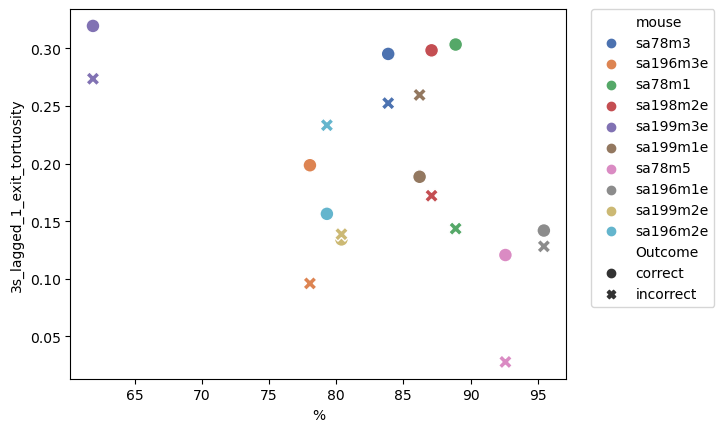

In [403]:
sns.scatterplot(data=mean_lagged_1_exit_tortuosity_3s, x = '%', y = '3s_lagged_1_exit_tortuosity', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [404]:
lagged_1_other_tortuosity_3s = get_performance(df_grouped_scaled_ri, 'lagged_1_other_tortuosity', 3)

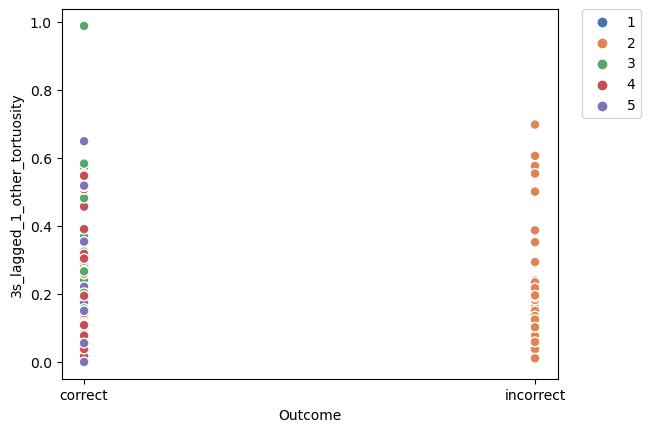

In [405]:
sns.scatterplot(data=lagged_1_other_tortuosity_3s, x = 'Outcome', y = '3s_lagged_1_other_tortuosity', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [406]:
mean_lagged_1_other_tortuosity_3s = get_mean_performances(lagged_1_other_tortuosity_3s)

In [407]:
mean_lagged_1_other_tortuosity_3s


,mouse,3s_lagged_1_other_tortuosity,%,Outcome
0,sa78m3,0.115515,83.870968,correct
1,sa78m3,0.047450,83.870968,incorrect
2,sa196m3e,0.161707,78.048780,correct
3,sa196m3e,0.108094,78.048780,incorrect
4,sa78m1,0.359486,88.888889,correct
5,sa78m1,0.130042,88.888889,incorrect
6,sa198m2e,0.156989,87.096774,correct
7,sa198m2e,0.095385,87.096774,incorrect
8,sa199m3e,0.206448,61.904762,correct
9,sa199m3e,0.208038,61.904762,incorrect


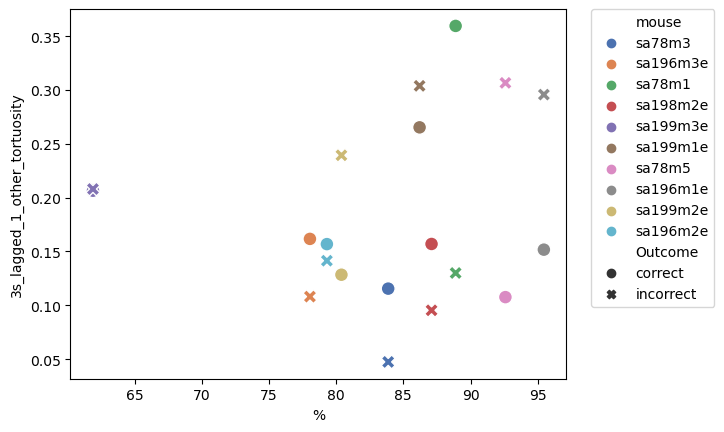

In [408]:
sns.scatterplot(data=mean_lagged_1_other_tortuosity_3s, x = '%', y = '3s_lagged_1_other_tortuosity', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [409]:
entry_latency_3s = get_performance(df_grouped_scaled_ri, 'Entry Latency', 3)

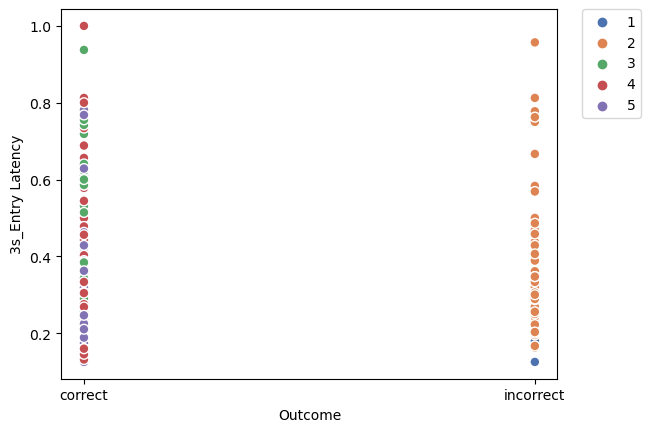

In [410]:
sns.scatterplot(data=entry_latency_3s, x = 'Outcome', y = '3s_Entry Latency', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [411]:
mean_entry_latency_3s = get_mean_performances(entry_latency_3s)

In [412]:
mean_entry_latency_3s

,mouse,3s_Entry Latency,%,Outcome
0,sa78m3,0.242788,83.870968,correct
1,sa78m3,0.420000,83.870968,incorrect
2,sa196m3e,0.275635,78.048780,correct
3,sa196m3e,0.256076,78.048780,incorrect
4,sa78m1,0.527679,88.888889,correct
5,sa78m1,0.692857,88.888889,incorrect
6,sa198m2e,0.538773,87.096774,correct
7,sa198m2e,0.464844,87.096774,incorrect
8,sa199m3e,0.350427,61.904762,correct
9,sa199m3e,0.383681,61.904762,incorrect


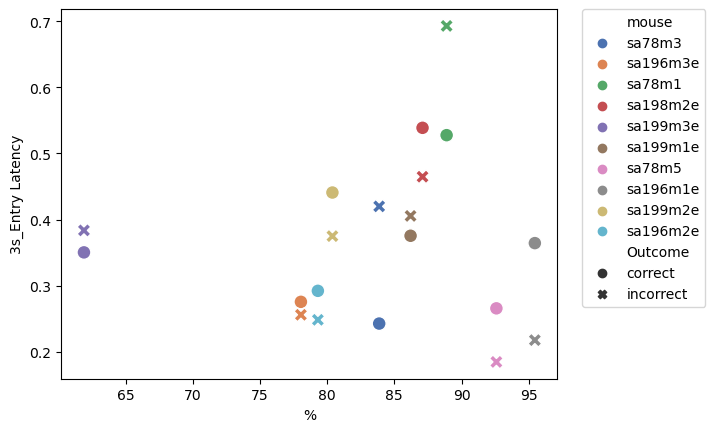

In [413]:
sns.scatterplot(data=mean_entry_latency_3s, x = '%', y = '3s_Entry Latency', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [414]:
lagged_1_new_cur_coeff_3s = get_performance(df_grouped_scaled_ri, 'New Lagged 1 Cur Coeff', 3)

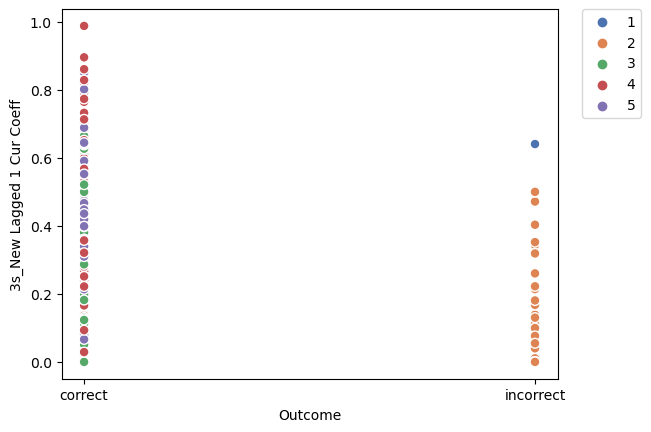

In [415]:
sns.scatterplot(data=lagged_1_new_cur_coeff_3s, x = 'Outcome', y = '3s_New Lagged 1 Cur Coeff', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [416]:
mean_lagged_1_new_cur_coeff_3s = get_mean_performances(lagged_1_new_cur_coeff_3s)

In [417]:
mean_lagged_1_new_cur_coeff_3s

,mouse,3s_New Lagged 1 Cur Coeff,%,Outcome
0,sa78m3,0.377641,83.870968,correct
1,sa78m3,0.026028,83.870968,incorrect
2,sa196m3e,0.194646,78.048780,correct
3,sa196m3e,0.237301,78.048780,incorrect
4,sa78m1,0.348209,88.888889,correct
5,sa78m1,0.157569,88.888889,incorrect
6,sa198m2e,0.280711,87.096774,correct
7,sa198m2e,0.000000,87.096774,incorrect
8,sa199m3e,0.352904,61.904762,correct
9,sa199m3e,0.054175,61.904762,incorrect


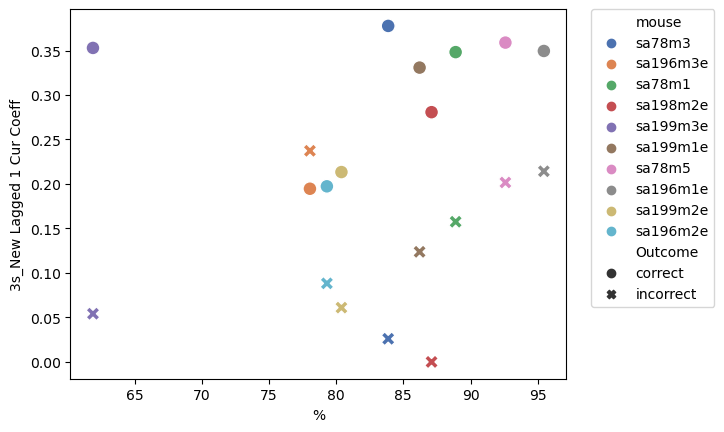

In [418]:
sns.scatterplot(data=mean_lagged_1_new_cur_coeff_3s, x = '%', y = '3s_New Lagged 1 Cur Coeff', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [419]:
middle_duration_3s = get_performance(df_grouped_scaled_ri, 'Middle Duration', 3)

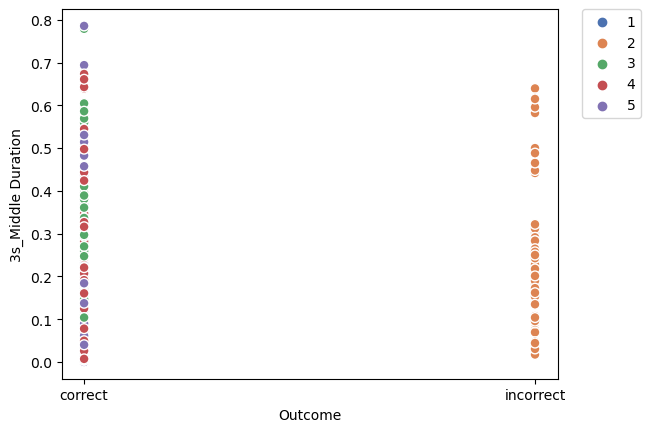

In [420]:
sns.scatterplot(data=middle_duration_3s, x = 'Outcome', y = '3s_Middle Duration', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [421]:
mean_middle_duration_3s = get_mean_performances(middle_duration_3s)

In [422]:
mean_middle_duration_3s

,mouse,3s_Middle Duration,%,Outcome
0,sa78m3,0.186652,83.870968,correct
1,sa78m3,0.195588,83.870968,incorrect
2,sa196m3e,0.251238,78.048780,correct
3,sa196m3e,0.226073,78.048780,incorrect
4,sa78m1,0.118924,88.888889,correct
5,sa78m1,0.165278,88.888889,incorrect
6,sa198m2e,0.233831,87.096774,correct
7,sa198m2e,0.264925,87.096774,incorrect
8,sa199m3e,0.146990,61.904762,correct
9,sa199m3e,0.245924,61.904762,incorrect


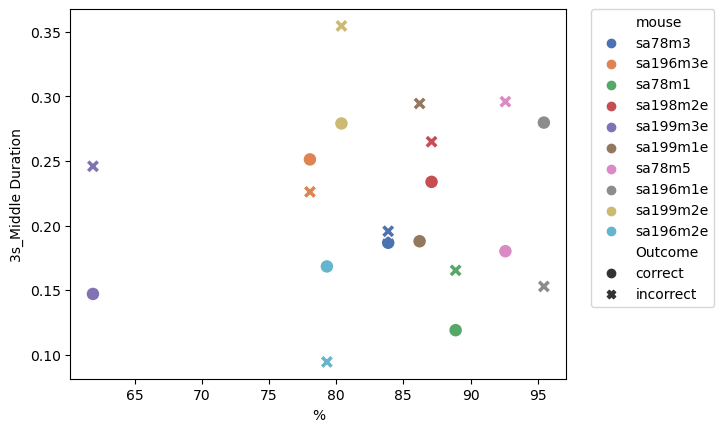

In [423]:
sns.scatterplot(data=mean_middle_duration_3s, x = '%', y = '3s_Middle Duration', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [424]:
lagged_1_duration_4s = get_performance(df_grouped_scaled_ri, 'lagged_1_duration', 4)

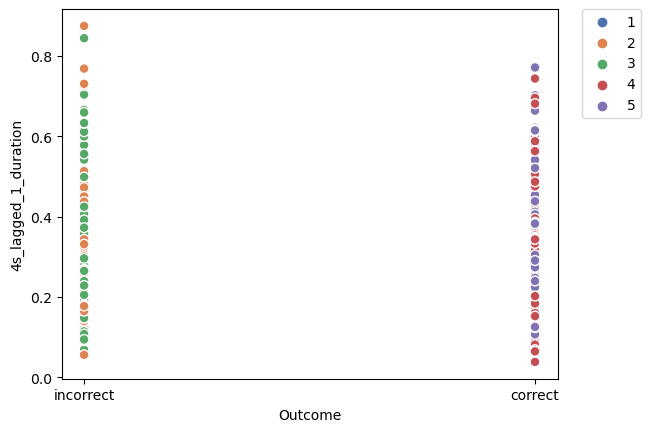

In [425]:
sns.scatterplot(data=lagged_1_duration_4s, x = 'Outcome', y = '4s_lagged_1_duration', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [426]:
mean_lagged_1_duration_4s = get_mean_performances(lagged_1_duration_4s)

In [427]:
mean_lagged_1_duration_4s

,mouse,4s_lagged_1_duration,%,Outcome
0,sa78m3,0.429263,61.290323,correct
1,sa78m3,0.365444,61.290323,incorrect
2,sa196m3e,0.366920,34.146341,correct
3,sa196m3e,0.326624,34.146341,incorrect
4,sa78m1,0.182514,55.555556,correct
5,sa78m1,0.160377,55.555556,incorrect
6,sa198m2e,0.376613,58.064516,correct
7,sa198m2e,0.389472,58.064516,incorrect
8,sa199m3e,0.500000,33.333333,correct
9,sa199m3e,0.497245,33.333333,incorrect


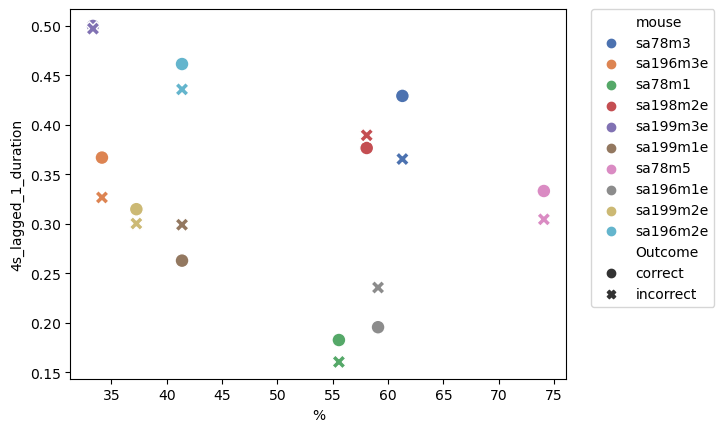

In [428]:
sns.scatterplot(data=mean_lagged_1_duration_4s, x = '%', y = '4s_lagged_1_duration', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [429]:
lagged_1_duration_5s = get_performance(df_grouped_scaled_ri, 'lagged_1_duration', 5)

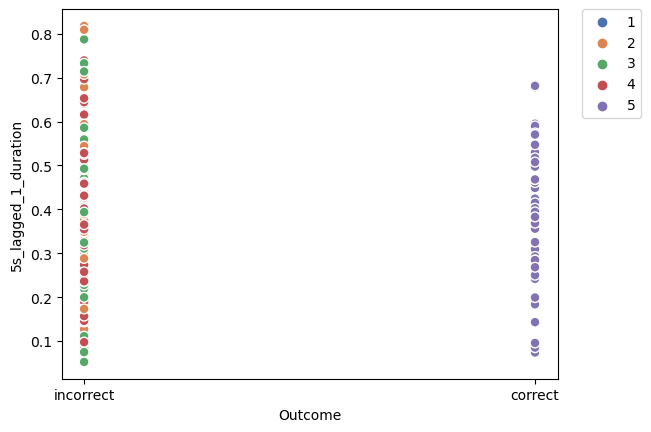

In [430]:
sns.scatterplot(data=lagged_1_duration_5s, x = 'Outcome', y = '5s_lagged_1_duration', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [431]:
mean_lagged_1_duration_5s = get_mean_performances(lagged_1_duration_5s)

In [432]:
mean_lagged_1_duration_5s

,mouse,5s_lagged_1_duration,%,Outcome
0,sa78m3,0.450810,35.483871,correct
1,sa78m3,0.373085,35.483871,incorrect
2,sa196m3e,0.448671,7.317073,correct
3,sa196m3e,0.333715,7.317073,incorrect
4,sa78m1,0.084870,16.666667,correct
5,sa78m1,0.189435,16.666667,incorrect
6,sa198m2e,0.376539,25.806452,correct
7,sa198m2e,0.381464,25.806452,incorrect
8,sa199m3e,0.505095,14.285714,correct
9,sa199m3e,0.498666,14.285714,incorrect


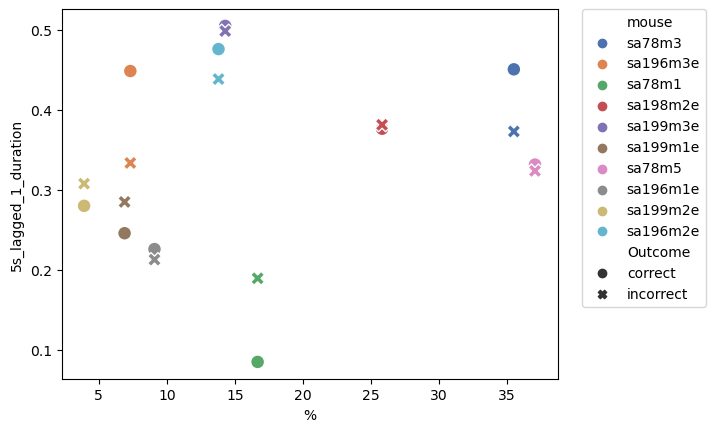

In [433]:
sns.scatterplot(data=mean_lagged_1_duration_5s, x = '%', y = '5s_lagged_1_duration', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [434]:
# 4s

In [435]:
exitmidentry_duration_4s = get_performance(df_grouped_scaled_ri, 'ExitMidEntry Duration', 4)

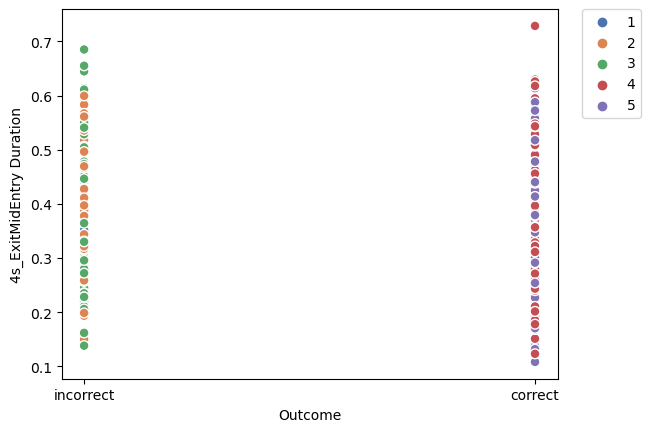

In [436]:
sns.scatterplot(data=exitmidentry_duration_4s, x = 'Outcome', y = '4s_ExitMidEntry Duration', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [437]:
mean_exitmidentry_duration_4s = get_mean_performances(exitmidentry_duration_4s)

In [438]:
mean_exitmidentry_duration_4s

,mouse,4s_ExitMidEntry Duration,%,Outcome
0,sa78m3,0.256925,61.290323,correct
1,sa78m3,0.282474,61.290323,incorrect
2,sa196m3e,0.407061,34.146341,correct
3,sa196m3e,0.396679,34.146341,incorrect
4,sa78m1,0.350157,55.555556,correct
5,sa78m1,0.336478,55.555556,incorrect
6,sa198m2e,0.465213,58.064516,correct
7,sa198m2e,0.451953,58.064516,incorrect
8,sa199m3e,0.332341,33.333333,correct
9,sa199m3e,0.369378,33.333333,incorrect


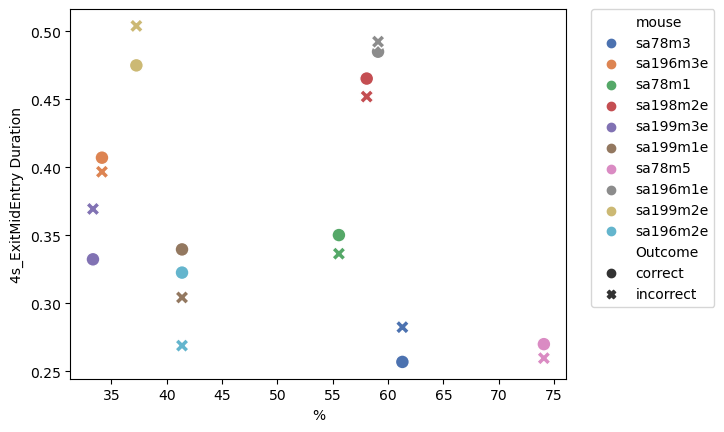

In [439]:
sns.scatterplot(data=mean_exitmidentry_duration_4s, x = '%', y = '4s_ExitMidEntry Duration', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [440]:
middle_tortuosity_4s = get_performance(df_grouped_scaled_ri, 'Middle Tortuosity', 4)

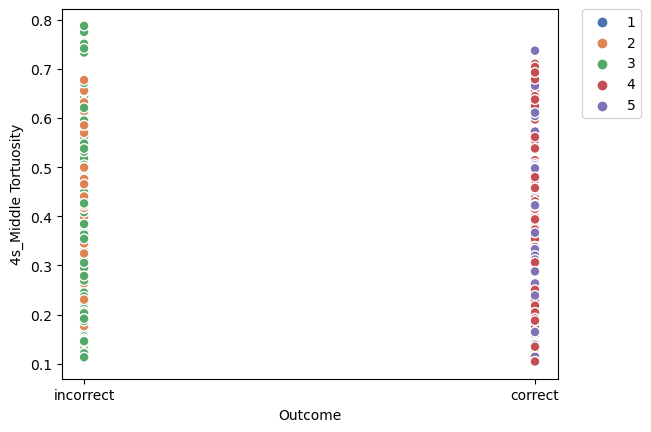

In [441]:
sns.scatterplot(data=middle_tortuosity_4s, x = 'Outcome', y = '4s_Middle Tortuosity', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [442]:
mean_middle_tortuosity_4s = get_mean_performances(middle_tortuosity_4s)

In [443]:
mean_middle_tortuosity_4s

,mouse,4s_Middle Tortuosity,%,Outcome
0,sa78m3,0.235319,61.290323,correct
1,sa78m3,0.213735,61.290323,incorrect
2,sa196m3e,0.174182,34.146341,correct
3,sa196m3e,0.219119,34.146341,incorrect
4,sa78m1,0.560210,55.555556,correct
5,sa78m1,0.568054,55.555556,incorrect
6,sa198m2e,0.658677,58.064516,correct
7,sa198m2e,0.625497,58.064516,incorrect
8,sa199m3e,0.442339,33.333333,correct
9,sa199m3e,0.409899,33.333333,incorrect


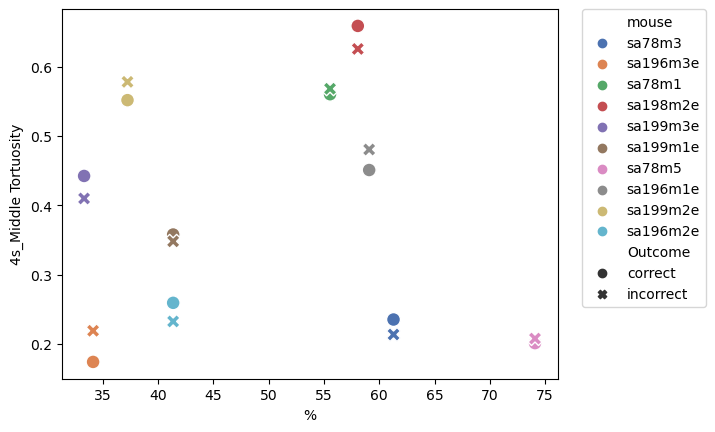

In [444]:
sns.scatterplot(data=mean_middle_tortuosity_4s, x = '%', y = '4s_Middle Tortuosity', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [445]:
new_cur_coeff_time_prop_4s = get_performance(df_grouped_scaled_ri, 'New Current Coeff Time Proportional', 4)

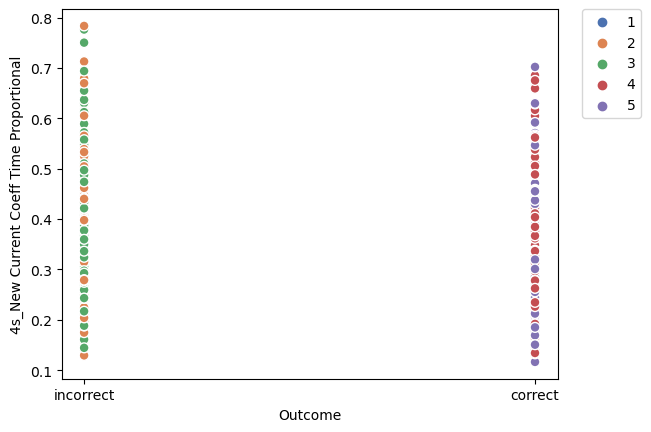

In [446]:
sns.scatterplot(data=new_cur_coeff_time_prop_4s, x = 'Outcome', y = '4s_New Current Coeff Time Proportional', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [447]:
mean_new_cur_coeff_time_prop_4s = get_mean_performances(new_cur_coeff_time_prop_4s)

In [448]:
mean_new_cur_coeff_time_prop_4s

,mouse,4s_New Current Coeff Time Proportional,%,Outcome
0,sa78m3,0.348818,61.290323,correct
1,sa78m3,0.415259,61.290323,incorrect
2,sa196m3e,0.465069,34.146341,correct
3,sa196m3e,0.450152,34.146341,incorrect
4,sa78m1,0.307143,55.555556,correct
5,sa78m1,0.301918,55.555556,incorrect
6,sa198m2e,0.454712,58.064516,correct
7,sa198m2e,0.486475,58.064516,incorrect
8,sa199m3e,0.317303,33.333333,correct
9,sa199m3e,0.390511,33.333333,incorrect


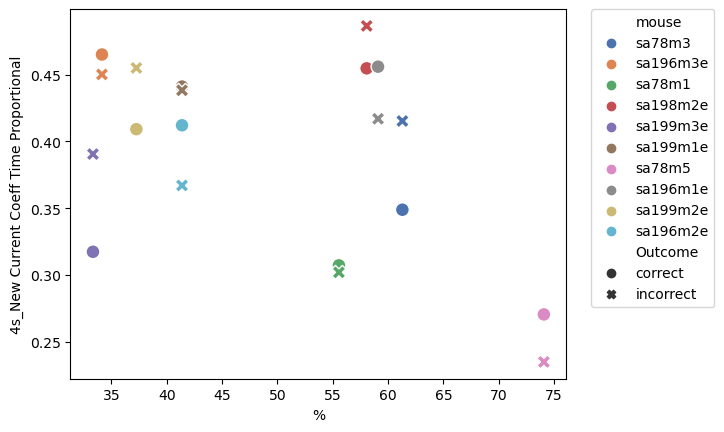

In [449]:
sns.scatterplot(data=mean_new_cur_coeff_time_prop_4s, x = '%', y = '4s_New Current Coeff Time Proportional', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [450]:
new_current_coeff_4s = get_performance(df_grouped_scaled_ri, 'New Current Coeff', 4)

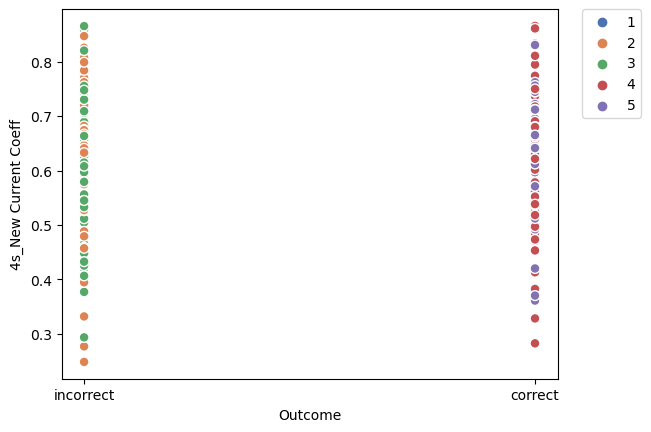

In [451]:
sns.scatterplot(data=new_current_coeff_4s, x = 'Outcome', y = '4s_New Current Coeff', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [452]:
mean_new_current_coeff_4s = get_mean_performances(new_current_coeff_4s)

In [453]:
mean_new_current_coeff_4s

,mouse,4s_New Current Coeff,%,Outcome
0,sa78m3,0.587928,61.290323,correct
1,sa78m3,0.605480,61.290323,incorrect
2,sa196m3e,0.608773,34.146341,correct
3,sa196m3e,0.589827,34.146341,incorrect
4,sa78m1,0.552943,55.555556,correct
5,sa78m1,0.579950,55.555556,incorrect
6,sa198m2e,0.659821,58.064516,correct
7,sa198m2e,0.713468,58.064516,incorrect
8,sa199m3e,0.519848,33.333333,correct
9,sa199m3e,0.598115,33.333333,incorrect


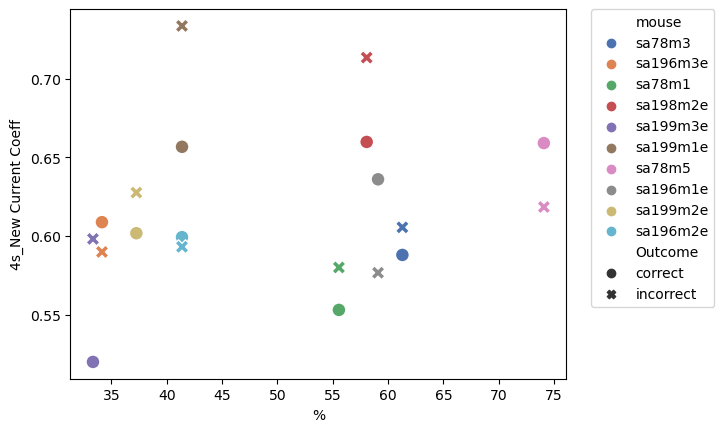

In [454]:
sns.scatterplot(data=mean_new_current_coeff_4s, x = '%', y = '4s_New Current Coeff', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [455]:
current_coeff_4s = get_performance(df_grouped_scaled_ri, 'Current Coeff', 4)

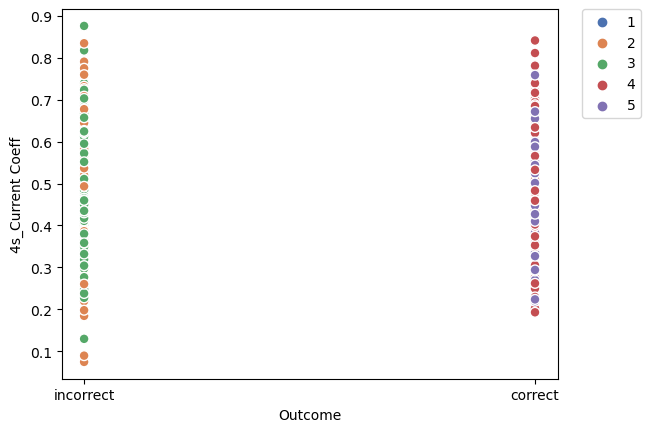

In [456]:
sns.scatterplot(data=current_coeff_4s, x = 'Outcome', y = '4s_Current Coeff', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [457]:
mean_current_coeff_4s = get_mean_performances(current_coeff_4s)

In [458]:
mean_current_coeff_4s

,mouse,4s_Current Coeff,%,Outcome
0,sa78m3,0.443798,61.290323,correct
1,sa78m3,0.528248,61.290323,incorrect
2,sa196m3e,0.532872,34.146341,correct
3,sa196m3e,0.488035,34.146341,incorrect
4,sa78m1,0.447663,55.555556,correct
5,sa78m1,0.501927,55.555556,incorrect
6,sa198m2e,0.546093,58.064516,correct
7,sa198m2e,0.624478,58.064516,incorrect
8,sa199m3e,0.361916,33.333333,correct
9,sa199m3e,0.511217,33.333333,incorrect


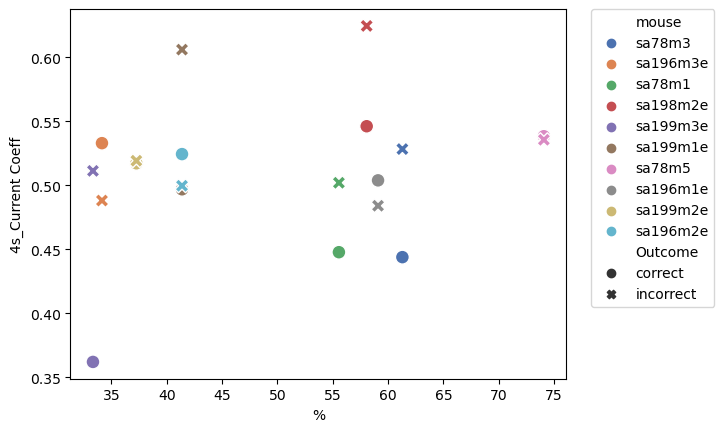

In [459]:
sns.scatterplot(data=mean_current_coeff_4s, x = '%', y = '4s_Current Coeff', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [460]:
cur_coeff_time_prop_4s = get_performance(df_grouped_scaled_ri, 'Current Coeff Time Proportional', 4)

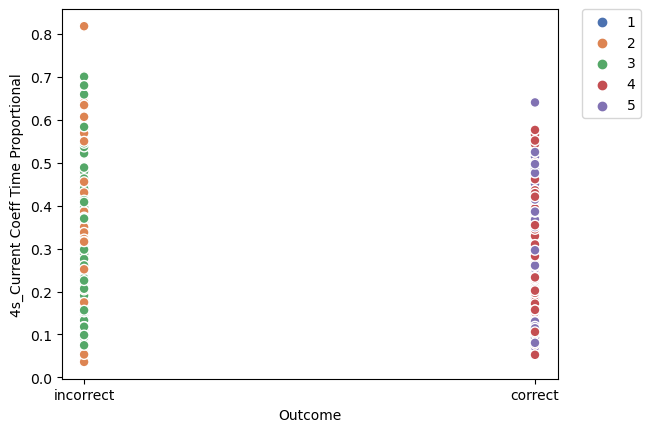

In [461]:
sns.scatterplot(data=cur_coeff_time_prop_4s, x = 'Outcome', y = '4s_Current Coeff Time Proportional', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [462]:
mean_cur_coeff_time_prop_4s = get_mean_performances(cur_coeff_time_prop_4s)

In [463]:
mean_cur_coeff_time_prop_4s

,mouse,4s_Current Coeff Time Proportional,%,Outcome
0,sa78m3,0.228184,61.290323,correct
1,sa78m3,0.283850,61.290323,incorrect
2,sa196m3e,0.373163,34.146341,correct
3,sa196m3e,0.372255,34.146341,incorrect
4,sa78m1,0.210331,55.555556,correct
5,sa78m1,0.196738,55.555556,incorrect
6,sa198m2e,0.317907,58.064516,correct
7,sa198m2e,0.354347,58.064516,incorrect
8,sa199m3e,0.214862,33.333333,correct
9,sa199m3e,0.295066,33.333333,incorrect


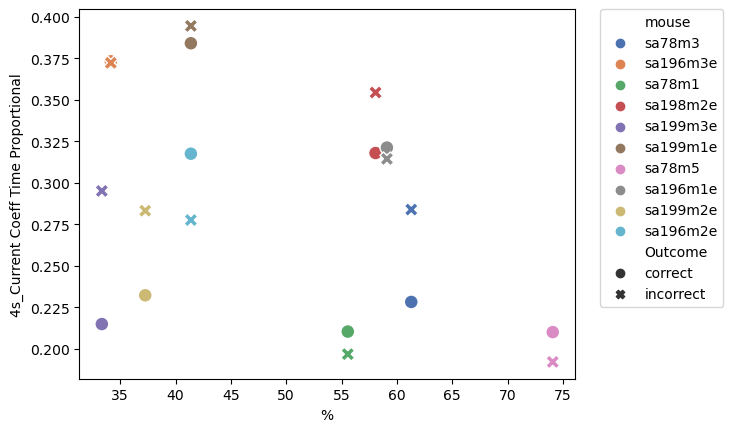

In [464]:
sns.scatterplot(data=mean_cur_coeff_time_prop_4s, x = '%', y = '4s_Current Coeff Time Proportional', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [465]:
lagged_1_duration_4s = get_performance(df_grouped_scaled_ri, 'lagged_1_duration', 4)

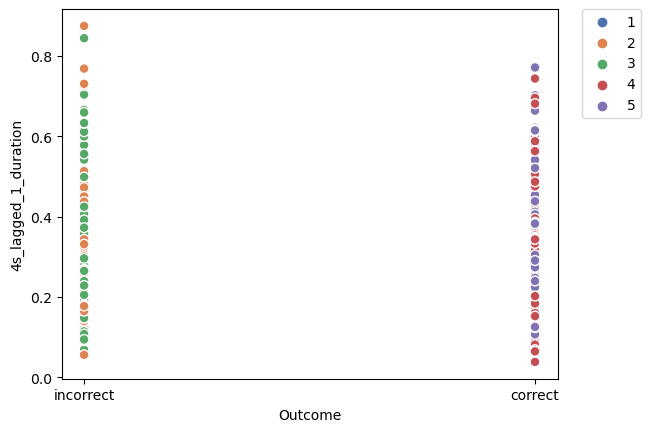

In [466]:
sns.scatterplot(data=lagged_1_duration_4s, x = 'Outcome', y = '4s_lagged_1_duration', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [467]:
mean_lagged_1_duration_4s = get_mean_performances(lagged_1_duration_4s)

In [468]:
mean_lagged_1_duration_4s
mean_lagged_1_duration_4s.to_csv('mean_arm_dur_past_2.csv', sep='\t', index=False)


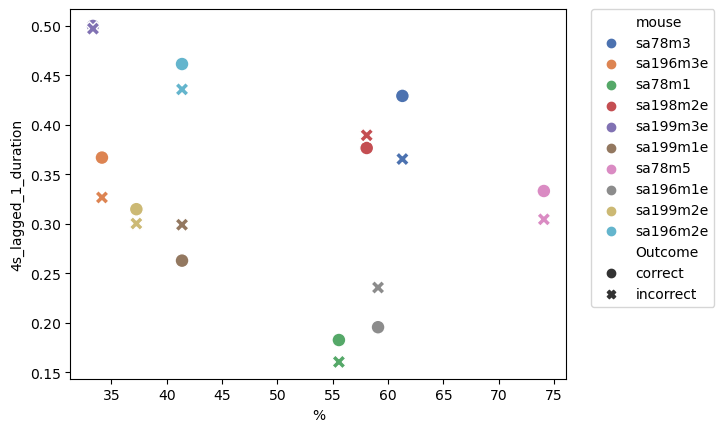

In [469]:
sns.scatterplot(data=mean_lagged_1_duration_4s, x = '%', y = '4s_lagged_1_duration', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [470]:
lagged_1_nose_time_to_max_dist_4s = get_performance(df_grouped_scaled_ri, 'lagged_1_nose_time_to_max_dist', 4)

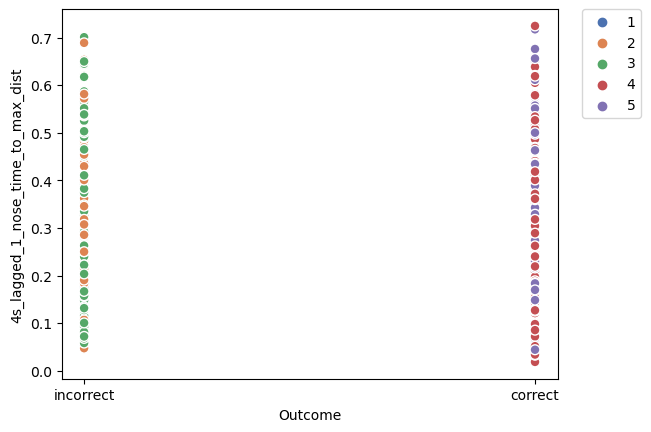

In [471]:
sns.scatterplot(data=lagged_1_nose_time_to_max_dist_4s, x = 'Outcome', y = '4s_lagged_1_nose_time_to_max_dist', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [472]:
mean_lagged_1_nose_time_to_max_dist_4s = get_mean_performances(lagged_1_nose_time_to_max_dist_4s)

In [473]:
mean_lagged_1_nose_time_to_max_dist_4s

mean_lagged_1_nose_time_to_max_dist_4s.to_csv('mean_time_to_max_past_2.csv', sep='\t', index=False)

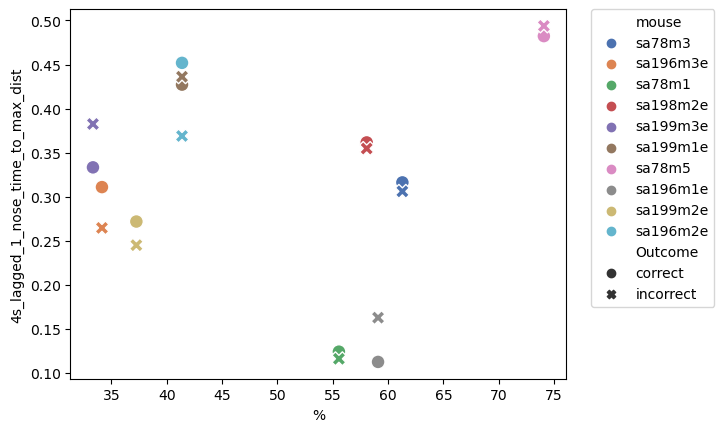

In [474]:
sns.scatterplot(data=mean_lagged_1_nose_time_to_max_dist_4s, x = '%', y = '4s_lagged_1_nose_time_to_max_dist', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [475]:
lagged_1_arm_nose_mov_4s = get_performance(df_grouped_scaled_ri, 'lagged_1_arm_nose_mov', 4)

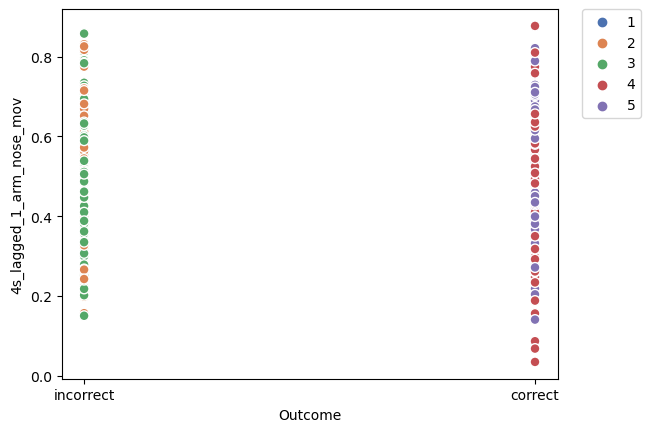

In [476]:
sns.scatterplot(data=lagged_1_arm_nose_mov_4s, x = 'Outcome', y = '4s_lagged_1_arm_nose_mov', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [477]:
mean_lagged_1_arm_nose_mov_4s = get_mean_performances(lagged_1_arm_nose_mov_4s)

In [478]:
mean_lagged_1_arm_nose_mov_4s

mean_lagged_1_arm_nose_mov_4s.to_csv('dist_in_arm_past_2_nose.csv', sep='\t', index=False)

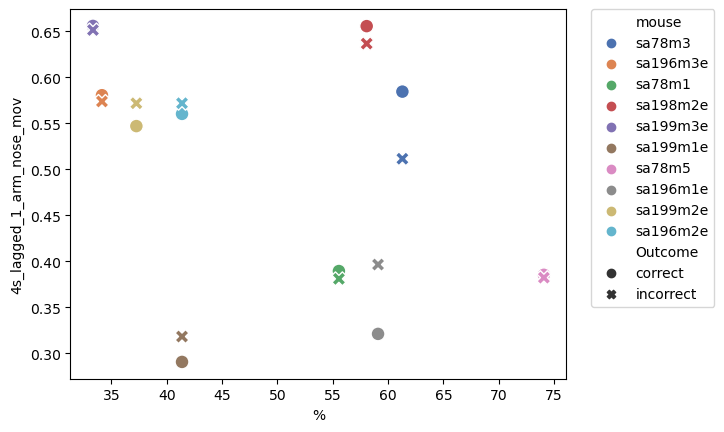

In [479]:
sns.scatterplot(data=mean_lagged_1_arm_nose_mov_4s, x = '%', y = '4s_lagged_1_arm_nose_mov', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [480]:
lagged_1_arm_nose_vel_4s = get_performance(df_grouped_scaled_ri, 'lagged_1_arm_nose_vel', 4)

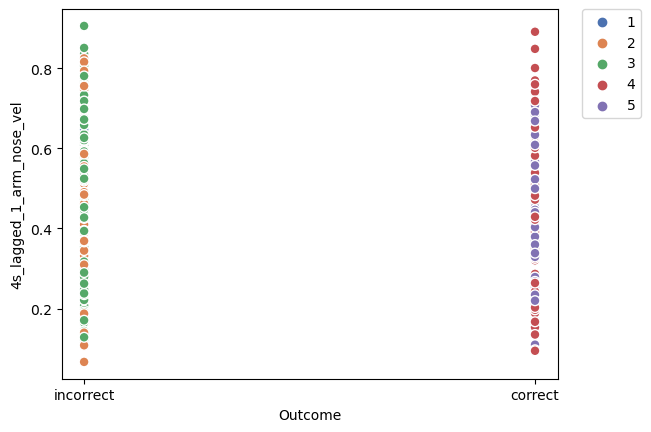

In [481]:
sns.scatterplot(data=lagged_1_arm_nose_vel_4s, x = 'Outcome', y = '4s_lagged_1_arm_nose_vel', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [482]:
mean_lagged_1_arm_nose_vel_4s = get_mean_performances(lagged_1_arm_nose_vel_4s)

In [483]:
mean_lagged_1_arm_nose_vel_4s
mean_lagged_1_arm_nose_vel_4s.to_csv('mean_vel_past_2_nose.csv', sep='\t', index=False)

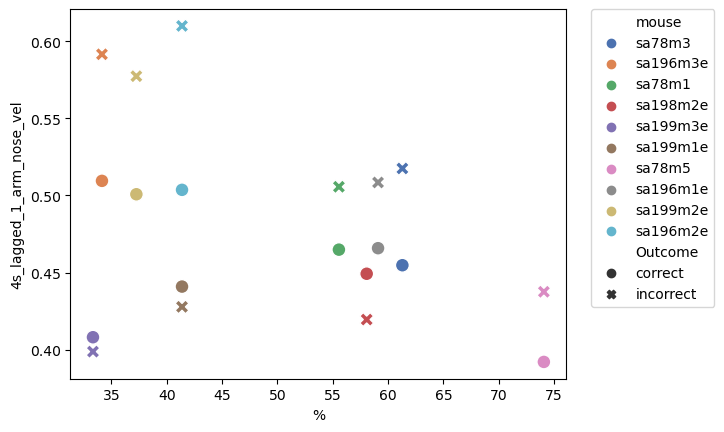

In [484]:
sns.scatterplot(data=mean_lagged_1_arm_nose_vel_4s, x = '%', y = '4s_lagged_1_arm_nose_vel', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [485]:
lagged_1_arm_tail_mov_4s = get_performance(df_grouped_scaled_ri, 'lagged_1_arm_tail_mov', 4)

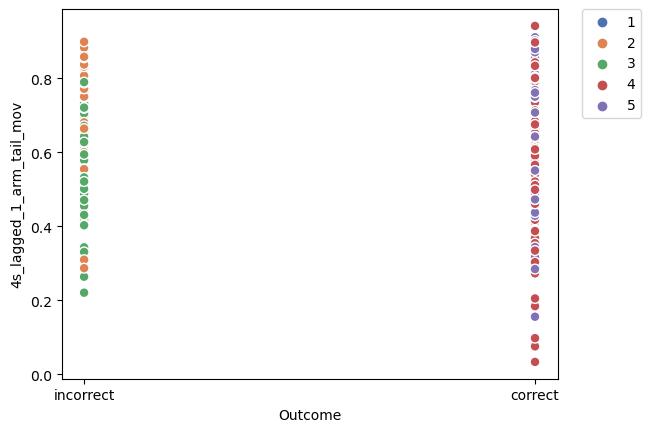

In [486]:
sns.scatterplot(data=lagged_1_arm_tail_mov_4s, x = 'Outcome', y = '4s_lagged_1_arm_tail_mov', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [487]:
mean_lagged_1_arm_tail_mov_4s = get_mean_performances(lagged_1_arm_tail_mov_4s)

In [488]:
mean_lagged_1_arm_tail_mov_4s
mean_lagged_1_arm_tail_mov_4s.to_csv('dist_in_arm_past_2_tail.csv', sep='\t', index=False)

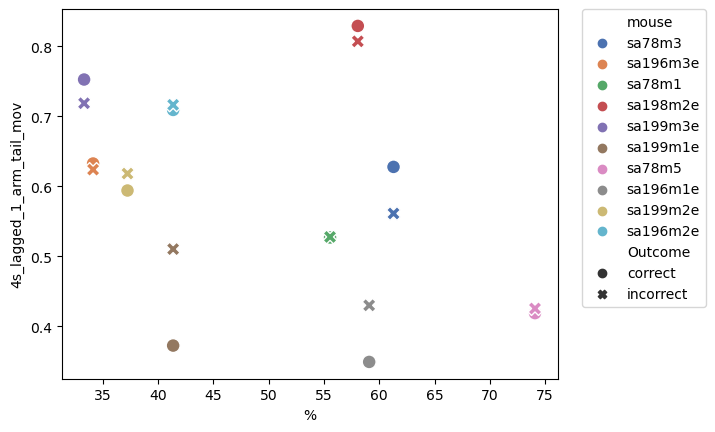

In [489]:
sns.scatterplot(data=mean_lagged_1_arm_tail_mov_4s, x = '%', y = '4s_lagged_1_arm_tail_mov', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [490]:
lagged_1_arm_tail_vel_4s = get_performance(df_grouped_scaled_ri, 'lagged_1_arm_tail_vel', 4)

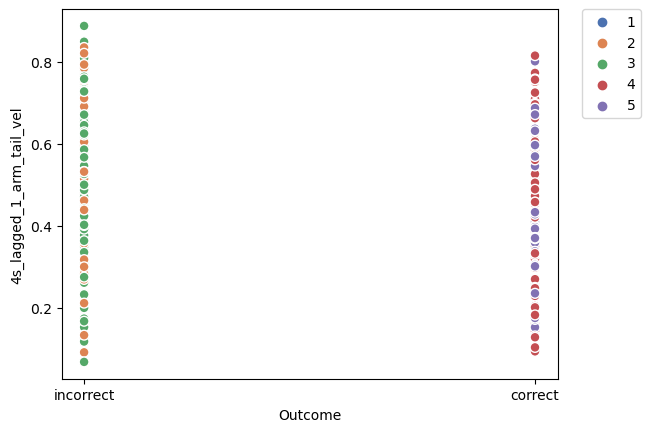

In [491]:
sns.scatterplot(data=lagged_1_arm_tail_vel_4s, x = 'Outcome', y = '4s_lagged_1_arm_tail_vel', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [492]:
mean_lagged_1_arm_tail_vel_4s = get_mean_performances(lagged_1_arm_tail_vel_4s)

In [493]:
mean_lagged_1_arm_tail_vel_4s
mean_lagged_1_arm_tail_vel_4s.to_csv('mean_vel_past_2_tail.csv', sep='\t', index=False)

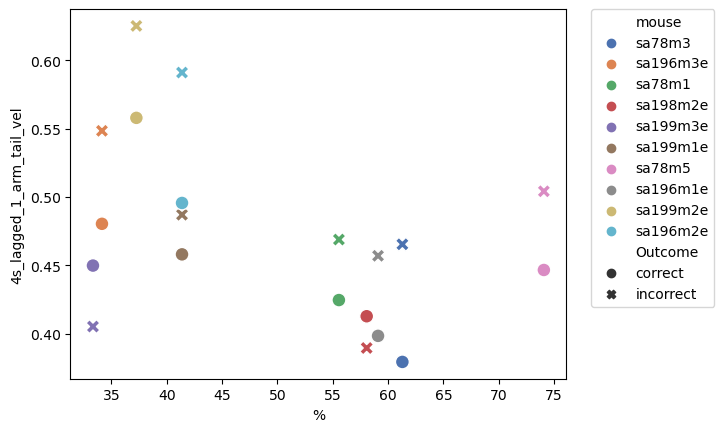

In [494]:
sns.scatterplot(data=mean_lagged_1_arm_tail_vel_4s, x = '%', y = '4s_lagged_1_arm_tail_vel', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [495]:
lagged_1_entry_tortuosity_4s = get_performance(df_grouped_scaled_ri, 'lagged_1_entry_tortuosity', 4)

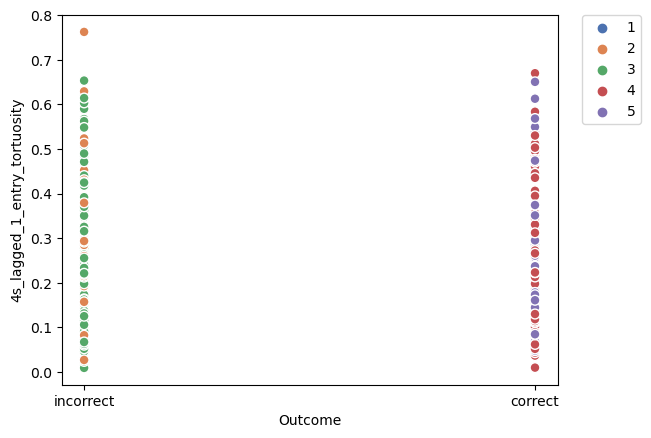

In [496]:
sns.scatterplot(data=lagged_1_entry_tortuosity_4s, x = 'Outcome', y = '4s_lagged_1_entry_tortuosity', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [497]:
mean_lagged_1_entry_tortuosity_4s = get_mean_performances(lagged_1_entry_tortuosity_4s)

In [498]:
mean_lagged_1_entry_tortuosity_4s

,mouse,4s_lagged_1_entry_tortuosity,%,Outcome
0,sa78m3,0.286789,61.290323,correct
1,sa78m3,0.234502,61.290323,incorrect
2,sa196m3e,0.331250,34.146341,correct
3,sa196m3e,0.264002,34.146341,incorrect
4,sa78m1,0.169299,55.555556,correct
5,sa78m1,0.162572,55.555556,incorrect
6,sa198m2e,0.430007,58.064516,correct
7,sa198m2e,0.431256,58.064516,incorrect
8,sa199m3e,0.190895,33.333333,correct
9,sa199m3e,0.294155,33.333333,incorrect


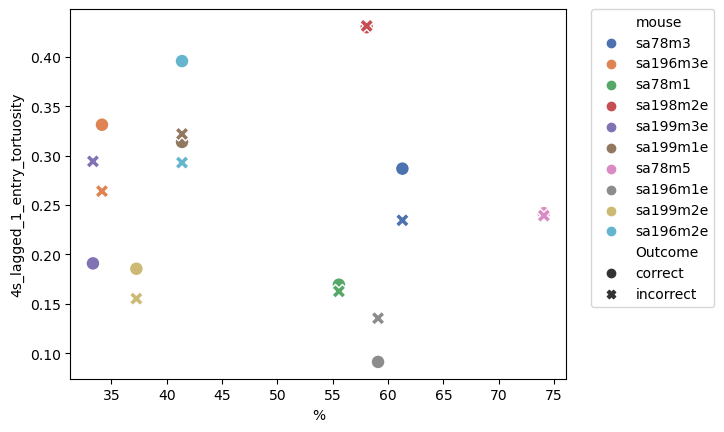

In [499]:
sns.scatterplot(data=mean_lagged_1_entry_tortuosity_4s, x = '%', y = '4s_lagged_1_entry_tortuosity', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [500]:
lagged_1_exit_tortuosity_4s = get_performance(df_grouped_scaled_ri, 'lagged_1_exit_tortuosity', 4)

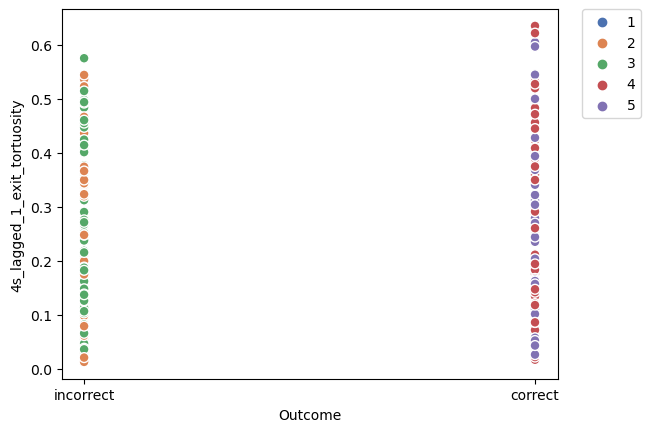

In [501]:
sns.scatterplot(data=lagged_1_exit_tortuosity_4s, x = 'Outcome', y = '4s_lagged_1_exit_tortuosity', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [502]:
mean_lagged_1_exit_tortuosity_4s = get_mean_performances(lagged_1_exit_tortuosity_4s)

In [503]:
mean_lagged_1_exit_tortuosity_4s

mean_lagged_1_exit_tortuosity_4s.to_csv('mean_exit_tortuosity_past_2.csv', sep='\t', index=False)

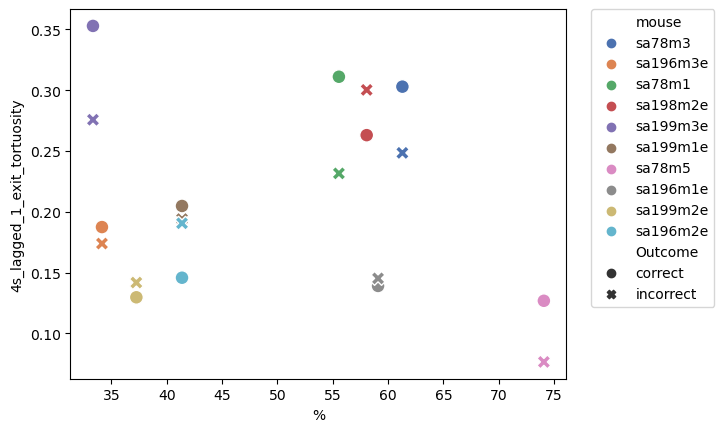

In [504]:
sns.scatterplot(data=mean_lagged_1_exit_tortuosity_4s, x = '%', y = '4s_lagged_1_exit_tortuosity', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [505]:
lagged_1_other_tortuosity_4s = get_performance(df_grouped_scaled_ri, 'lagged_1_other_tortuosity', 4)

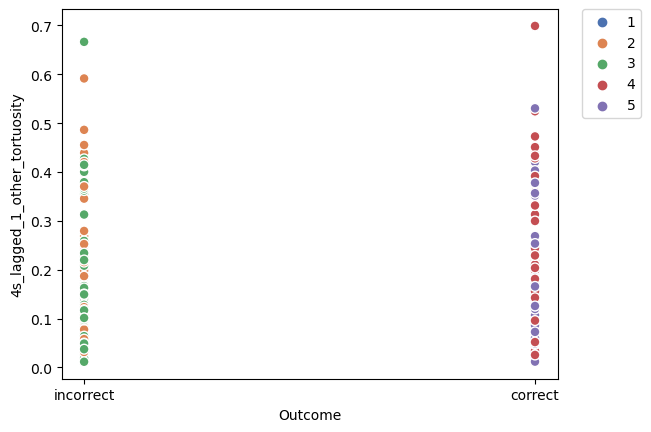

In [506]:
sns.scatterplot(data=lagged_1_other_tortuosity_4s, x = 'Outcome', y = '4s_lagged_1_other_tortuosity', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [507]:
mean_lagged_1_other_tortuosity_4s = get_mean_performances(lagged_1_other_tortuosity_4s)

In [508]:
mean_lagged_1_other_tortuosity_4s


,mouse,4s_lagged_1_other_tortuosity,%,Outcome
0,sa78m3,0.131748,61.290323,correct
1,sa78m3,0.057662,61.290323,incorrect
2,sa196m3e,0.191869,34.146341,correct
3,sa196m3e,0.127979,34.146341,incorrect
4,sa78m1,0.389969,55.555556,correct
5,sa78m1,0.249365,55.555556,incorrect
6,sa198m2e,0.186631,58.064516,correct
7,sa198m2e,0.126578,58.064516,incorrect
8,sa199m3e,0.198089,33.333333,correct
9,sa199m3e,0.212222,33.333333,incorrect


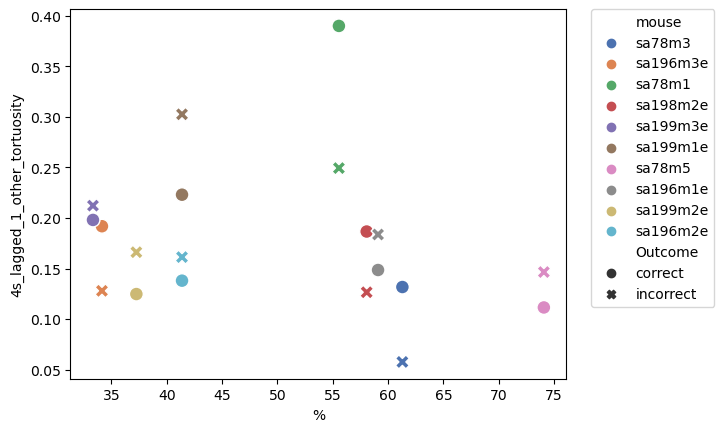

In [509]:
sns.scatterplot(data=mean_lagged_1_other_tortuosity_4s, x = '%', y = '4s_lagged_1_other_tortuosity', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [510]:
entry_latency_4s = get_performance(df_grouped_scaled_ri, 'Entry Latency', 4)

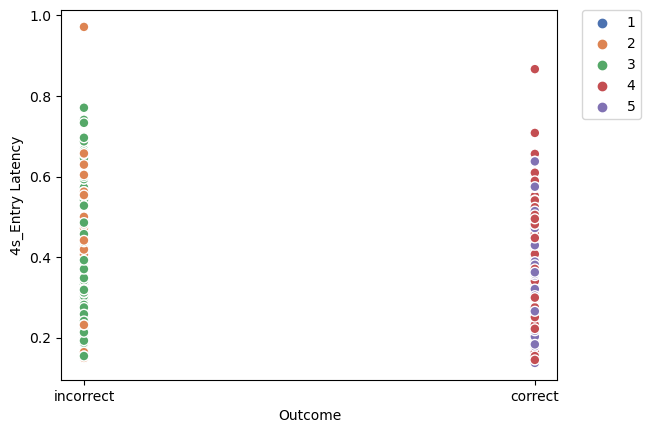

In [511]:
sns.scatterplot(data=entry_latency_4s, x = 'Outcome', y = '4s_Entry Latency', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [512]:
mean_entry_latency_4s = get_mean_performances(entry_latency_4s)

In [513]:
mean_entry_latency_4s

,mouse,4s_Entry Latency,%,Outcome
0,sa78m3,0.248684,61.290323,correct
1,sa78m3,0.302778,61.290323,incorrect
2,sa196m3e,0.290179,34.146341,correct
3,sa196m3e,0.260995,34.146341,incorrect
4,sa78m1,0.557143,55.555556,correct
5,sa78m1,0.552381,55.555556,incorrect
6,sa198m2e,0.537616,58.064516,correct
7,sa198m2e,0.519231,58.064516,incorrect
8,sa199m3e,0.347884,33.333333,correct
9,sa199m3e,0.375331,33.333333,incorrect


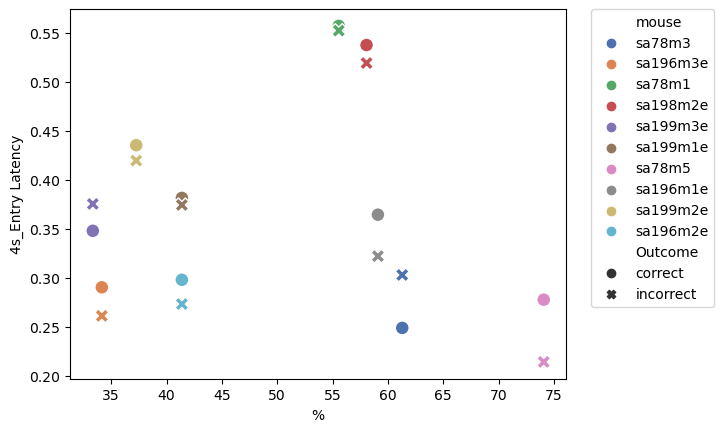

In [514]:
sns.scatterplot(data=mean_entry_latency_4s, x = '%', y = '4s_Entry Latency', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [515]:
lagged_1_new_cur_coeff_4s = get_performance(df_grouped_scaled_ri, 'New Lagged 1 Cur Coeff', 4)

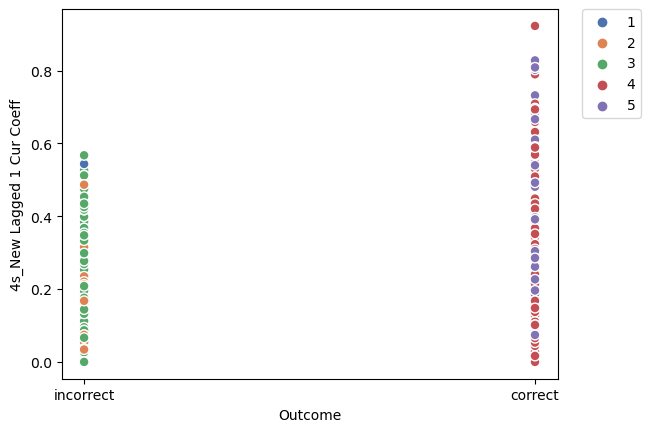

In [516]:
sns.scatterplot(data=lagged_1_new_cur_coeff_4s, x = 'Outcome', y = '4s_New Lagged 1 Cur Coeff', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [517]:
mean_lagged_1_new_cur_coeff_4s = get_mean_performances(lagged_1_new_cur_coeff_4s)

In [518]:
mean_lagged_1_new_cur_coeff_4s

,mouse,4s_New Lagged 1 Cur Coeff,%,Outcome
0,sa78m3,0.402081,61.290323,correct
1,sa78m3,0.201271,61.290323,incorrect
2,sa196m3e,0.174451,34.146341,correct
3,sa196m3e,0.226031,34.146341,incorrect
4,sa78m1,0.361985,55.555556,correct
5,sa78m1,0.326219,55.555556,incorrect
6,sa198m2e,0.321245,58.064516,correct
7,sa198m2e,0.140946,58.064516,incorrect
8,sa199m3e,0.440388,33.333333,correct
9,sa199m3e,0.152031,33.333333,incorrect


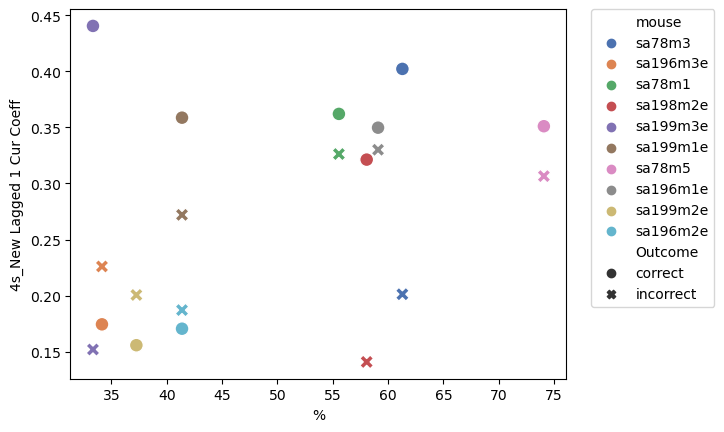

In [519]:
sns.scatterplot(data=mean_lagged_1_new_cur_coeff_4s, x = '%', y = '4s_New Lagged 1 Cur Coeff', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [520]:
middle_duration_4s = get_performance(df_grouped_scaled_ri, 'Middle Duration', 4)

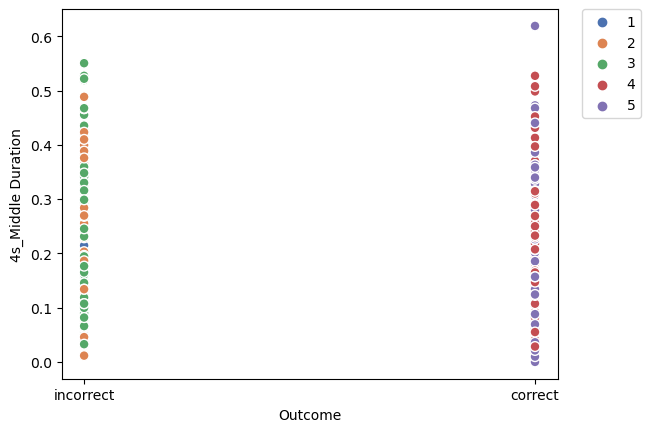

In [521]:
sns.scatterplot(data=middle_duration_4s, x = 'Outcome', y = '4s_Middle Duration', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [522]:
mean_middle_duration_4s = get_mean_performances(middle_duration_4s)

In [523]:
mean_middle_duration_4s

,mouse,4s_Middle Duration,%,Outcome
0,sa78m3,0.192380,61.290323,correct
1,sa78m3,0.168437,61.290323,incorrect
2,sa196m3e,0.252240,34.146341,correct
3,sa196m3e,0.247036,34.146341,incorrect
4,sa78m1,0.122222,55.555556,correct
5,sa78m1,0.105324,55.555556,incorrect
6,sa198m2e,0.245716,58.064516,correct
7,sa198m2e,0.228090,58.064516,incorrect
8,sa199m3e,0.136439,33.333333,correct
9,sa199m3e,0.207350,33.333333,incorrect


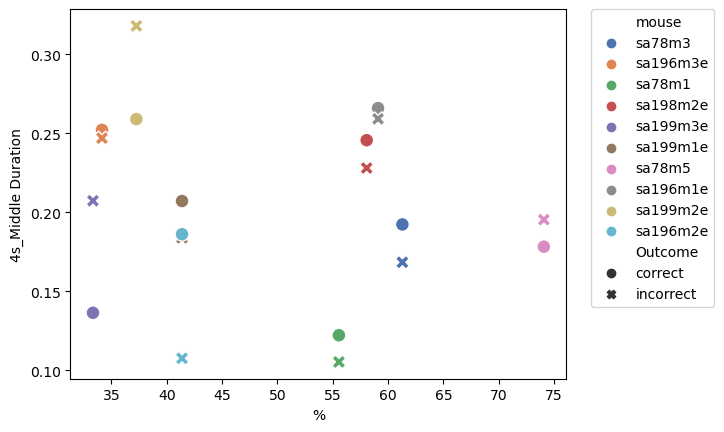

In [524]:
sns.scatterplot(data=mean_middle_duration_4s, x = '%', y = '4s_Middle Duration', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [525]:
# 5s

In [526]:
exitmidentry_duration_5s = get_performance(df_grouped_scaled_ri, 'ExitMidEntry Duration', 5)

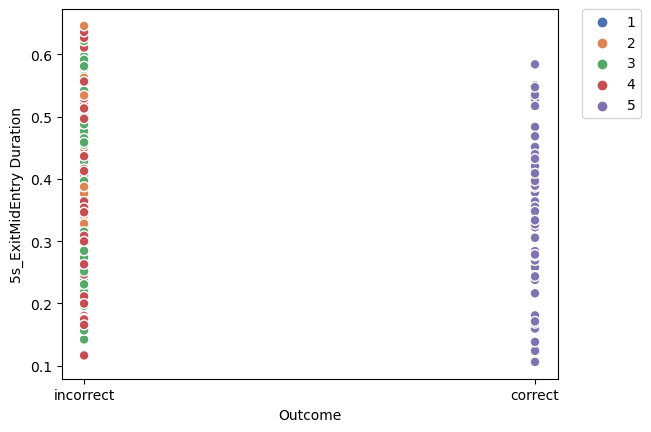

In [527]:
sns.scatterplot(data=exitmidentry_duration_5s, x = 'Outcome', y = '5s_ExitMidEntry Duration', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [528]:
mean_exitmidentry_duration_5s = get_mean_performances(exitmidentry_duration_5s)

In [529]:
mean_exitmidentry_duration_5s

,mouse,5s_ExitMidEntry Duration,%,Outcome
0,sa78m3,0.256903,35.483871,correct
1,sa78m3,0.268481,35.483871,incorrect
2,sa196m3e,0.419540,7.317073,correct
3,sa196m3e,0.397731,7.317073,incorrect
4,sa78m1,0.353381,16.666667,correct
5,sa78m1,0.344418,16.666667,incorrect
6,sa198m2e,0.466998,25.806452,correct
7,sa198m2e,0.458858,25.806452,incorrect
8,sa199m3e,0.331019,14.285714,correct
9,sa199m3e,0.362654,14.285714,incorrect


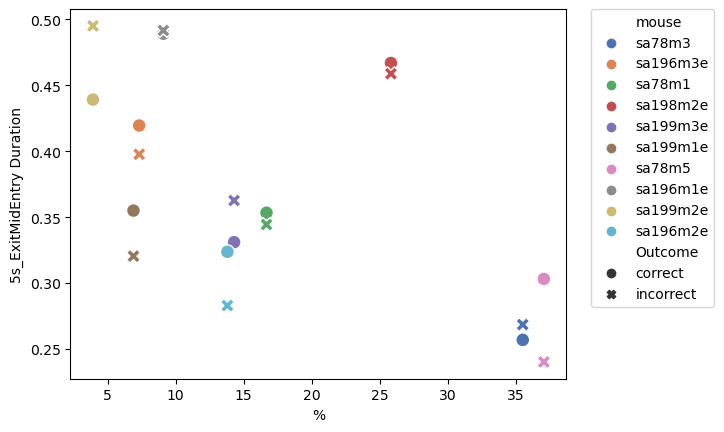

In [530]:
sns.scatterplot(data=mean_exitmidentry_duration_5s, x = '%', y = '5s_ExitMidEntry Duration', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [531]:
middle_tortuosity_5s = get_performance(df_grouped_scaled_ri, 'Middle Tortuosity', 5)

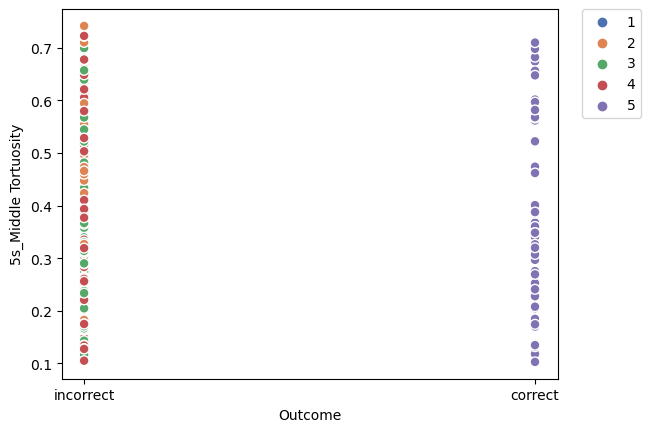

In [532]:
sns.scatterplot(data=middle_tortuosity_5s, x = 'Outcome', y = '5s_Middle Tortuosity', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [533]:
mean_middle_tortuosity_5s = get_mean_performances(middle_tortuosity_5s)

In [534]:
mean_middle_tortuosity_5s

,mouse,5s_Middle Tortuosity,%,Outcome
0,sa78m3,0.223666,35.483871,correct
1,sa78m3,0.226669,35.483871,incorrect
2,sa196m3e,0.172380,7.317073,correct
3,sa196m3e,0.206813,7.317073,incorrect
4,sa78m1,0.566951,16.666667,correct
5,sa78m1,0.564942,16.666667,incorrect
6,sa198m2e,0.664598,25.806452,correct
7,sa198m2e,0.641002,25.806452,incorrect
8,sa199m3e,0.443102,14.285714,correct
9,sa199m3e,0.417974,14.285714,incorrect


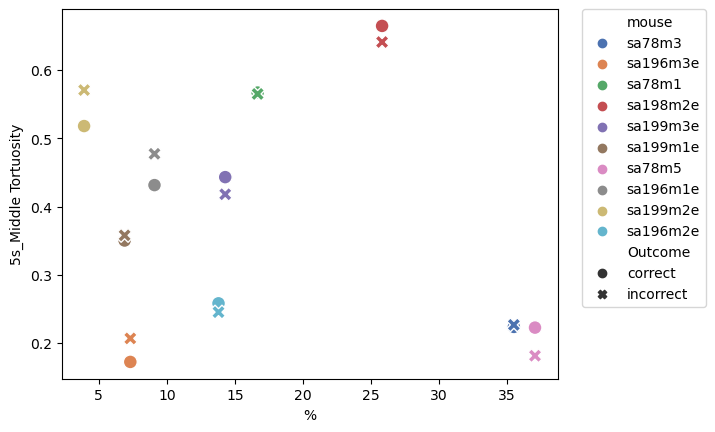

In [535]:
sns.scatterplot(data=mean_middle_tortuosity_5s, x = '%', y = '5s_Middle Tortuosity', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [536]:
new_cur_coeff_time_prop_5s = get_performance(df_grouped_scaled_ri, 'New Current Coeff Time Proportional', 5)

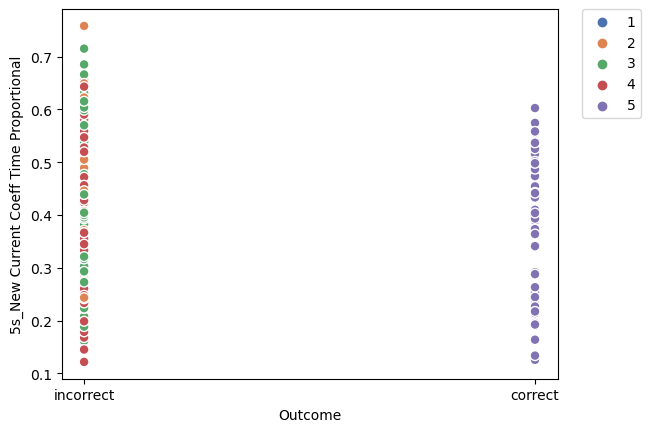

In [537]:
sns.scatterplot(data=new_cur_coeff_time_prop_5s, x = 'Outcome', y = '5s_New Current Coeff Time Proportional', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [538]:
mean_new_cur_coeff_time_prop_5s = get_mean_performances(new_cur_coeff_time_prop_5s)

In [539]:
mean_new_cur_coeff_time_prop_5s

,mouse,5s_New Current Coeff Time Proportional,%,Outcome
0,sa78m3,0.348582,35.483871,correct
1,sa78m3,0.383037,35.483871,incorrect
2,sa196m3e,0.510049,7.317073,correct
3,sa196m3e,0.446506,7.317073,incorrect
4,sa78m1,0.303876,16.666667,correct
5,sa78m1,0.305406,16.666667,incorrect
6,sa198m2e,0.442944,25.806452,correct
7,sa198m2e,0.475528,25.806452,incorrect
8,sa199m3e,0.296858,14.285714,correct
9,sa199m3e,0.377593,14.285714,incorrect


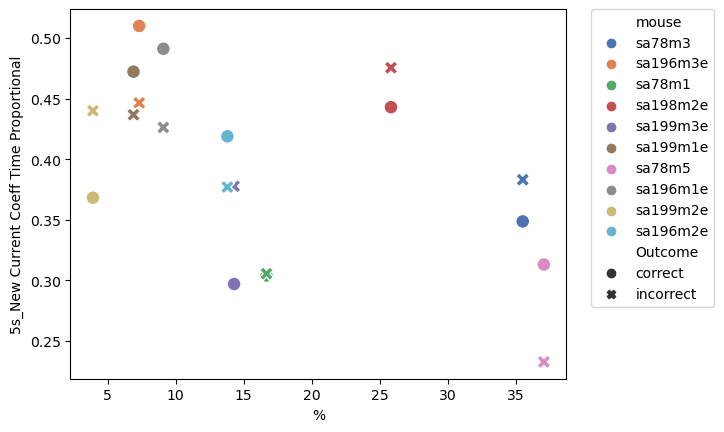

In [540]:
sns.scatterplot(data=mean_new_cur_coeff_time_prop_5s, x = '%', y = '5s_New Current Coeff Time Proportional', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [541]:
new_current_coeff_5s = get_performance(df_grouped_scaled_ri, 'New Current Coeff', 5)

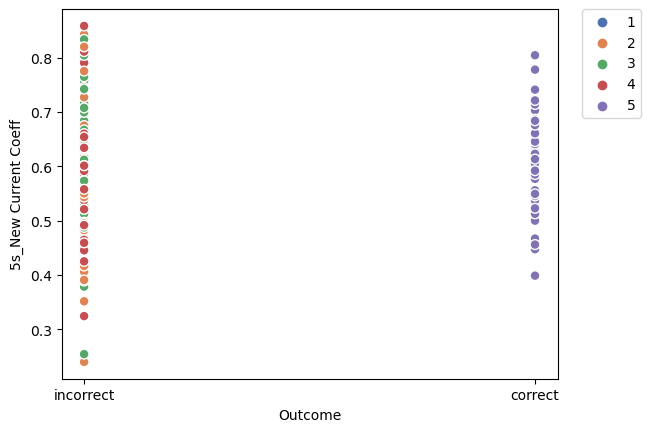

In [542]:
sns.scatterplot(data=new_current_coeff_5s, x = 'Outcome', y = '5s_New Current Coeff', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [543]:
mean_new_current_coeff_5s = get_mean_performances(new_current_coeff_5s)

In [544]:
mean_new_current_coeff_5s

,mouse,5s_New Current Coeff,%,Outcome
0,sa78m3,0.599420,35.483871,correct
1,sa78m3,0.589828,35.483871,incorrect
2,sa196m3e,0.611447,7.317073,correct
3,sa196m3e,0.592262,7.317073,incorrect
4,sa78m1,0.550194,16.666667,correct
5,sa78m1,0.563142,16.666667,incorrect
6,sa198m2e,0.630518,25.806452,correct
7,sa198m2e,0.697753,25.806452,incorrect
8,sa199m3e,0.488214,14.285714,correct
9,sa199m3e,0.583327,14.285714,incorrect


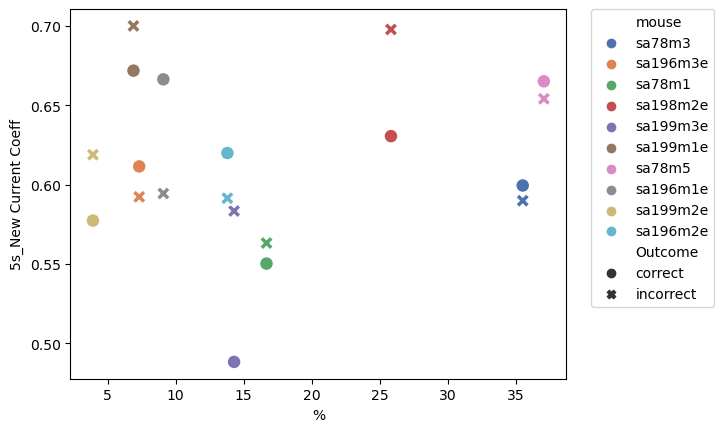

In [545]:
sns.scatterplot(data=mean_new_current_coeff_5s, x = '%', y = '5s_New Current Coeff', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [546]:
current_coeff_5s = get_performance(df_grouped_scaled_ri, 'Current Coeff', 5)

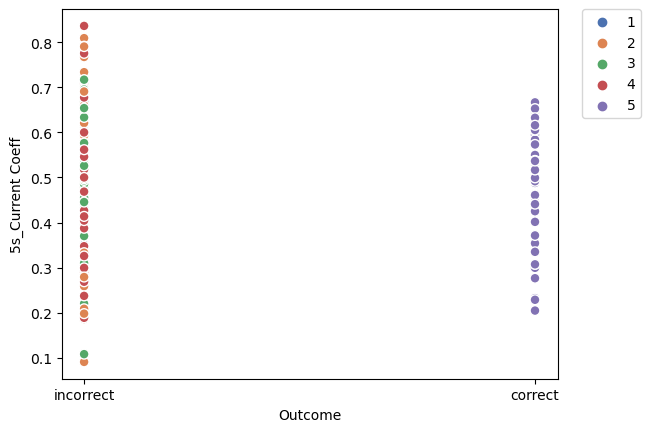

In [547]:
sns.scatterplot(data=current_coeff_5s, x = 'Outcome', y = '5s_Current Coeff', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [548]:
mean_current_coeff_5s = get_mean_performances(current_coeff_5s)

In [549]:
mean_current_coeff_5s

,mouse,5s_Current Coeff,%,Outcome
0,sa78m3,0.457004,35.483871,correct
1,sa78m3,0.480574,35.483871,incorrect
2,sa196m3e,0.553475,7.317073,correct
3,sa196m3e,0.495365,7.317073,incorrect
4,sa78m1,0.423852,16.666667,correct
5,sa78m1,0.477512,16.666667,incorrect
6,sa198m2e,0.497544,25.806452,correct
7,sa198m2e,0.600466,25.806452,incorrect
8,sa199m3e,0.316816,14.285714,correct
9,sa199m3e,0.481939,14.285714,incorrect


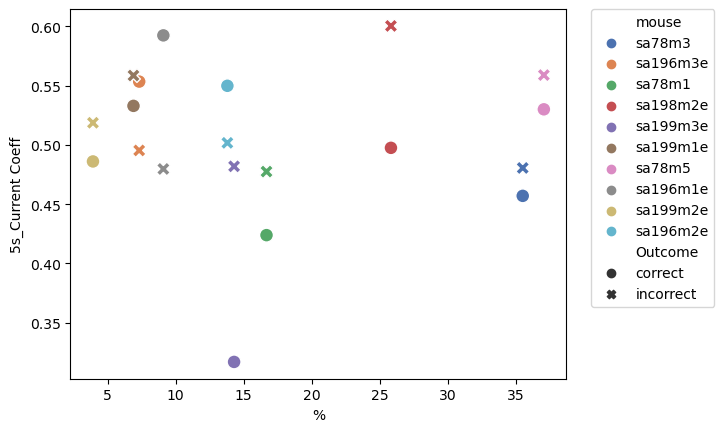

In [550]:
sns.scatterplot(data=mean_current_coeff_5s, x = '%', y = '5s_Current Coeff', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [551]:
cur_coeff_time_prop_5s = get_performance(df_grouped_scaled_ri, 'Current Coeff Time Proportional', 5)

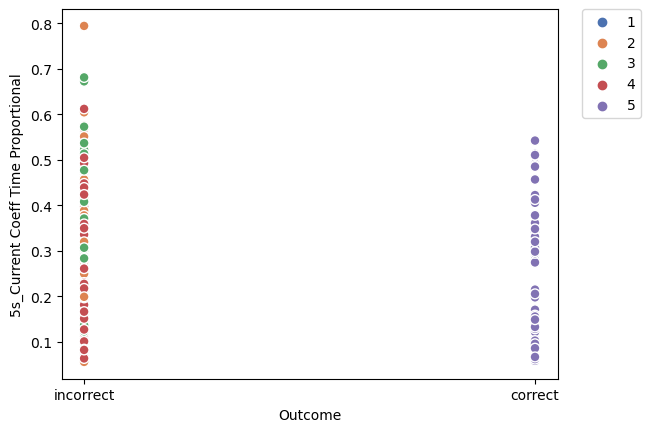

In [552]:
sns.scatterplot(data=cur_coeff_time_prop_5s, x = 'Outcome', y = '5s_Current Coeff Time Proportional', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [553]:
mean_cur_coeff_time_prop_5s = get_mean_performances(cur_coeff_time_prop_5s)

In [554]:
mean_cur_coeff_time_prop_5s

,mouse,5s_Current Coeff Time Proportional,%,Outcome
0,sa78m3,0.223643,35.483871,correct
1,sa78m3,0.258422,35.483871,incorrect
2,sa196m3e,0.425881,7.317073,correct
3,sa196m3e,0.362251,7.317073,incorrect
4,sa78m1,0.203582,16.666667,correct
5,sa78m1,0.203417,16.666667,incorrect
6,sa198m2e,0.314763,25.806452,correct
7,sa198m2e,0.334259,25.806452,incorrect
8,sa199m3e,0.188765,14.285714,correct
9,sa199m3e,0.280537,14.285714,incorrect


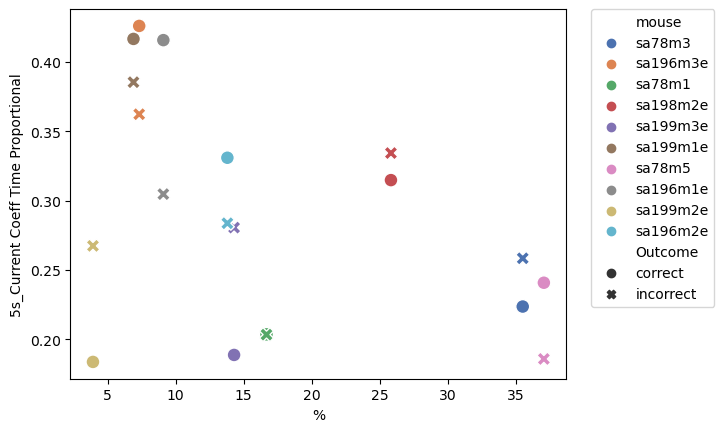

In [555]:
sns.scatterplot(data=mean_cur_coeff_time_prop_5s, x = '%', y = '5s_Current Coeff Time Proportional', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [556]:
lagged_1_duration_5s = get_performance(df_grouped_scaled_ri, 'lagged_1_duration', 5)

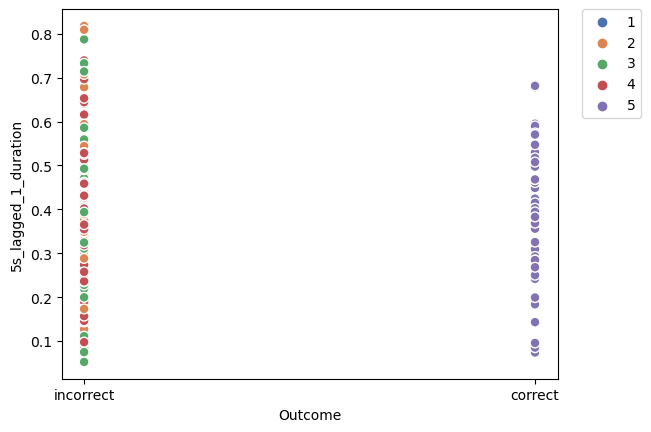

In [557]:
sns.scatterplot(data=lagged_1_duration_5s, x = 'Outcome', y = '5s_lagged_1_duration', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [558]:
mean_lagged_1_duration_5s = get_mean_performances(lagged_1_duration_5s)

In [559]:
mean_lagged_1_duration_5s
mean_lagged_1_duration_5s.to_csv('mean_arm_dur_past_2.csv', sep='\t', index=False)


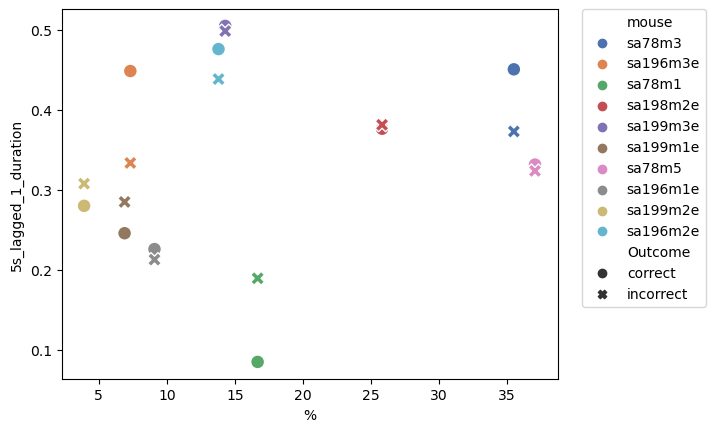

In [560]:
sns.scatterplot(data=mean_lagged_1_duration_5s, x = '%', y = '5s_lagged_1_duration', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [561]:
lagged_1_nose_time_to_max_dist_5s = get_performance(df_grouped_scaled_ri, 'lagged_1_nose_time_to_max_dist', 5)

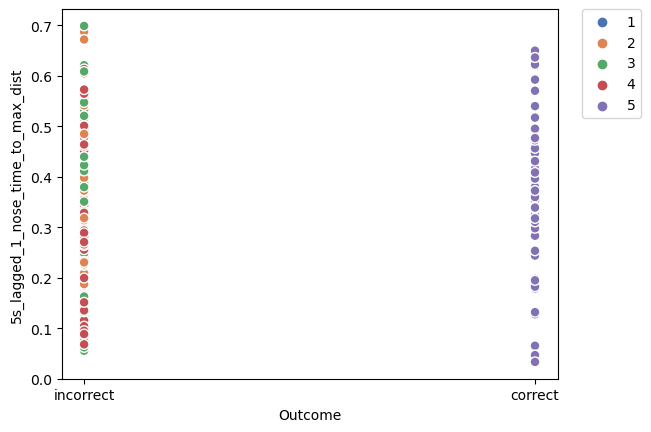

In [562]:
sns.scatterplot(data=lagged_1_nose_time_to_max_dist_5s, x = 'Outcome', y = '5s_lagged_1_nose_time_to_max_dist', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [563]:
mean_lagged_1_nose_time_to_max_dist_5s = get_mean_performances(lagged_1_nose_time_to_max_dist_5s)

In [564]:
mean_lagged_1_nose_time_to_max_dist_5s

mean_lagged_1_nose_time_to_max_dist_5s.to_csv('mean_time_to_max_past_2.csv', sep='\t', index=False)

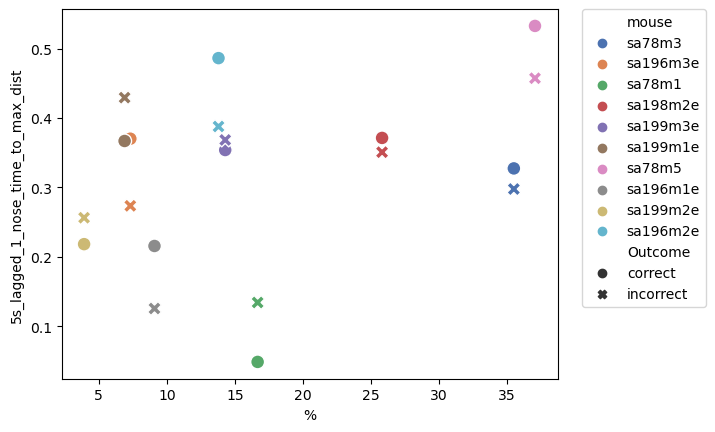

In [565]:
sns.scatterplot(data=mean_lagged_1_nose_time_to_max_dist_5s, x = '%', y = '5s_lagged_1_nose_time_to_max_dist', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [566]:
lagged_1_arm_nose_mov_5s = get_performance(df_grouped_scaled_ri, 'lagged_1_arm_nose_mov', 5)

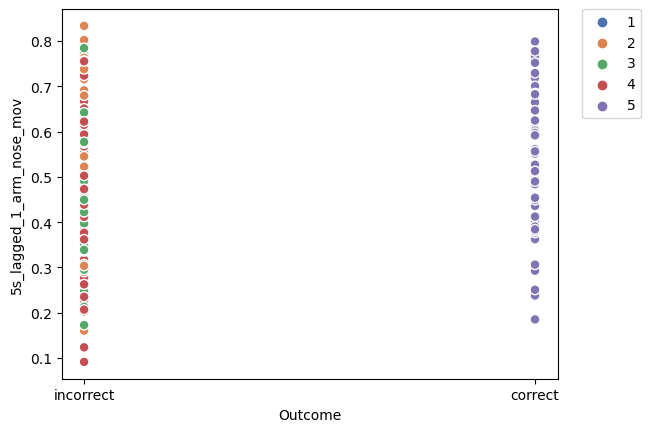

In [567]:
sns.scatterplot(data=lagged_1_arm_nose_mov_5s, x = 'Outcome', y = '5s_lagged_1_arm_nose_mov', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [568]:
mean_lagged_1_arm_nose_mov_5s = get_mean_performances(lagged_1_arm_nose_mov_5s)

In [569]:
mean_lagged_1_arm_nose_mov_5s

mean_lagged_1_arm_nose_mov_5s.to_csv('dist_in_arm_past_2_nose.csv', sep='\t', index=False)

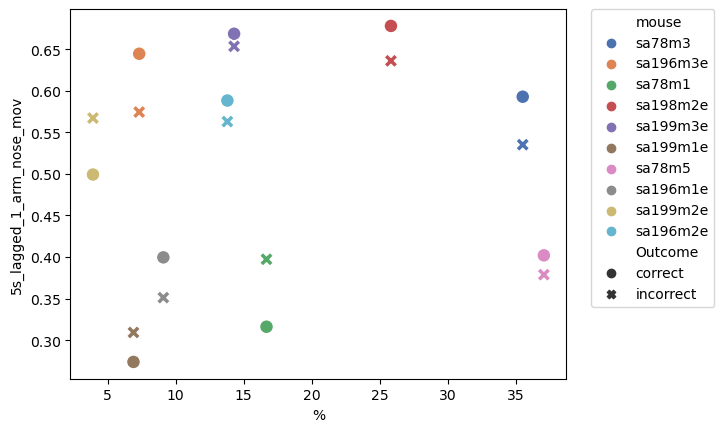

In [570]:
sns.scatterplot(data=mean_lagged_1_arm_nose_mov_5s, x = '%', y = '5s_lagged_1_arm_nose_mov', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [571]:
lagged_1_arm_nose_vel_5s = get_performance(df_grouped_scaled_ri, 'lagged_1_arm_nose_vel', 5)

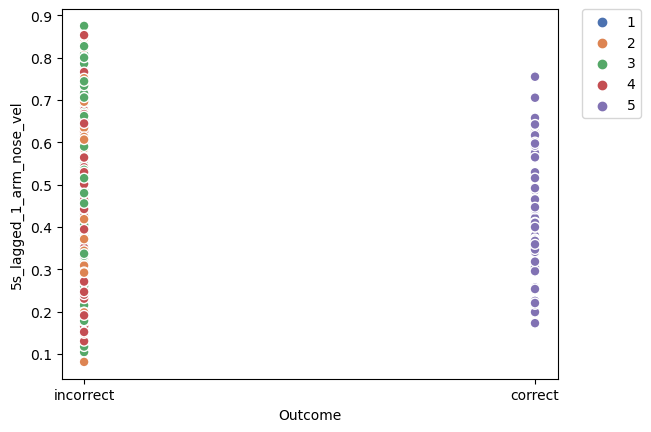

In [572]:
sns.scatterplot(data=lagged_1_arm_nose_vel_5s, x = 'Outcome', y = '5s_lagged_1_arm_nose_vel', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [573]:
mean_lagged_1_arm_nose_vel_5s = get_mean_performances(lagged_1_arm_nose_vel_5s)

In [574]:
mean_lagged_1_arm_nose_vel_5s
mean_lagged_1_arm_nose_vel_5s.to_csv('mean_vel_past_2_nose.csv', sep='\t', index=False)

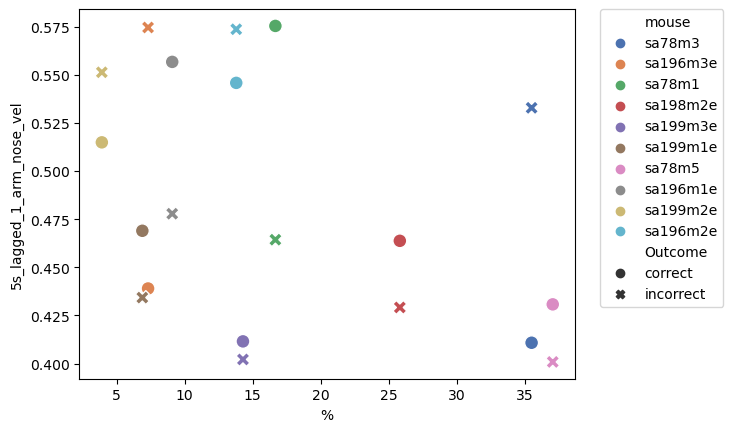

In [575]:
sns.scatterplot(data=mean_lagged_1_arm_nose_vel_5s, x = '%', y = '5s_lagged_1_arm_nose_vel', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [576]:
lagged_1_arm_tail_mov_5s = get_performance(df_grouped_scaled_ri, 'lagged_1_arm_tail_mov', 5)

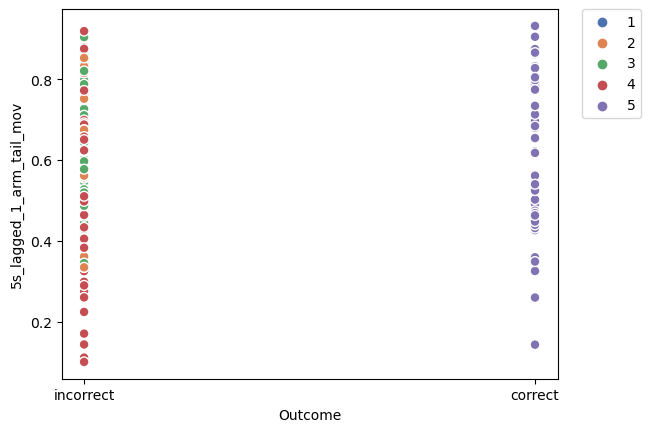

In [577]:
sns.scatterplot(data=lagged_1_arm_tail_mov_5s, x = 'Outcome', y = '5s_lagged_1_arm_tail_mov', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [578]:
mean_lagged_1_arm_tail_mov_5s = get_mean_performances(lagged_1_arm_tail_mov_5s)

In [579]:
mean_lagged_1_arm_tail_mov_5s
mean_lagged_1_arm_tail_mov_5s.to_csv('dist_in_arm_past_2_tail.csv', sep='\t', index=False)

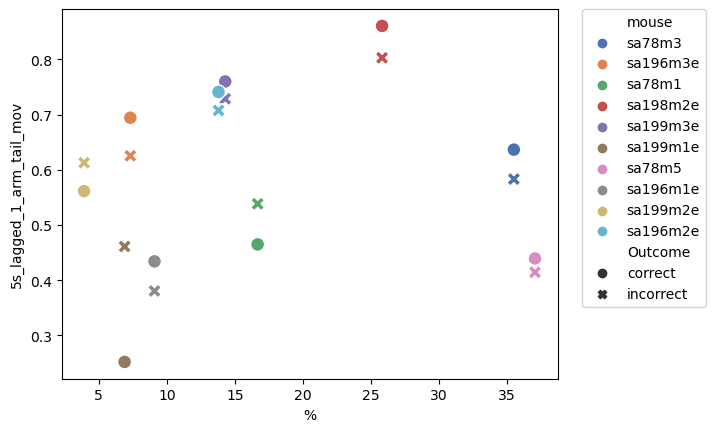

In [580]:
sns.scatterplot(data=mean_lagged_1_arm_tail_mov_5s, x = '%', y = '5s_lagged_1_arm_tail_mov', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [581]:
lagged_1_arm_tail_vel_5s = get_performance(df_grouped_scaled_ri, 'lagged_1_arm_tail_vel', 5)

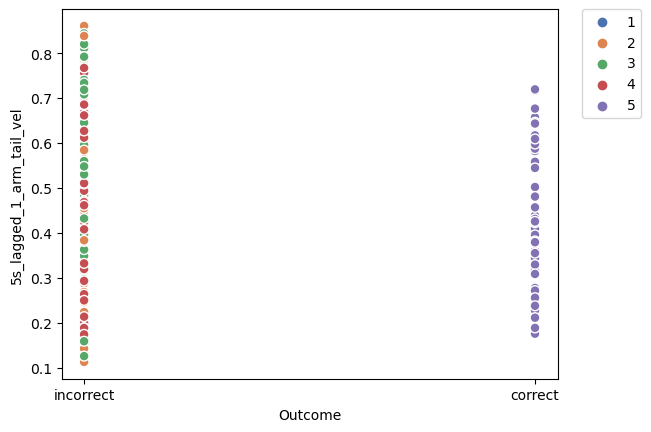

In [582]:
sns.scatterplot(data=lagged_1_arm_tail_vel_5s, x = 'Outcome', y = '5s_lagged_1_arm_tail_vel', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [583]:
mean_lagged_1_arm_tail_vel_5s = get_mean_performances(lagged_1_arm_tail_vel_5s)

In [584]:
mean_lagged_1_arm_tail_vel_5s
mean_lagged_1_arm_tail_vel_5s.to_csv('mean_vel_past_2_tail.csv', sep='\t', index=False)

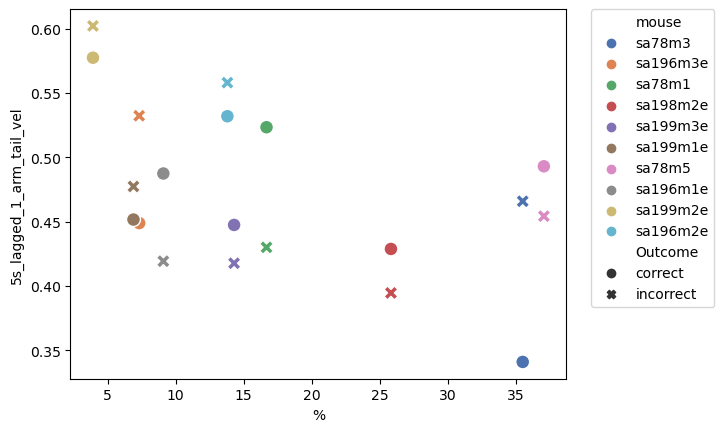

In [585]:
sns.scatterplot(data=mean_lagged_1_arm_tail_vel_5s, x = '%', y = '5s_lagged_1_arm_tail_vel', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [586]:
lagged_1_entry_tortuosity_5s = get_performance(df_grouped_scaled_ri, 'lagged_1_entry_tortuosity', 5)

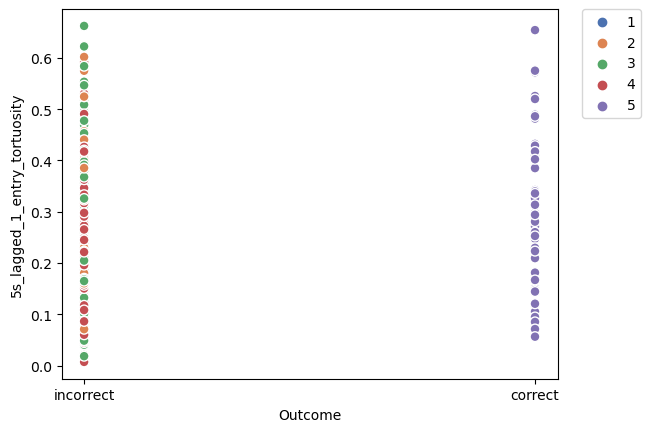

In [587]:
sns.scatterplot(data=lagged_1_entry_tortuosity_5s, x = 'Outcome', y = '5s_lagged_1_entry_tortuosity', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [588]:
mean_lagged_1_entry_tortuosity_5s = get_mean_performances(lagged_1_entry_tortuosity_5s)

In [589]:
mean_lagged_1_entry_tortuosity_5s

,mouse,5s_lagged_1_entry_tortuosity,%,Outcome
0,sa78m3,0.291483,35.483871,correct
1,sa78m3,0.244298,35.483871,incorrect
2,sa196m3e,0.396919,7.317073,correct
3,sa196m3e,0.277115,7.317073,incorrect
4,sa78m1,0.098377,16.666667,correct
5,sa78m1,0.179974,16.666667,incorrect
6,sa198m2e,0.429737,25.806452,correct
7,sa198m2e,0.426523,25.806452,incorrect
8,sa199m3e,0.222910,14.285714,correct
9,sa199m3e,0.265254,14.285714,incorrect


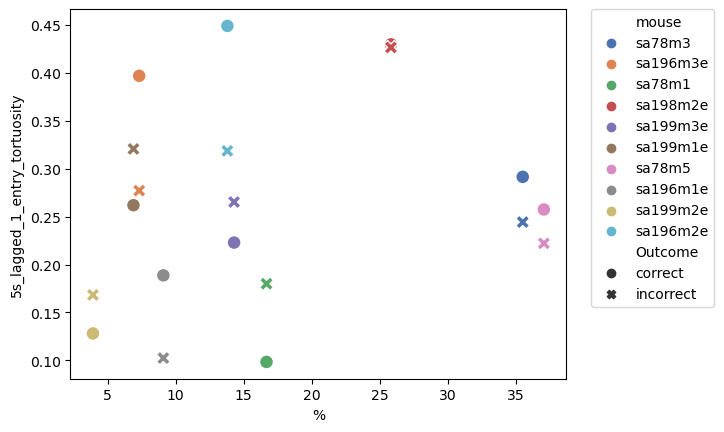

In [590]:
sns.scatterplot(data=mean_lagged_1_entry_tortuosity_5s, x = '%', y = '5s_lagged_1_entry_tortuosity', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [591]:
lagged_1_exit_tortuosity_5s = get_performance(df_grouped_scaled_ri, 'lagged_1_exit_tortuosity', 5)

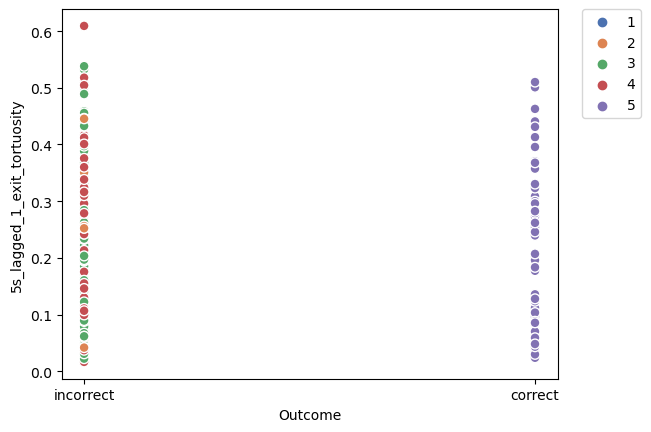

In [592]:
sns.scatterplot(data=lagged_1_exit_tortuosity_5s, x = 'Outcome', y = '5s_lagged_1_exit_tortuosity', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [593]:
mean_lagged_1_exit_tortuosity_5s = get_mean_performances(lagged_1_exit_tortuosity_5s)

In [594]:
mean_lagged_1_exit_tortuosity_5s

mean_lagged_1_exit_tortuosity_5s.to_csv('mean_exit_tortuosity_past_2.csv', sep='\t', index=False)

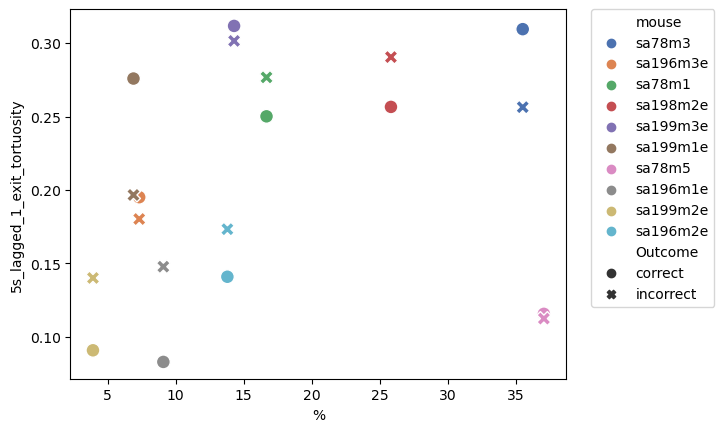

In [595]:
sns.scatterplot(data=mean_lagged_1_exit_tortuosity_5s, x = '%', y = '5s_lagged_1_exit_tortuosity', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [596]:
lagged_1_other_tortuosity_5s = get_performance(df_grouped_scaled_ri, 'lagged_1_other_tortuosity', 5)

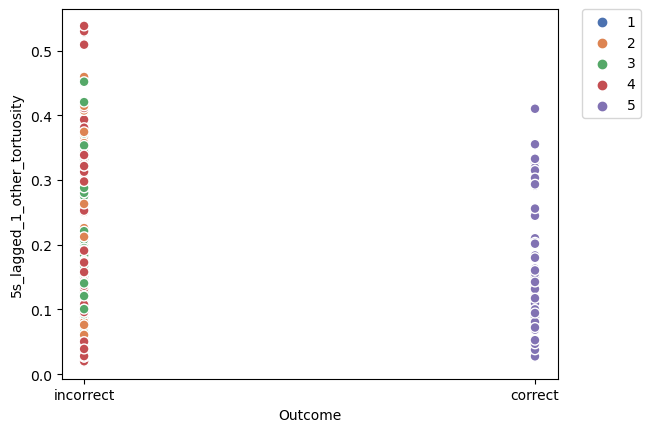

In [597]:
sns.scatterplot(data=lagged_1_other_tortuosity_5s, x = 'Outcome', y = '5s_lagged_1_other_tortuosity', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [598]:
mean_lagged_1_other_tortuosity_5s = get_mean_performances(lagged_1_other_tortuosity_5s)

In [599]:
mean_lagged_1_other_tortuosity_5s


,mouse,5s_lagged_1_other_tortuosity,%,Outcome
0,sa78m3,0.155283,35.483871,correct
1,sa78m3,0.072633,35.483871,incorrect
2,sa196m3e,0.185130,7.317073,correct
3,sa196m3e,0.146942,7.317073,incorrect
4,sa78m1,0.263375,16.666667,correct
5,sa78m1,0.335520,16.666667,incorrect
6,sa198m2e,0.141942,25.806452,correct
7,sa198m2e,0.169807,25.806452,incorrect
8,sa199m3e,0.210088,14.285714,correct
9,sa199m3e,0.206227,14.285714,incorrect


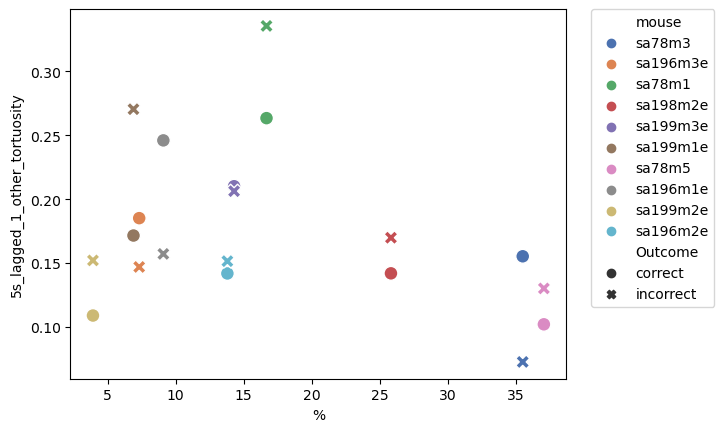

In [600]:
sns.scatterplot(data=mean_lagged_1_other_tortuosity_5s, x = '%', y = '5s_lagged_1_other_tortuosity', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [601]:
entry_latency_5s = get_performance(df_grouped_scaled_ri, 'Entry Latency', 5)

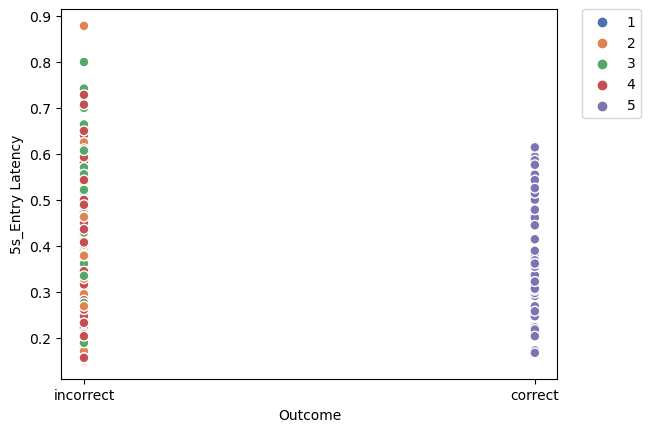

In [602]:
sns.scatterplot(data=entry_latency_5s, x = 'Outcome', y = '5s_Entry Latency', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [603]:
mean_entry_latency_5s = get_mean_performances(entry_latency_5s)

In [604]:
mean_entry_latency_5s

,mouse,5s_Entry Latency,%,Outcome
0,sa78m3,0.251989,35.483871,correct
1,sa78m3,0.277500,35.483871,incorrect
2,sa196m3e,0.294271,7.317073,correct
3,sa196m3e,0.269223,7.317073,incorrect
4,sa78m1,0.557143,16.666667,correct
5,sa78m1,0.561905,16.666667,incorrect
6,sa198m2e,0.534180,25.806452,correct
7,sa198m2e,0.533628,25.806452,incorrect
8,sa199m3e,0.361111,14.285714,correct
9,sa199m3e,0.369406,14.285714,incorrect


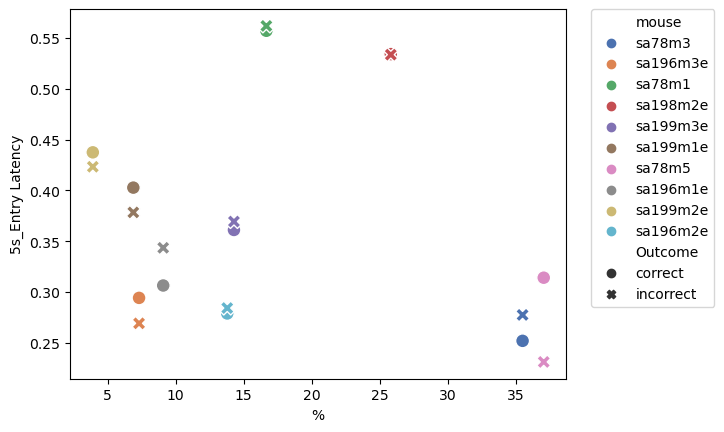

In [605]:
sns.scatterplot(data=mean_entry_latency_5s, x = '%', y = '5s_Entry Latency', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [606]:
lagged_1_new_cur_coeff_5s = get_performance(df_grouped_scaled_ri, 'New Lagged 1 Cur Coeff', 5)

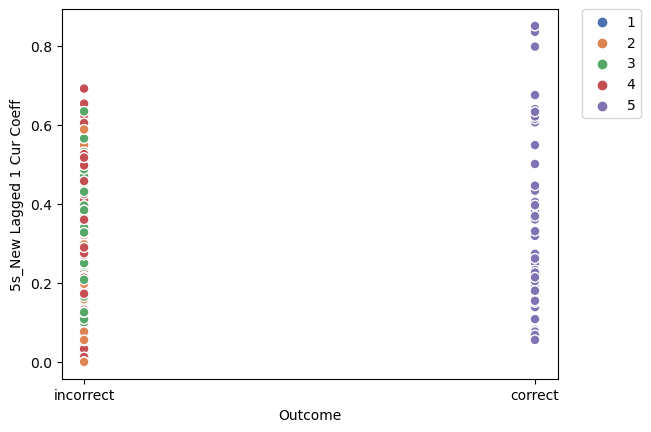

In [607]:
sns.scatterplot(data=lagged_1_new_cur_coeff_5s, x = 'Outcome', y = '5s_New Lagged 1 Cur Coeff', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [608]:
mean_lagged_1_new_cur_coeff_5s = get_mean_performances(lagged_1_new_cur_coeff_5s)

In [609]:
mean_lagged_1_new_cur_coeff_5s

,mouse,5s_New Lagged 1 Cur Coeff,%,Outcome
0,sa78m3,0.404839,35.483871,correct
1,sa78m3,0.279473,35.483871,incorrect
2,sa196m3e,0.110427,7.317073,correct
3,sa196m3e,0.218532,7.317073,incorrect
4,sa78m1,0.389094,16.666667,correct
5,sa78m1,0.348924,16.666667,incorrect
6,sa198m2e,0.303133,25.806452,correct
7,sa198m2e,0.222471,25.806452,incorrect
8,sa199m3e,0.524035,14.285714,correct
9,sa199m3e,0.207447,14.285714,incorrect


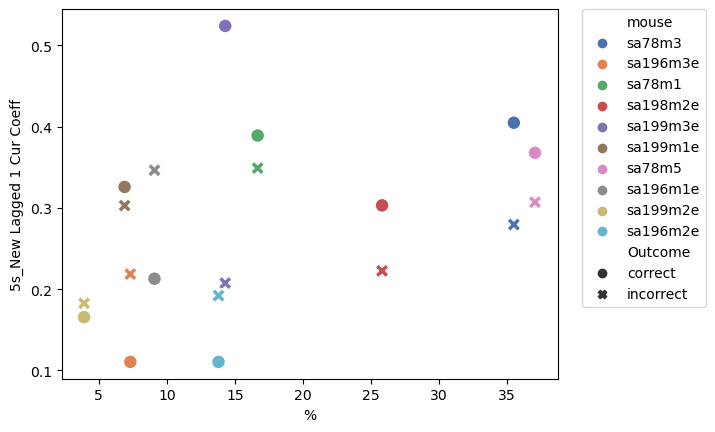

In [610]:
sns.scatterplot(data=mean_lagged_1_new_cur_coeff_5s, x = '%', y = '5s_New Lagged 1 Cur Coeff', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [611]:
middle_duration_5s = get_performance(df_grouped_scaled_ri, 'Middle Duration', 5)

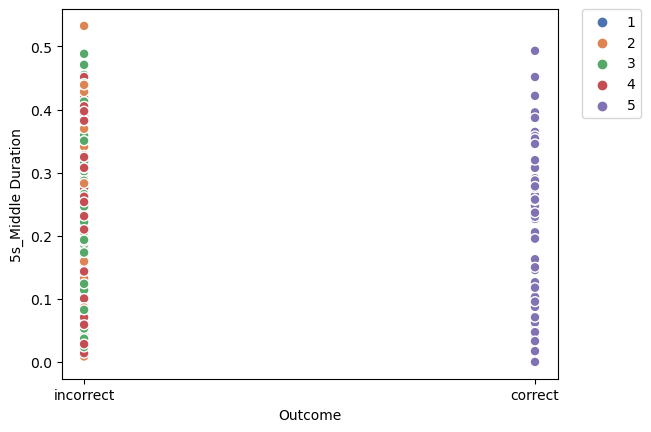

In [612]:
sns.scatterplot(data=middle_duration_5s, x = 'Outcome', y = '5s_Middle Duration', hue =  'Choice Output', palette = 'deep', s=200, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)

In [613]:
mean_middle_duration_5s = get_mean_performances(middle_duration_5s)

In [614]:
mean_middle_duration_5s

,mouse,5s_Middle Duration,%,Outcome
0,sa78m3,0.179367,35.483871,correct
1,sa78m3,0.180576,35.483871,incorrect
2,sa196m3e,0.263201,7.317073,correct
3,sa196m3e,0.246548,7.317073,incorrect
4,sa78m1,0.165278,16.666667,correct
5,sa78m1,0.101204,16.666667,incorrect
6,sa198m2e,0.260728,25.806452,correct
7,sa198m2e,0.230045,25.806452,incorrect
8,sa199m3e,0.138406,14.285714,correct
9,sa199m3e,0.190157,14.285714,incorrect


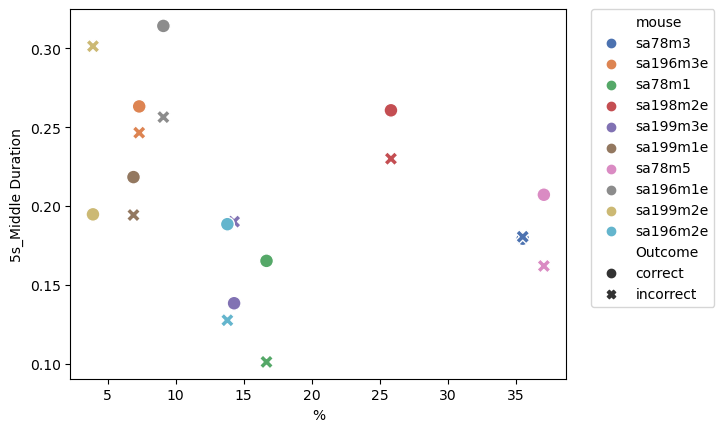

In [615]:
sns.scatterplot(data=mean_middle_duration_5s, x = '%', y = '5s_Middle Duration', style =  'Outcome', hue = 'mouse', palette = 'deep', s=100, marker=".", linewidth=1, alpha=1)
plt.legend(bbox_to_anchor=(1.05,1), loc = 2, borderaxespad=0.)